# Transcription Factor Project - KOLF2.1J Dataset QC
**Robin Anwyl, UCSD Subramaniam Lab**

**Goal:** Analyze the KOLF2.1J Perturb-seq dataset from the Nourreddine et al. (2024) preprint to investigate the effects of transcription factor knockdowns (TF KDs)

**Guiding Questions:** What do TF KD effects reveal about:
* the transcriptional regulatory network of hiPSCs? 
* TF crosstalk and co-regulation?
* cell lineage?
* how TFs influence chromatin remodeling?

***

# Import statements

Note: use terminal command " watch -n 0.1 free -h " to watch how much memory is being used

In [5]:
import sys
import os
repo_root = "/home/ranwyl/KOLF2.1J_Perturbation_Cell_Atlas/"
if repo_root not in sys.path:
    sys.path.insert(0, "/home/ranwyl/KOLF2.1J_Perturbation_Cell_Atlas/")

import psp
import gc
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'

# Convert environment.yml to requirements.txt

In [12]:
pkg_list = ["numpy", "scipy", "pandas", "matplotlib", "seaborn", "plotly", "tqdm", 
              "numba", "joblib", "scanpy", "anndata", "mudata", "muon", "harmonypy", 
              "umap-learn", "seacells", "pydeseq2", "pyranges", "sorted_nearest", "networkx", 
              "igraph", "dcor", "natsort", "statsmodels", "patsy", "toolz", "plotnine", "venn", 
              "notebook", "ipykernel", "ipywidgets", "torch", "triton", "ml-dtypes", "requests", 
              "scikit-learn", "scikit-misc", "pynndescent", "sympy"]
keep = []
with open("/home/ranwyl/KOLF2.1J_Perturbation_Cell_Atlas/environment.yml") as f:
    for i in range(7):
        next(f)
    for line in f:
        pkg = line.split("-", 1)[1].strip()
        if "==" in pkg:
            pkg = "==".join(pkg.split("==")[:2])
        else:
            pkg = "==".join(pkg.split("=", 2)[:2])
        if pkg.startswith(tuple(pkg_list)):
            keep.append(pkg)

with open("/home/ranwyl/psp_env/requirements.txt", "w") as out:
    out.write("\n".join(sorted(set(keep))) + "\n")

# Initial Data QC and Cleaning

In [2]:
import anndata as ad
import muon as mu
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def tf_project_default_qc(input_dict: dict) -> ad.AnnData:
    """
    Version of psp.qc.default_qc() that takes a .h5mu file 
    instead of 10x Genomics output files.
    """

    # Validate required inputs
    required_keys = [
        'mdata_dir', 'protospacer_calls_file', 'aggregation_csv', 
        'cell_type', 'perturbation_type', 'pre_qc_save_path',
        'final_save_path', 'gene_id_filepath', 'obs_key', 'var_key', 
        'ntc_label'
    ]
    
    for key in required_keys:
            assert key in input_dict, f"Missing required key in input_dict: {key}"
            assert isinstance(input_dict[key], str) and input_dict[key], f"{key} must be a non-empty string."

    # Validate file paths
    assert os.path.exists(input_dict['mdata_dir']), f"mdata_dir does not exist: {input_dict['mdata_dir']}"
    assert os.path.exists(input_dict['protospacer_calls_file']), f"protospacer_calls_file does not exist: {input_dict['protospacer_calls_file']}"
    assert os.path.exists(input_dict['aggregation_csv']), f"aggregation_csv does not exist: {input_dict['aggregation_csv']}"
    assert os.path.exists(input_dict['gene_id_filepath']), f"gene_id_filepath does not exist: {input_dict['gene_id_filepath']}"
    
    # Read in .h5mu file (MuData object)
    print("Reading .h5mu file...")
    mdata = mu.read_h5mu(input_dict['mdata_dir'])
    adata = mdata.mod["rna"].copy()
    
    # Assign protospacers
    print("Assigning protospacers...")
    adata = psp.qc.assign_protospacers(
        adata,
        protospacer_calls_file_path=input_dict['protospacer_calls_file'],
        NTC_Delimiter=input_dict['ntc_sgRNA_prefix']
    )
    
    # Create channel dictionary from aggregation CSV
    print("Creating channel dictionary...")
    d = pd.read_csv(input_dict['aggregation_csv'])
    channel_dict = {str(i+1): channel for i, channel in enumerate(d["sample_id"])}
    
    # Get optional treatment dictionary
    treatment_dict = input_dict.get('treatment_dict', None)
    
    # Assign metadata
    print("Assigning metadata...")
    adata = psp.qc.assign_metadata(
        adata=adata,
        cell_type=input_dict['cell_type'],
        perturbation_type=input_dict['perturbation_type'],
        channel_dict=channel_dict,
        treatment_dict=treatment_dict,
        gene_id_filepath=input_dict['gene_id_filepath'],
        obs_key=input_dict['obs_key'],
        var_key=input_dict['var_key'],
        ntc_label=input_dict['ntc_label'],
        ntc_sgRNA_prefix=input_dict['ntc_sgRNA_prefix']
    )
    
    # Convert n_gRNA_UMIs to string
    adata.obs['n_gRNA_UMIs'] = adata.obs['n_gRNA_UMIs'].astype(str)

    if 'remove_batch_duplicates' in input_dict:
        if input_dict['remove_batch_duplicates']:
            print("Removing perturbations present in multiple batches...")
            adata = psp.qc.remove_batch_duplicates(adata)
    
    # Save data after sgRNA assignment but before QC
    print(f"Saving pre-QC data to {input_dict['pre_qc_save_path']}...")
    adata.write(input_dict['pre_qc_save_path'])

    # Save data after sgRNA assignment but before QC
    # Accidentally copy pasted this part twice
    print(f"Saving pre-QC data to {input_dict['pre_qc_save_path']}...")
    adata.write(input_dict['pre_qc_save_path'])
    
    # Perform general QC
    print("Performing general QC...")
    adata = psp.qc.general_qc(adata)
    
    # Perform dead cell QC
    print("Performing dead cell QC...")
    mt_MADs = input_dict.get('mt_MADs', 5)
    count_MADs = input_dict.get('count_MADs', 5)
    ribo_MADs = input_dict.get('ribo_MADs', 5)
    
    adata = psp.qc.dead_cell_qc(
        adata,
        mt_MADs=mt_MADs,
        count_MADs=count_MADs,
        ribo_MADs=ribo_MADs
    )
    
    # Perform doublet detection sanity check
    print("Performing doublet detection sanity check...")
    psp.pl.doublet_detection_sanity_check(adata)
    
    # Save final file
    print(f"Saving final QC file to {input_dict['final_save_path']}...")
    adata.write(input_dict['final_save_path'])
    
    return adata

Reading .h5mu file...
Assigning protospacers...


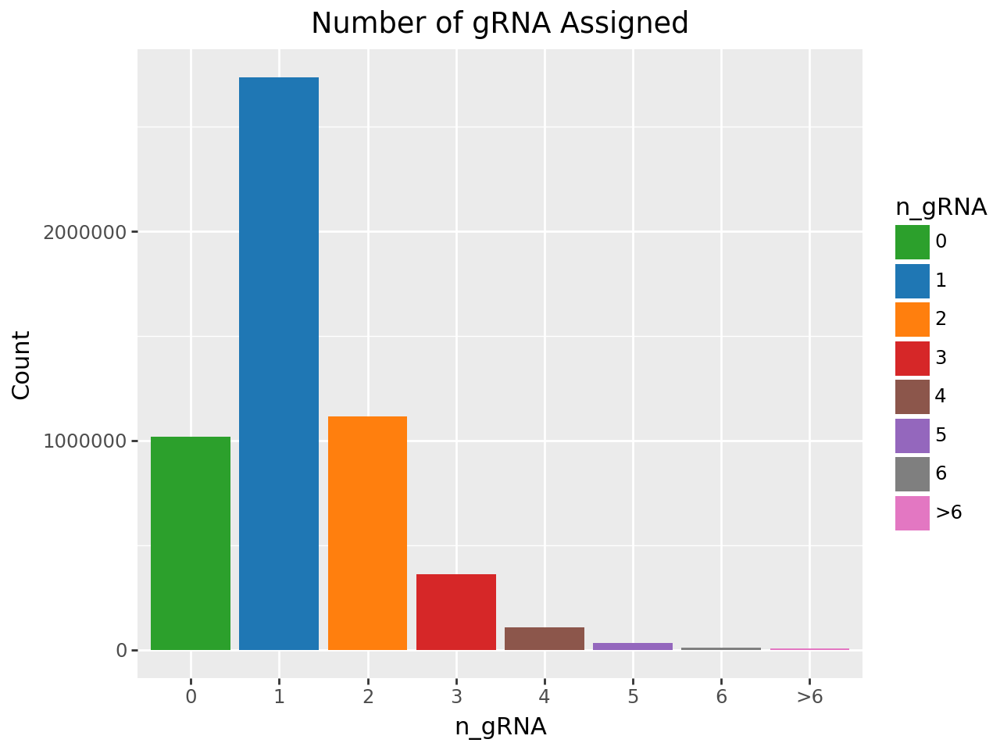

Cells without confident sgRNA calls: 18.89%
Estimated Multiplet Rate: 30.33%


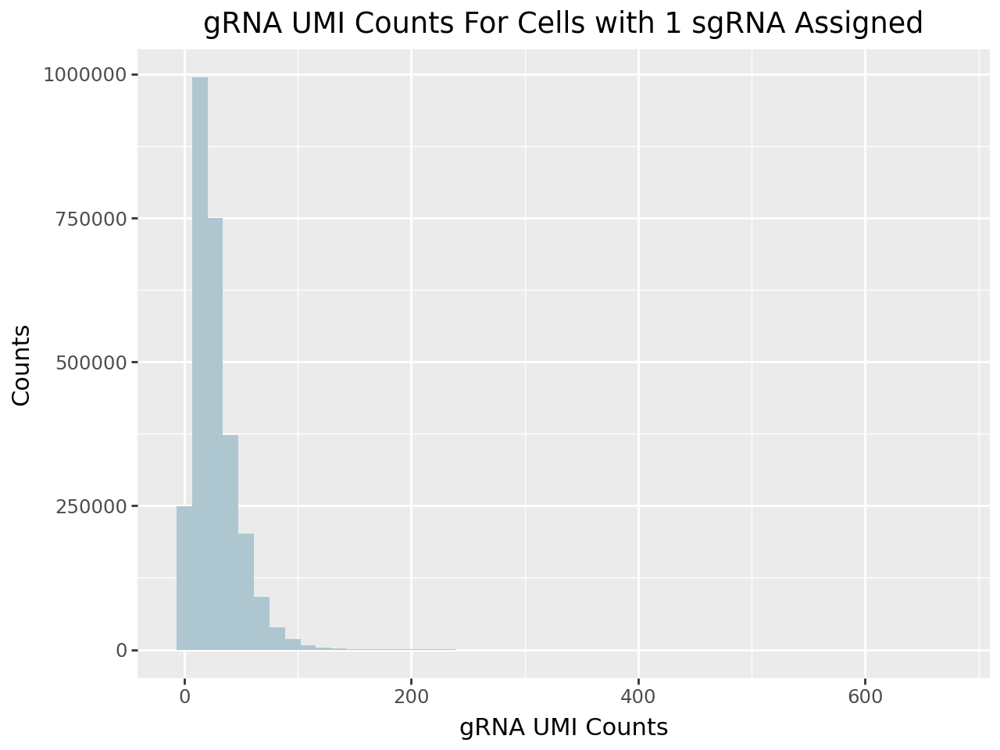

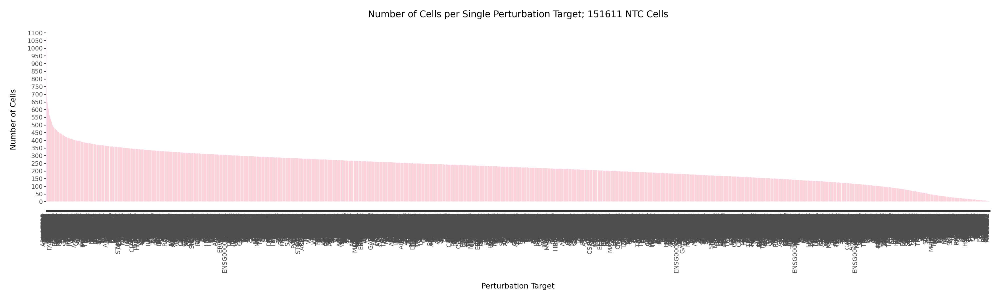

Number of perturbations with >= 50 cells with single guide assigned: 10933/11687 (93.55%)
Creating channel dictionary...
Assigning metadata...


/home/ranwyl/KOLF2.1J_Perturbation_Cell_Atlas/psp/qc/quality_control.py:353: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


Removing perturbations present in multiple batches...
Number of genes present in multiple batches: 30
(['AGAP4', 'AK6', 'AZI2', 'BORCS8', 'CCDC74A', 'CCZ1', 'CENPVL1', 'CKMT1A', 'CPNE1', 'CTAGE15', 'CTAGE4', 'ERV3-1', 'F8A1', 'FAM72B', 'HAUS3', 'KAT14', 'KIAA1586', 'KYAT3', 'NPIPA8', 'NPIPB13', 'PCDHB13', 'PITPNM1', 'PURB', 'RABL2B', 'SLX1A', 'SMN1', 'TCEAL2', 'TIMM23', 'TRAPPC2B', 'ZBED6'])
Selecting the batch with the most sgRNAs per gene
Saving pre-QC data to /home/ranwyl/data_tf_project/KOLF_Pan_Genome_Pre_QC.h5ad...
Saving pre-QC data to /home/ranwyl/data_tf_project/KOLF_Pan_Genome_Pre_QC.h5ad...
Performing general QC...


In [ ]:
mdata_dir = "/home/ranwyl/data_tf_project/KOLF_Pan_Genome_Aggregate.h5mu"
protospacer_calls_file = "/home/ranwyl/data_tf_project/input_files/protospacer_calls_per_cell.csv"
aggregation_csv = "/home/ranwyl/data_tf_project/input_files/aggregation_csv.csv"
cell_type = "KRAB-ZIM3-dCas9 KOLF2.1J hiPSC"
perturbation_type = "CRISPRi"
pre_qc_save_path = "/home/ranwyl/data_tf_project/KOLF_Pan_Genome_Pre_QC.h5ad"
final_save_path = "/home/ranwyl/data_tf_project/KOLF_Pan_Genome_QC_Filtered.h5ad"
gene_id_filepath = "/home/ranwyl/data_tf_project/input_files/gene_ids.txt"
obs_key = "gene_target_ensembl_id"
var_key = "gene_ids"
ntc_label = "NTC"
ntc_sgRNA_prefix = "Non-Targeting"
remove_batch_duplicates = True
count_MADs = 3 # Different from default 5

input_dict = {
    "mdata_dir": mdata_dir,
    "protospacer_calls_file": protospacer_calls_file,
    "aggregation_csv": aggregation_csv,
    "cell_type": cell_type,
    "perturbation_type": perturbation_type,
    "pre_qc_save_path": pre_qc_save_path,
    "final_save_path": final_save_path,
    "gene_id_filepath": gene_id_filepath,
    "obs_key": obs_key,
    "var_key": var_key,
    "ntc_label": ntc_label,
    "ntc_sgRNA_prefix": ntc_sgRNA_prefix,
    "remove_batch_duplicates": remove_batch_duplicates,
    "count_MADs": count_MADs
}

adata = tf_project_default_qc(input_dict)

Restarted kernel due to high RAM usage

Inspect dataset pre-basic QC

In [2]:
import anndata as ad

In [3]:
pre_qc_file_path = "/home/ranwyl/data_tf_project/KOLF_Pan_Genome_Pre_QC.h5ad"
adata = ad.read_h5ad(pre_qc_file_path, backed="r")
adata

AnnData object with n_obs × n_vars = 2731007 × 38606 backed at '/home/ranwyl/data_tf_project/KOLF_Pan_Genome_Pre_QC.h5ad'
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'batch', 'perturbation', 'gene_target_ensembl_id'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells'
    layers: 'counts'

Restart kernel

In [3]:
import anndata as ad
import muon as mu
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def tf_project_general_qc_cell_qc(adata, input_dict) -> ad.AnnData:
    """
    QC steps
    """
    # Perform general QC
    print("Performing general QC...")
    adata = psp.qc.general_qc(adata)
    
    # Perform dead cell QC
    print("Performing dead cell QC...")
    mt_MADs = input_dict.get('mt_MADs', 5)
    count_MADs = input_dict.get('count_MADs', 5)
    ribo_MADs = input_dict.get('ribo_MADs', 5)
    
    adata = psp.qc.dead_cell_qc(
        adata,
        mt_MADs=mt_MADs,
        count_MADs=count_MADs,
        ribo_MADs=ribo_MADs
    )
    
    # Perform doublet detection sanity check
    print("Performing doublet detection sanity check...")
    psp.pl.doublet_detection_sanity_check(adata)
    
    # Save final file
    print(f"Saving final QC file to {input_dict['final_save_path']}...")
    adata.write(input_dict['final_save_path'])
    
    return adata

Filter cells on 3 count MADs (different from default 5), 5 mitochondrial MADs, and 5 ribosomal MADs

Performing general QC...
normalizing counts per cell
    finished (0:00:17)


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

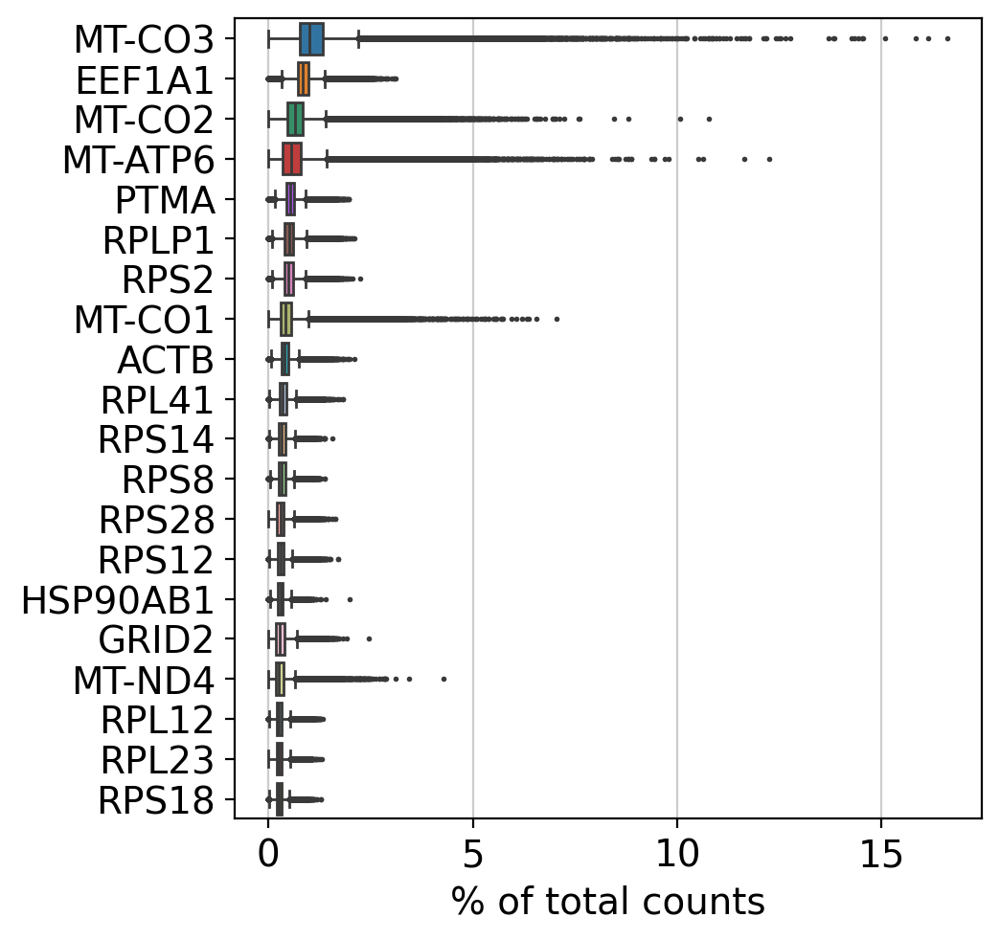

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

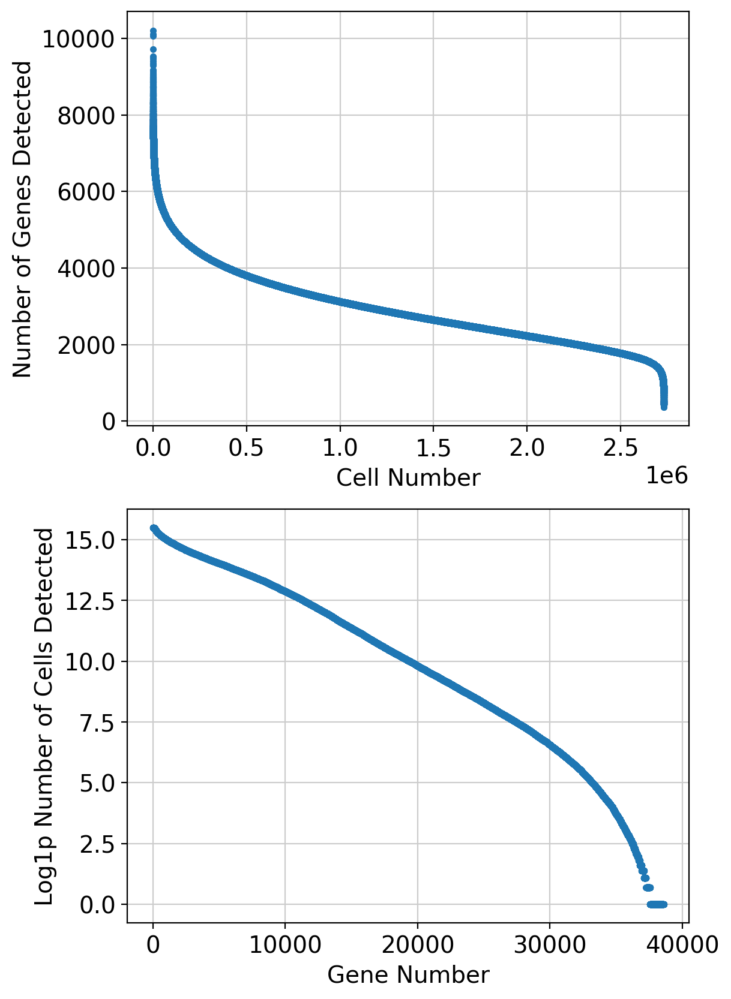

Removing 1039 genes not detected in any cells.
Performing dead cell QC...


/home/ranwyl/KOLF2.1J_Perturbation_Cell_Atlas/psp/qc/quality_control.py:437: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.


outlier
False    2498824
True      232183
Name: count, dtype: int64

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

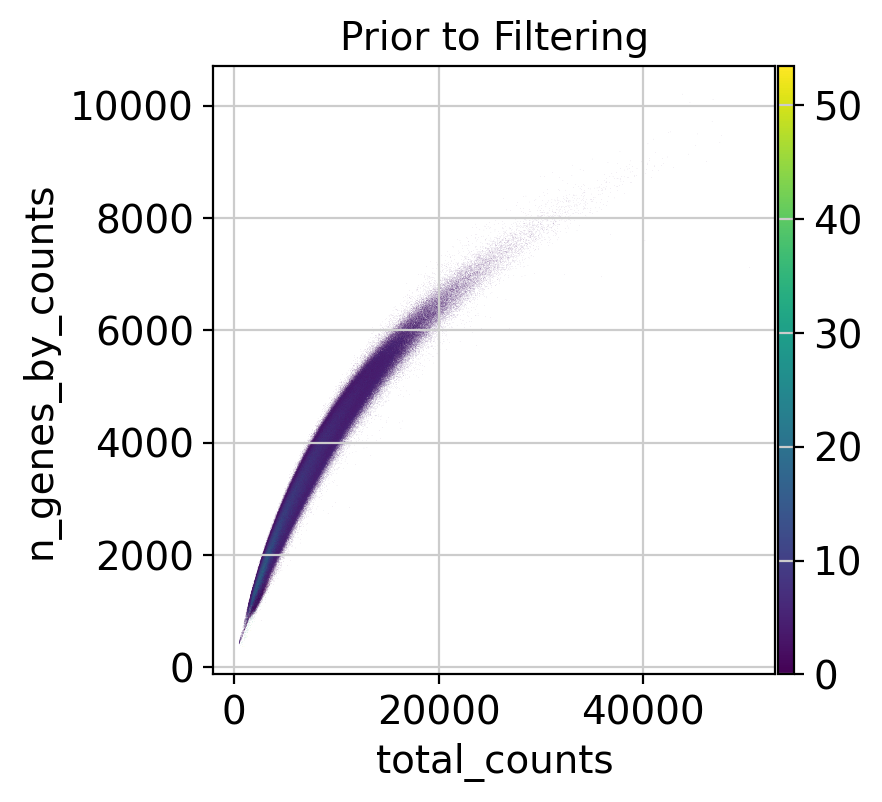

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

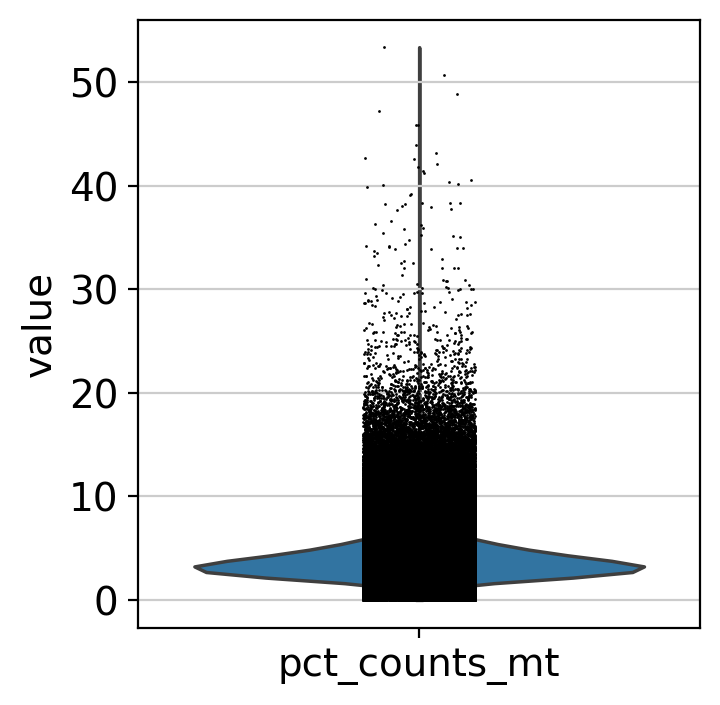

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

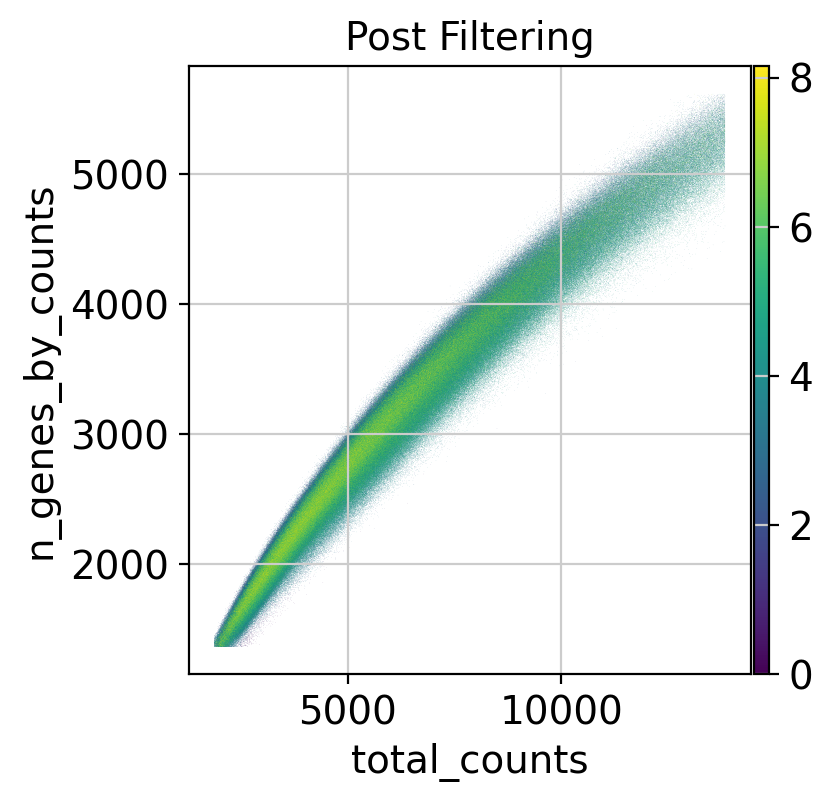

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


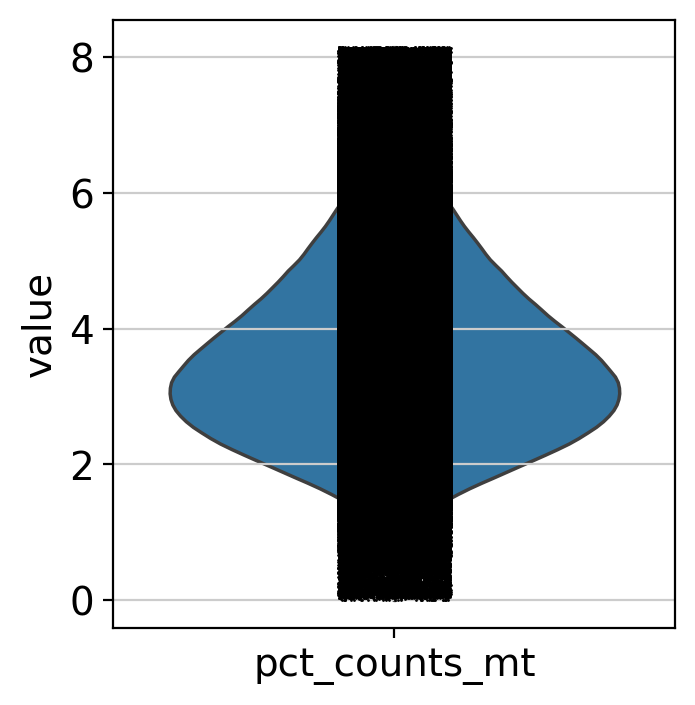

Performing doublet detection sanity check...


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

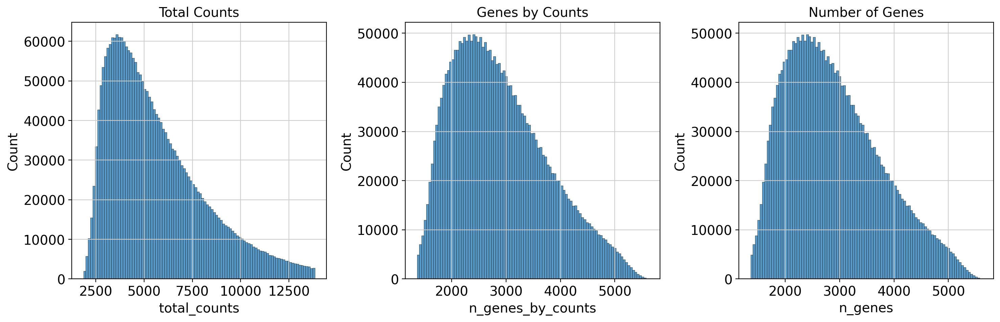

Saving final QC file to /home/ranwyl/data_tf_project/KOLF_Pan_Genome_QC_Filtered.h5ad...


View of AnnData object with n_obs × n_vars = 2498824 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'batch', 'perturbation', 'gene_target_ensembl_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

In [ ]:
pre_qc_file_path = "/home/ranwyl/data_tf_project/KOLF_Pan_Genome_Pre_QC.h5ad"
final_save_path = "/home/ranwyl/data_tf_project/KOLF_Pan_Genome_QC_Filtered.h5ad"
count_MADs = 3

qc_input_dict = {"count_MADs": count_MADs, "final_save_path": final_save_path}

adata = psp.utils.read_anndata(pre_qc_file_path)
tf_project_general_qc_cell_qc(adata, qc_input_dict)

Restart kernel

# Filtering Cells and Genes

Filter cells, keeping NTC cells that passed fitness testing and TF KD cells only. Then filter genes, removing lowly expressed genes (but keeping all TFs in the gene list).

In [2]:
post_qc_file_path = "/home/ranwyl/data_tf_project/KOLF_Pan_Genome_QC_Filtered.h5ad"
adata = psp.utils.read_anndata(post_qc_file_path)

In [3]:
adata.obs.perturbed.value_counts()

perturbed
True     2360549
False     138275
Name: count, dtype: int64

In [3]:
import anndata as ad

def filter_ntc_whitelist_and_tf_kd_cells(adata, ntc_filepath, tf_set):
    """
    Filter NTC cells based on provided whitelist of NTC cells that passed fitness testing.
    Filter perturbed cells with TF gene targets based on provided set of TFs.
    """
    with open(ntc_filepath, "r") as f:
        sgRNA_whitelist = f.read().splitlines()
    return adata[(adata.obs.gRNA.isin(sgRNA_whitelist)) | (adata.obs.gene_target.isin(tf_set))].copy()

Using TFs from Lambert et al (2018) Table S1. The .xlsx file for Tables S1-S4 was downloaded and the individual sheet for Table S1 was saved as `Lambert_2018_TFs.csv`. We will use the gene names instead of Ensembl IDs in case any of the Ensembl IDs were updated between 2018 and 2023.

In [2]:
import pandas as pd

# List of 1639 TFs from Lambert et al (2018)
tf_filepath = "/home/ranwyl/data_tf_project/input_files/Lambert_2018_TFs.csv"
tf_csv = pd.read_csv(tf_filepath)
tf_csv.head(3)

,Gene Information,Unnamed: 1,Unnamed: 2,Is TF?,Final Assesment,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Notes from re-reviewed genes,...,Unnamed: 27,Unnamed: 28,Unnamed: 29,Unnamed: 30,Unnamed: 31,Unnamed: 32,Unnamed: 33,Unnamed: 34,Unnamed: 35,Unnamed: 36
0,ID,Name,DBD,NaN,TF assessment,Binding mode,Motif status,Notes,Comments,Committee notes,...,CisBP considers it as a TF?,TFclass considers it as a TF?,TF-CAT classification,Is a GO TF,PDB,NaN,NaN,NaN,NaN,NaN
1,ENSG00000137203,TFAP2A,AP-2,Yes,Known motif,1 Monomer or homomultimer,High-throughput in vitro,NaN,NaN,NaN,...,Yes,Yes,TF Gene_DNA-Binding: sequence-specific_DNA Bin...,Yes,NaN,NaN,NaN,NaN,NaN,NaN
2,ENSG00000008196,TFAP2B,AP-2,Yes,Known motif,1 Monomer or homomultimer,High-throughput in vitro,NaN,NaN,NaN,...,Yes,Yes,TF Gene_DNA-Binding: sequence-specific_DNA Bin...,Yes,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
lambert_tfs = tf_csv[tf_csv["Is TF?"] == "Yes"].iloc[:,1].tolist()
print(len(lambert_tfs))
print(lambert_tfs[:5])
lambert_tfs = set(lambert_tfs)

1639
['TFAP2A', 'TFAP2B', 'TFAP2C', 'TFAP2D', 'TFAP2E']


In [ ]:
# NTC whitelist
whitelist_filepath = "/home/ranwyl/data_tf_project/input_files/NTC_sgRNA_whitelist.txt"

# Filter cells
adata = filter_ntc_whitelist_and_tf_kd_cells(adata, whitelist_filepath, lambert_tfs)

In [6]:
adata.obs.perturbed.value_counts()

perturbed
True     401383
False     50329
Name: count, dtype: int64

In [7]:
adata[adata.obs.batch == "ALPHA"].obs.perturbed.value_counts()

perturbed
True     397862
False     19571
Name: count, dtype: int64

In [15]:
adata[adata.obs.batch == "BETA"].obs.perturbed.value_counts()

perturbed
False    18303
True      2482
Name: count, dtype: int64

In [16]:
adata[adata.obs.batch == "GAMMA"].obs.perturbed.value_counts()

perturbed
False    12455
True      1039
Name: count, dtype: int64

See which TF KDs are in each batch

In [11]:
def display_kds_per_batch(adata, batch_key, n_to_display):
    batches = adata.obs[batch_key].unique().tolist()
    for batch in batches:
        batch_kds = adata[adata.obs[batch_key] == batch].obs.gene_target.unique().tolist()
        if len(batch_kds) <= n_to_display:
            print(f"Batch {batch} has {len(batch_kds)} KDs: {', '.join(batch_kds)}")
        else:
            print(f"Batch {batch} has {len(batch_kds)} KDs")

In [12]:
display_kds_per_batch(adata, "batch", 20)

Batch ALPHA has 1593 KDs
Batch BETA has 12 KDs: NTC, SNAPC5, ZBED5, AKAP8L, MTERF4, MSANTD4, TRAFD1, PIN1, DZIP1, RBCK1, NAIF1, CCDC17
Batch GAMMA has 8 KDs: NTC, FAM200B, THYN1, MSANTD3, PRR12, RBSN, SGSM2, MTERF2


In [3]:
beta_gamma_tfs = ['CCDC17', 'MSANTD4', 'SNAPC5', 'ZBED5', 'MTERF4', 'NAIF1', 
'AKAP8L', 'PURB', 'RBCK1', 'ZBED6', 'PIN1', 'TRAFD1', 'DZIP1', 'FAM200B', 
'MTERF2', 'MSANTD3', 'PRR12', 'SGSM2', 'THYN1', 'ZBED6', 'RBSN']

Check TF annotations for batch BETA and GAMMA TF KDs

In [4]:
tf_csv[tf_csv["Unnamed: 1"].isin(beta_gamma_tfs)][["Unnamed: 1", "Final Assesment"]]

,Unnamed: 1,Final Assesment
33,PRR12,Likely to be sequence specific TF
38,FAM200B,Likely to be sequence specific TF
39,SGSM2,Likely to be sequence specific TF
44,ZBED5,Likely to be sequence specific TF
45,ZBED6,Inferred motif
238,AKAP8L,Likely to be sequence specific TF
248,CCDC17,Likely to be sequence specific TF
255,DZIP1,Likely to be sequence specific TF
347,RBSN,Likely to be sequence specific TF
372,TRAFD1,Likely to be sequence specific TF


Batch ALPHA has the vast majority of TF KDs, so we will go on to analyze batch ALPHA only.

In [5]:
adata_alpha = adata[adata.obs.batch == "ALPHA"].copy()

In [6]:
del adata
gc.collect()

61183

Next, filter genes expressed in <100 cells, then filter 30% of genes with lowest expression

In [10]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'
import seaborn as sns
import scanpy as sc

def filter_low_expressed_genes(adata, tf_set, percent_threshold=0, min_n_cells=0, silent=False):
    """
    Filter out bottom percentile of genes with lowest expression (counts) 
    and genes expressed in fewer than min_n_cells cells.
    Do not filter out genes that are TFs in tf_set.
    """
    n_genes_before = adata.shape[1]

    # Filter genes expressed in fewer than min_n_cells cells
    if silent == False:
        print(f"Removing non-TF genes expressed in <{min_n_cells} cells")
    # Create data matrix
    if silent == False:
        print("Copying data")
    data_matrix = adata.layers["counts"] if "counts" in adata.layers else adata.X
    data_matrix = data_matrix.copy()
    # Convert from sparse to dense if necessary
    if hasattr(data_matrix, 'toarray'):
        if silent == False:
            print("Converting data from sparse to dense")
        data_matrix = data_matrix.toarray()
    if silent == False:
        print("Filtering genes")
    # Create mask for TFs
    tf_mask = adata.var_names.isin(tf_set)
    # Calculate number of cells expressing each gene
    gene_detected_counts = (data_matrix > 0).sum(axis=0)
    # Set cell number threshold and filter genes
    genes_pass_cell_thr = gene_detected_counts >= min_n_cells
    genes_to_keep = genes_pass_cell_thr | tf_mask
    adata = adata[:, genes_to_keep]
    print(f"Removed {n_genes_before - adata.n_vars} "
        f"non-TF genes expressed in <{min_n_cells} cells")
    n_genes_after_cell_filt = adata.n_vars
    del data_matrix

    # Filter bottom percentile of genes by expression (counts)
    if silent == False:
        print(f"\nRemoving bottom {percent_threshold}% of genes by expression (CPM)")
    if silent == False:
        print("Copying data")
    adata_norm = adata.copy()
    sc.pp.normalize_total(adata_norm, target_sum=1e6)
    if silent == False:
        print("Copying normalized data")
    data_matrix = adata_norm.X.copy()
    # Convert from sparse to dense if necessary
    if hasattr(data_matrix, 'toarray'):
        if silent == False:
            print("Converting data from sparse to dense")
        data_matrix = data_matrix.toarray()
    if silent == False:
        print("Filtering genes")
    # Create mask for TFs
    tf_mask = adata.var_names.isin(tf_set)
    # Calculate mean expression of each gene
    mean_expr_per_gene = data_matrix.mean(axis=0)
    # Set percent threshold and filter genes
    threshold = np.percentile(mean_expr_per_gene, percent_threshold)
    genes_pass_pct_thr = mean_expr_per_gene > threshold
    genes_to_keep = genes_pass_pct_thr | tf_mask
    adata = adata[:,genes_to_keep]
    print(f"Removed {n_genes_after_cell_filt - adata.n_vars} non-TF genes "
            f"with lowest {percent_threshold}% expression (CPM)")
    print(f"\nRemoved: {n_genes_before - adata.shape[1]} genes total")
    print(f"Remaining: {adata.n_vars} genes")
    del data_matrix
    del adata_norm
    gc.collect()
    return adata.copy()

def histogram_mean_expression(adata, title="Histogram of Mean Gene Expression", 
                              n_bins=75, ymax=None, show_labels=False):
    plt.rcParams["font.size"] = 14
    # Create data matrix
    adata = adata.copy()
    if "counts" in adata.layers:
        adata.X = adata.layers["counts"].copy()
    # Normalize and log1p
    sc.pp.normalize_total(adata, target_sum=1e6)
    sc.pp.log1p(adata)
    # Copy
    data_matrix = adata.X.copy()
    # Convert from sparse to dense if necessary
    if hasattr(data_matrix, 'toarray'):
        data_matrix = data_matrix.toarray()

    # Plot mean expression
    mean_expr = data_matrix.mean(axis=0)
    plt.figure(figsize=(8,4)) if show_labels else plt.figure(figsize=(6,4))
    ax = sns.histplot(mean_expr, bins=n_bins, kde=False)
    plt.xlabel("Mean expression per gene (CPM, log1p)")
    plt.ylabel("Number of genes")
    plt.title(title, fontsize=15)
    if ymax:
        ax.set_ylim(0, ymax)
    if show_labels:
        ax.bar_label(ax.containers[0], rotation=90, padding=3, fontsize=10)
    plt.tight_layout()
    plt.show()
    del data_matrix
    gc.collect()

def histogram_cells_expressing_gene(adata, title="Histogram of # Cells Expressing a Gene", 
                                    n_bins=75, ymax=None, show_labels=False):
    plt.rcParams["font.size"] = 14
    # Use raw counts
    count_matrix = adata.X if "counts" not in adata.layers else adata.layers["counts"]
    count_matrix = count_matrix.copy()
    # Convert from sparse to dense if necessary
    if hasattr(count_matrix, 'toarray'):
        count_matrix = count_matrix.toarray()
    # Plot number of cells expressing each gene
    gene_detected_counts = (count_matrix > 0).sum(axis=0)
    plt.figure(figsize=(8,4)) if show_labels else plt.figure(figsize=(6,4))
    ax = sns.histplot(gene_detected_counts, bins=n_bins, kde=False)
    plt.xlabel("Number of cells in which gene is expressed")
    plt.ylabel("Number of genes")
    plt.title(title, fontsize=15)
    if ymax:
        ax.set_ylim(0, ymax)
    if show_labels:
        ax.bar_label(ax.containers[0], rotation=90, padding=3, fontsize=10)
    plt.tight_layout()
    plt.show()
    del count_matrix
    gc.collect()

Plot histograms before filtering

normalizing counts per cell
    finished (0:00:02)


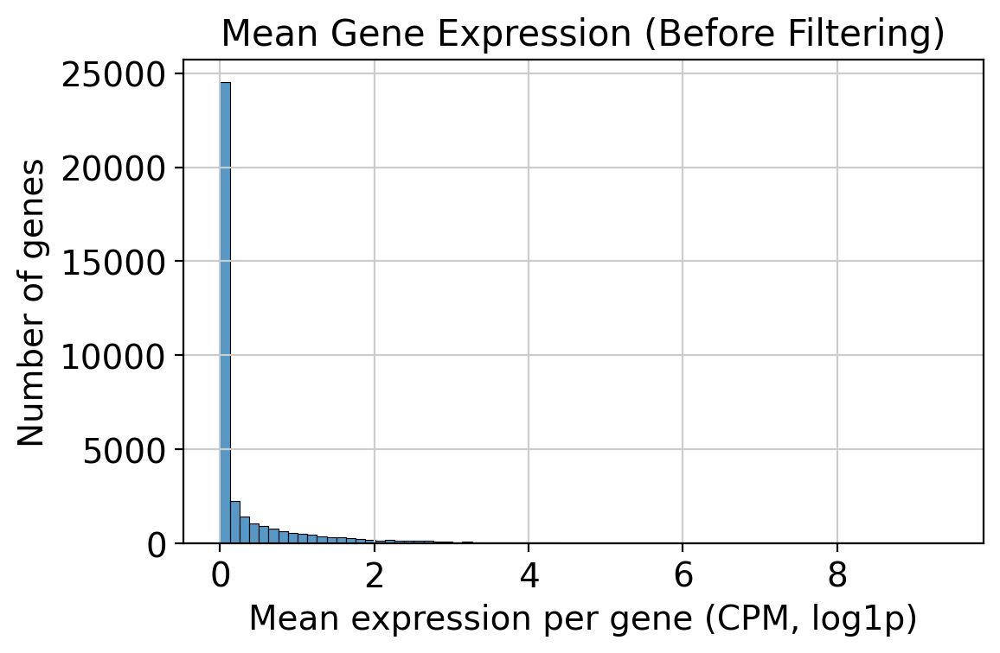

In [14]:
histogram_mean_expression(adata_alpha, "Mean Gene Expression (Before Filtering)")

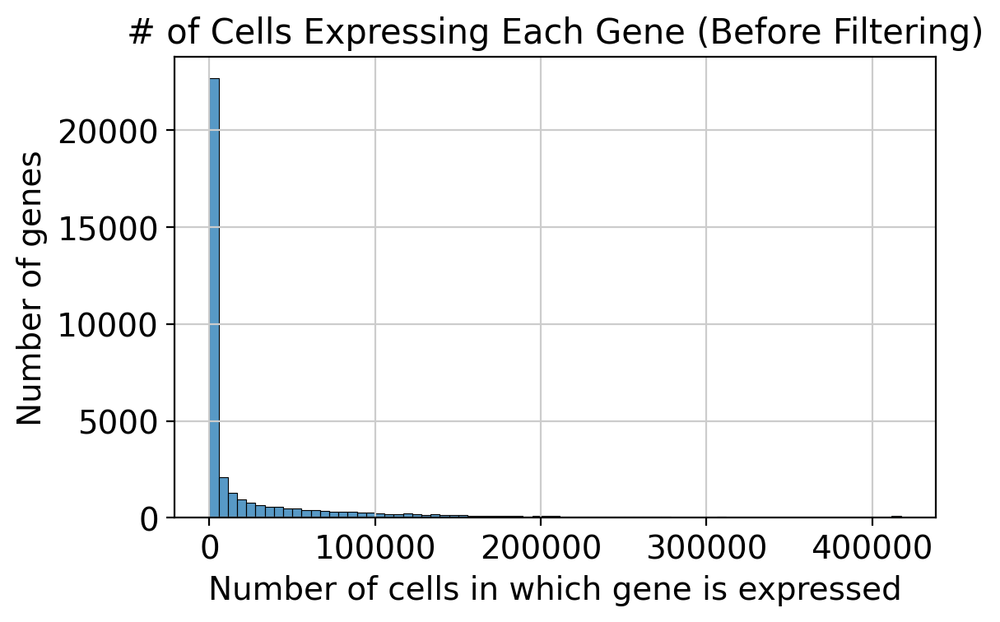

In [24]:
histogram_cells_expressing_gene(adata_alpha, 
                                "# of Cells Expressing Each Gene (Before Filtering)")

Filter

In [11]:
adata_filtered = filter_low_expressed_genes(adata_alpha, lambert_tfs, 
                                            percent_threshold=30, min_n_cells=100)

Removing non-TF genes expressed in <100 cells
Copying data
Converting data from sparse to dense
Filtering genes
Removed 9505 non-TF genes expressed in <100 cells

Removing bottom 30% of genes by expression (CPM)
Copying data
normalizing counts per cell
    finished (0:00:02)
Copying normalized data
Converting data from sparse to dense
Filtering genes
Removed 8019 non-TF genes with lowest 30% expression (CPM)

Removed: 17524 genes total
Remaining: 20043 genes


Try filtering with log1p step included

In [ ]:
import numpy as np
import scanpy as sc

def filter_low_expressed_genes_norm_log1p(adata, tf_set, percent_threshold=0, 
                                          min_n_cells=0, silent=False):
    """
    Filter out bottom percentile of genes with lowest expression (counts) 
    and genes expressed in fewer than min_n_cells cells.
    Do not filter out genes that are TFs in tf_set.
    """
    n_genes_before = adata.shape[1]

    # Filter genes expressed in fewer than min_n_cells cells
    if silent == False:
        print(f"Removing non-TF genes expressed in <{min_n_cells} cells")
    # Create data matrix
    if silent == False:
        print("Copying data")
    data_matrix = adata.layers["counts"] if "counts" in adata.layers else adata.X
    data_matrix = data_matrix.copy()
    # Convert from sparse to dense if necessary
    if hasattr(data_matrix, 'toarray'):
        if silent == False:
            print("Converting data from sparse to dense")
        data_matrix = data_matrix.toarray()
    if silent == False:
        print("Filtering genes")
    # Create mask for TFs
    tf_mask = adata.var_names.isin(tf_set)
    # Calculate number of cells expressing each gene
    gene_detected_counts = (data_matrix > 0).sum(axis=0)
    # Set cell number threshold and filter genes
    genes_pass_cell_thr = gene_detected_counts >= min_n_cells
    genes_to_keep = genes_pass_cell_thr | tf_mask
    adata = adata[:, genes_to_keep]
    print(f"Removed {n_genes_before - adata.n_vars} "
        f"non-TF genes expressed in <{min_n_cells} cells")
    n_genes_after_cell_filt = adata.n_vars
    del data_matrix

    # Filter bottom percentile of genes by expression (counts)
    if silent == False:
        print(f"\nRemoving bottom {percent_threshold}% of genes by expression (CPM)")
    if silent == False:
        print("Copying data")
    adata_norm = adata.copy()
    sc.pp.normalize_total(adata_norm, target_sum=1e6)
    sc.pp.log1p(adata_norm)
    if silent == False:
        print("Copying normalized, log1p-transformed data")
    data_matrix = adata_norm.X.copy()
    # Convert from sparse to dense if necessary
    if hasattr(data_matrix, 'toarray'):
        if silent == False:
            print("Converting data from sparse to dense")
        data_matrix = data_matrix.toarray()
    if silent == False:
        print("Filtering genes")
    # Create mask for TFs
    tf_mask = adata.var_names.isin(tf_set)
    # Calculate mean expression of each gene
    mean_expr_per_gene = data_matrix.mean(axis=0)
    # Set percent threshold and filter genes
    threshold = np.percentile(mean_expr_per_gene, percent_threshold)
    genes_pass_pct_thr = mean_expr_per_gene > threshold
    genes_to_keep = genes_pass_pct_thr | tf_mask
    adata = adata[:,genes_to_keep]
    print(f"Removed {n_genes_after_cell_filt - adata.n_vars} non-TF genes "
            f"with lowest {percent_threshold}% expression (CPM)")
    print(f"\nRemoved: {n_genes_before - adata.shape[1]} genes total")
    print(f"Remaining: {adata.n_vars} genes")
    del data_matrix
    del adata_norm
    gc.collect()
    return adata.copy()

In [8]:
adata_filtered_log1p = \
    filter_low_expressed_genes_norm_log1p(adata_alpha, lambert_tfs, 
                                        percent_threshold=30, min_n_cells=100)

Removing non-TF genes expressed in <100 cells
Copying data
Converting data from sparse to dense
Filtering genes
Removed 9505 non-TF genes expressed in <100 cells

Removing bottom 30% of genes by expression (CPM)
Copying data
normalizing counts per cell
    finished (0:00:02)
Copying normalized, log1p-transformed data
Converting data from sparse to dense
Filtering genes
Removed 8019 non-TF genes with lowest 30% expression (CPM)

Removed: 17524 genes total
Remaining: 20043 genes


Try filter where expression is normalized to the median of total cell counts (instead of CPM)

In [9]:
import numpy as np
import scanpy as sc

def filter_low_expressed_genes_median_norm(adata, tf_set, percent_threshold=0, 
                                           min_n_cells=0, silent=False):
    """
    Filter out bottom percentile of genes with lowest expression (counts) 
    and genes expressed in fewer than min_n_cells cells.
    Do not filter out genes that are TFs in tf_set.
    """
    n_genes_before = adata.shape[1]

    # Filter genes expressed in fewer than min_n_cells cells
    if silent == False:
        print(f"Removing non-TF genes expressed in <{min_n_cells} cells")
    # Create data matrix
    if silent == False:
        print("Copying data")
    data_matrix = adata.layers["counts"] if "counts" in adata.layers else adata.X
    data_matrix = data_matrix.copy()
    # Convert from sparse to dense if necessary
    if hasattr(data_matrix, 'toarray'):
        if silent == False:
            print("Converting data from sparse to dense")
        data_matrix = data_matrix.toarray()
    if silent == False:
        print("Filtering genes")
    # Create mask for TFs
    tf_mask = adata.var_names.isin(tf_set)
    # Calculate number of cells expressing each gene
    gene_detected_counts = (data_matrix > 0).sum(axis=0)
    # Set cell number threshold and filter genes
    genes_pass_cell_thr = gene_detected_counts >= min_n_cells
    genes_to_keep = genes_pass_cell_thr | tf_mask
    adata = adata[:, genes_to_keep]
    print(f"Removed {n_genes_before - adata.n_vars} "
        f"non-TF genes expressed in <{min_n_cells} cells")
    n_genes_after_cell_filt = adata.n_vars
    del data_matrix

    # Filter bottom percentile of genes by expression (counts)
    if silent == False:
        print(f"\nRemoving bottom {percent_threshold}% of genes by expression (CPM)")
    if silent == False:
        print("Copying data")
    adata_norm = adata.copy()
    sc.pp.normalize_total(adata_norm)
    if silent == False:
        print("Copying normalized data")
    data_matrix = adata_norm.X.copy()
    # Convert from sparse to dense if necessary
    if hasattr(data_matrix, 'toarray'):
        if silent == False:
            print("Converting data from sparse to dense")
        data_matrix = data_matrix.toarray()
    if silent == False:
        print("Filtering genes")
    # Create mask for TFs
    tf_mask = adata.var_names.isin(tf_set)
    # Calculate mean expression of each gene
    mean_expr_per_gene = data_matrix.mean(axis=0)
    # Set percent threshold and filter genes
    threshold = np.percentile(mean_expr_per_gene, percent_threshold)
    genes_pass_pct_thr = mean_expr_per_gene > threshold
    genes_to_keep = genes_pass_pct_thr | tf_mask
    adata = adata[:,genes_to_keep]
    print(f"Removed {n_genes_after_cell_filt - adata.n_vars} non-TF genes "
            f"with lowest {percent_threshold}% expression (CPM)")
    print(f"\nRemoved: {n_genes_before - adata.shape[1]} genes total")
    print(f"Remaining: {adata.n_vars} genes")
    del data_matrix
    del adata_norm
    gc.collect()
    return adata.copy()

In [10]:
adata_filtered_median_norm = \
    filter_low_expressed_genes_median_norm(adata_alpha, lambert_tfs, 
                                           percent_threshold=30, min_n_cells=100)

Removing non-TF genes expressed in <100 cells
Copying data
Converting data from sparse to dense
Filtering genes
Removed 9505 non-TF genes expressed in <100 cells

Removing bottom 30% of genes by expression (CPM)
Copying data
normalizing counts per cell
    finished (0:00:02)
Copying normalized data
Converting data from sparse to dense
Filtering genes
Removed 8019 non-TF genes with lowest 30% expression (CPM)

Removed: 17524 genes total
Remaining: 20043 genes


Plot histograms after filtering

normalizing counts per cell
    finished (0:00:02)


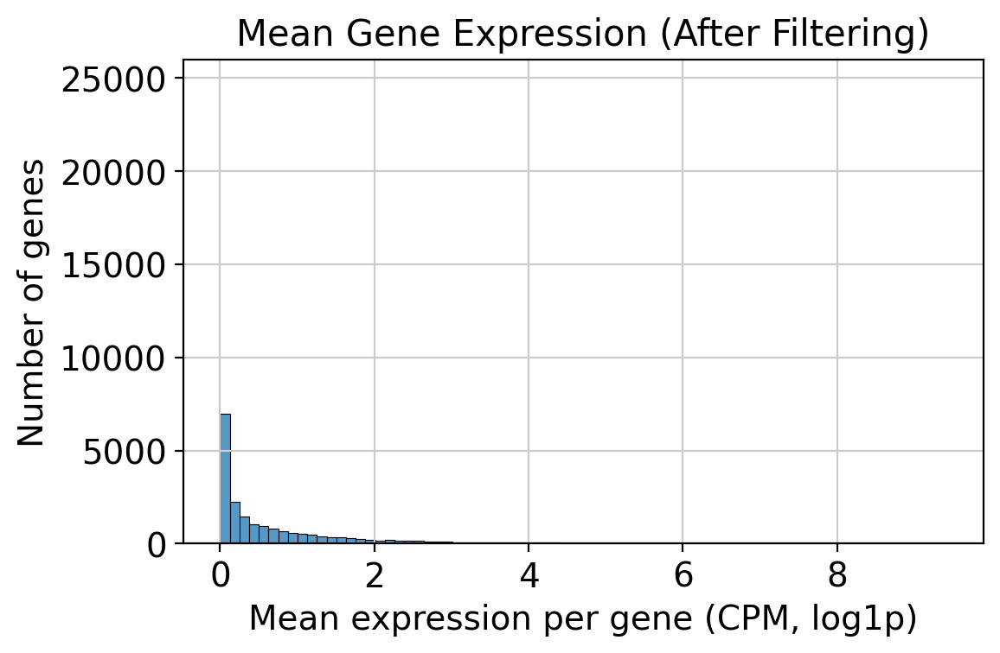

In [15]:
histogram_mean_expression(adata_filtered, 
                          "Mean Gene Expression (After Filtering)", ymax=26000)

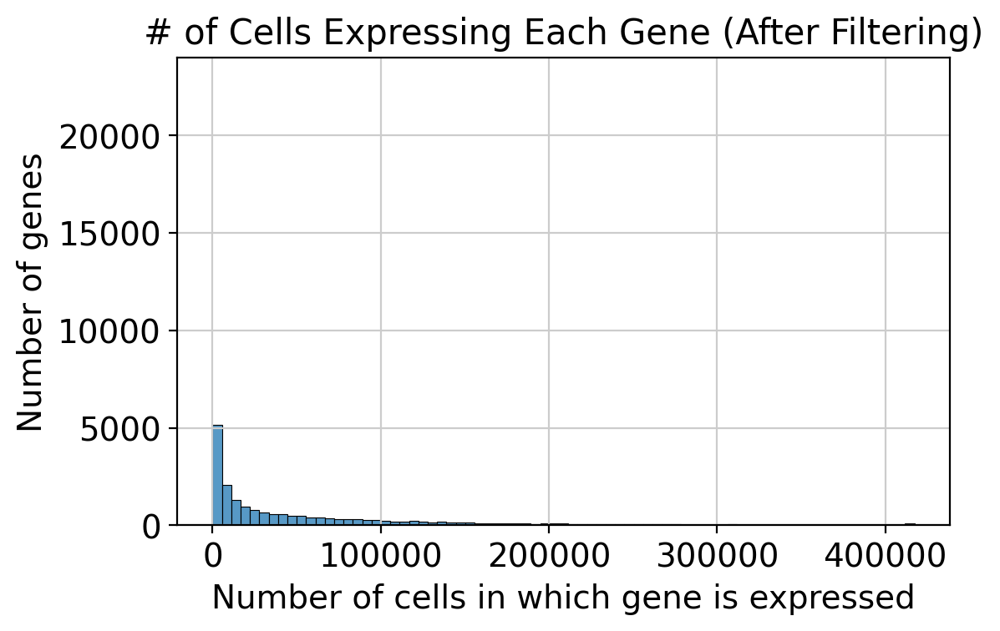

In [16]:
histogram_cells_expressing_gene(adata_filtered, 
                                "# of Cells Expressing Each Gene (After Filtering)", ymax=24000)

Save file

In [12]:
adata_filtered.write("/home/ranwyl/data_tf_project/KOLF_Pan_Genome_Alpha_QC_Cell_Gene_Filtered.h5ad")

Restart kernel

# Scrubbing NTC Cells

Use PCA and isolation forest model to remove outlier NTC cells. Use random seed = 42 for isolation forest.

In [2]:
import anndata as ad
import scanpy as sc
from sklearn.ensemble import IsolationForest

def _tf_project_scrub_ntc_isolation_forest(adata: ad.AnnData, 
                                           contamination_threshold: float,  
                                           batch_key: str = 'batch', 
                                           sgRNA_column: str = "gRNA", 
                                           min_cells_per_NTC_guide: int = 25,
                                           random_state: int = 42) -> list:
    """
    Version of psp.pp._scrub_ntc_isolation_forest that uses a random seed
    for scikit-learn IsolationForest.
    """
    # Use PCA representation for outlier detection
    if "X_pca_harmony" in adata.obsm:
        rep = "X_pca_harmony"
    else:
        rep = "X_pca"
    data = adata.obsm[rep]
    
    # Fit the Isolation Forest model
    clf = IsolationForest(contamination=contamination_threshold, random_state=random_state)
    clf.fit(data)
    
    # Classify points as outliers (-1) and inliers (1)
    labels = clf.predict(data)
    adata.obs['is_outlier'] = labels
    adata.obs['is_outlier'] = adata.obs['is_outlier'].replace({-1: 'outlier', 1: 'inlier'})
    
    # Visualize the outlier classification Pre-Filtering
    sc.pp.neighbors(adata, use_rep=rep)
    sc.tl.umap(adata)
    sc.pl.umap(adata, color=["is_outlier", "phase", "batch"], title="Pre-Filtering", frameon=False)
    sc.tl.embedding_density(adata)
    sc.pl.embedding_density(adata, frameon=False)
    
    # Filter out outliers and visualize Post-Filtering
    adata_filtered = adata[adata.obs.is_outlier == "inlier", :]

    # Filter out NTCs with too few cells
    if batch_key is not None:
        batch_counts = adata_filtered.obs.groupby([sgRNA_column, batch_key]).size().unstack(fill_value=0)
        guides_to_keep = batch_counts[batch_counts.min(axis=1) >= min_cells_per_NTC_guide].index.tolist()
        print(f"Removing {len(batch_counts) - len(guides_to_keep)} NTC guides due to having less than {min_cells_per_NTC_guide} cells in each batch")
        adata_filtered = adata_filtered[adata_filtered.obs[sgRNA_column].isin(guides_to_keep)]
    
    else:
        counts = adata_filtered.obs[sgRNA_column].value_counts()
        guides_to_keep = counts[counts >= min_cells_per_NTC_guide].index.tolist()
        print(f"Removing {len(counts) - len(guides_to_keep)} NTC guides due to having less than {min_cells_per_NTC_guide} cells")
        adata_filtered = adata_filtered[adata_filtered.obs[sgRNA_column].isin(guides_to_keep)]

    sc.pp.neighbors(adata_filtered, use_rep=rep)
    sc.tl.umap(adata_filtered, )
    sc.pl.umap(adata_filtered, color=["is_outlier", "phase", "batch"], title="Post-Filtering", frameon=False)
    sc.tl.embedding_density(adata_filtered)
    sc.pl.embedding_density(adata_filtered, frameon=False)
    
    return list(adata_filtered.obs.index)

def tf_project_clean_ntc_cells(adata: ad.AnnData, 
                               contamination_threshold: float = 0.3, 
                               batch_key: str = None, 
                               sgRNA_column: str = "gRNA", 
                               min_cells_per_NTC_guide: int = 25,
                               random_state: int = 42) -> ad.AnnData:
    """
    Version of psp.pp.clean_ntc_cells() that takes a random seed
    for scikit-learn IsolationForest.
    """
    # Assertions to ensure required fields are present
    assert 'counts' in adata.layers, "The AnnData object must have a 'counts' layer."
    assert 'perturbed' in adata.obs, "The AnnData object must have a 'perturbed' column in obs which indicates whether the cell is perturbed or not."
    if batch_key is not None:
        assert batch_key in adata.obs, f"The AnnData object must have a {batch_key} column in obs which indicates the batch the cell belongs to."

    adata_ntc = psp.utils.get_ntc_view(adata).copy()
    print(f"Initial number of NTC Cells: {len(adata_ntc)}")

    # NTC whitelist cells have already been filtered
    
    # Perform PCA on the data
    if batch_key is not None:
        psp.pp.preprocessing._scrub_ntc_pca(adata_ntc, batch_key = batch_key)
    else:
        psp.pp.preprocessing._scrub_ntc_pca(adata_ntc)
    
    # Identify valid NTC cells using Isolation Forest
    valid_ntc_cells = _tf_project_scrub_ntc_isolation_forest(adata_ntc, contamination_threshold, batch_key, sgRNA_column, min_cells_per_NTC_guide, random_state)
    print(f"Number of NTC Cells after Isolation Forest filtering: {len(valid_ntc_cells)}")
    perturbed_mask = adata.obs.perturbed == "True"
    valid_ntc_mask = adata.obs.index.isin(valid_ntc_cells)
    valid_cells_mask = perturbed_mask | valid_ntc_mask
    adata._inplace_subset_obs(valid_cells_mask)
    print(f"Total number of cells after NTC cleaning: {len(adata.obs)}")
    print(f"Number of NTC Cells per batch \n: {psp.utils.get_ntc_view(adata).obs.batch.value_counts()}")
    return adata

In [3]:
adata_filepath = "/home/ranwyl/data_tf_project/KOLF_Pan_Genome_Alpha_QC_Cell_Gene_Filtered.h5ad"
adata = psp.utils.read_anndata(adata_filepath)
adata

AnnData object with n_obs × n_vars = 417433 × 20043
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'batch', 'perturbation', 'gene_target_ensembl_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

Perform CPM normalization

In [4]:
import scanpy as sc

adata_norm = adata.copy()
sc.pp.normalize_total(adata_norm, target_sum=1e6)

normalizing counts per cell
    finished (0:00:02)


Initial number of NTC Cells: 19571
extracting highly variable genes


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    471 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    473 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


/usr/lib64/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.


computing PCA
    with n_comps=50
    finished (0:00:03)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PCs', the loadings (adata.varm)
    'pca_variance', the variance / eigenvalues (adata.uns['pca'])
    'pca_variance_ratio', the variance ratio (adata.uns['pca'])


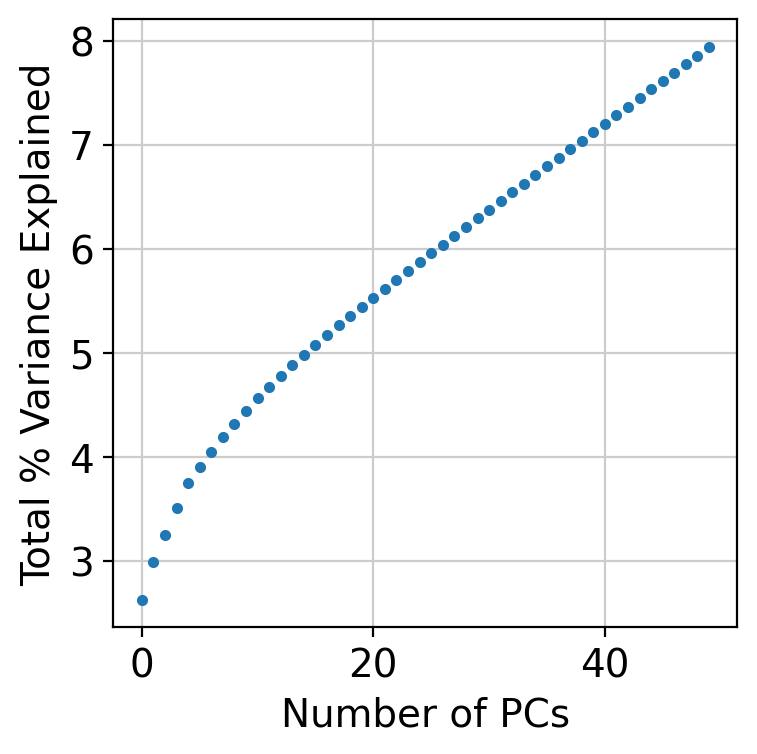

computing neighbors
    computing neighbors
    computed neighbors (0:00:20)
    computed connectivities (0:00:01)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:22)
computing UMAP


  0%|          | 0/200 [00:00<?, ?it/s]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:11)


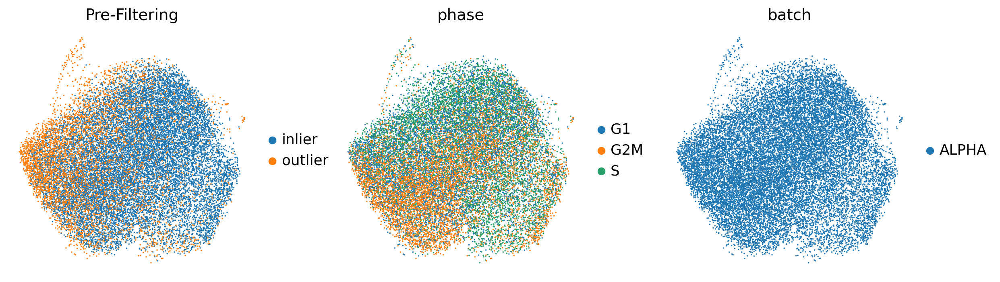

computing density on 'umap'
--> added
    'umap_density', densities (adata.obs)
    'umap_density_params', parameter (adata.uns)


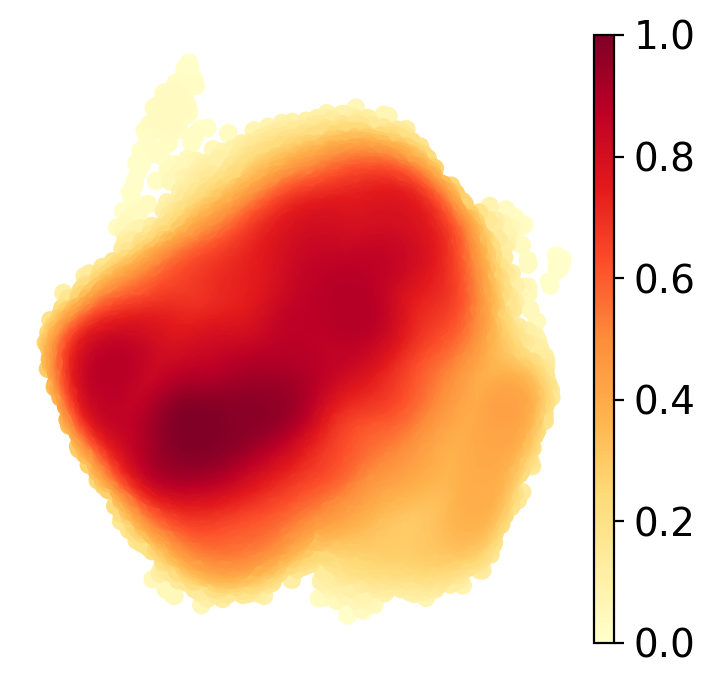

Removing 2 NTC guides due to having less than 25 cells
computing neighbors
        initialized `.distances` `.connectivities` 
    computing neighbors
    computed neighbors (0:00:02)
    computed connectivities (0:00:00)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP


  0%|          | 0/200 [00:00<?, ?it/s]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:07)


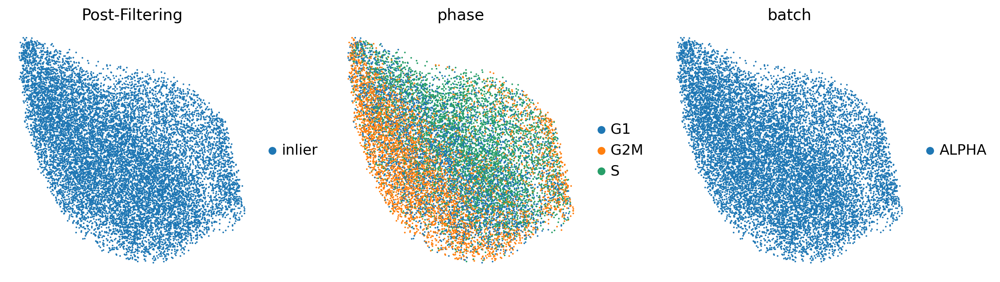

computing density on 'umap'
--> added
    'umap_density', densities (adata.obs)
    'umap_density_params', parameter (adata.uns)


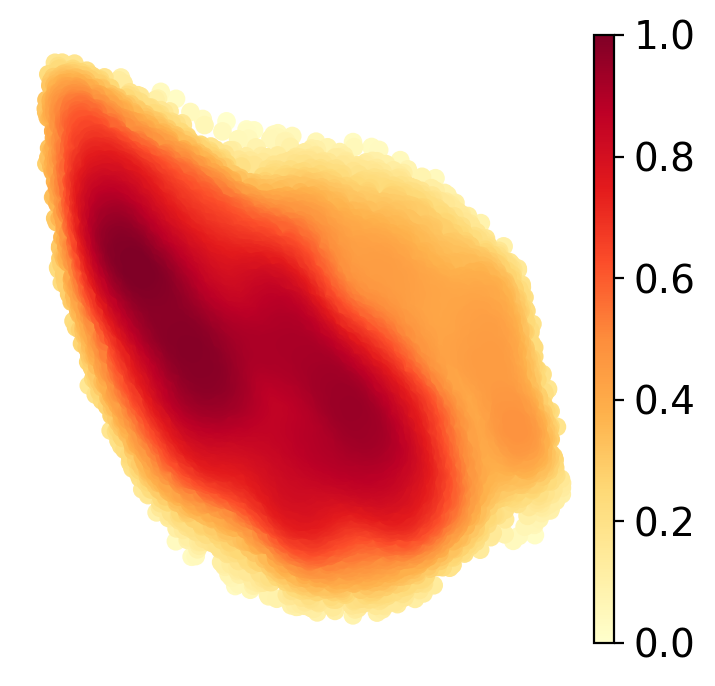

Number of NTC Cells after Isolation Forest filtering: 13674
Total number of cells after NTC cleaning: 411536
Number of NTC Cells per batch 
: batch
ALPHA    13674
Name: count, dtype: int64


In [5]:
adata_norm = tf_project_clean_ntc_cells(adata_norm, random_state=42)

In [6]:
adata_norm

AnnData object with n_obs × n_vars = 411536 × 20043
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'batch', 'perturbation', 'gene_target_ensembl_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

In [7]:
final_save_path = "/home/ranwyl/data_tf_project/KOLF_Pan_Genome_Alpha_CPMnorm_NTC_Filtered.h5ad"
adata_norm.write(final_save_path)

# Filtering sgRNAs by Knockdown Efficiency

Calculate knockdown efficiency

In [2]:
data_path = "/home/ranwyl/data_tf_project/KOLF_Pan_Genome_Alpha_CPMnorm_NTC_Filtered.h5ad"
adata = psp.utils.read_anndata(data_path)
adata

AnnData object with n_obs × n_vars = 411536 × 20043
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'batch', 'perturbation', 'gene_target_ensembl_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

In [3]:
adata_kd = adata[adata.obs.perturbed == 'True']
print(f"{adata_kd.shape[0]} TF KD cells")
print(f"{adata_kd.obs.gRNA.nunique()} TF KD gRNAs")
print(f"{adata_kd.obs.gene_target.nunique()} TF KDs")

397862 TF KD cells
4762 TF KD gRNAs
1592 TF KDs


In [4]:
print(f"{adata[adata.obs.perturbed == 'False'].shape[0]} NTC cells")
print(f"{adata[adata.obs.perturbed == 'False'].obs.gRNA.nunique()} NTC gRNAs")

13674 NTC cells
234 NTC gRNAs


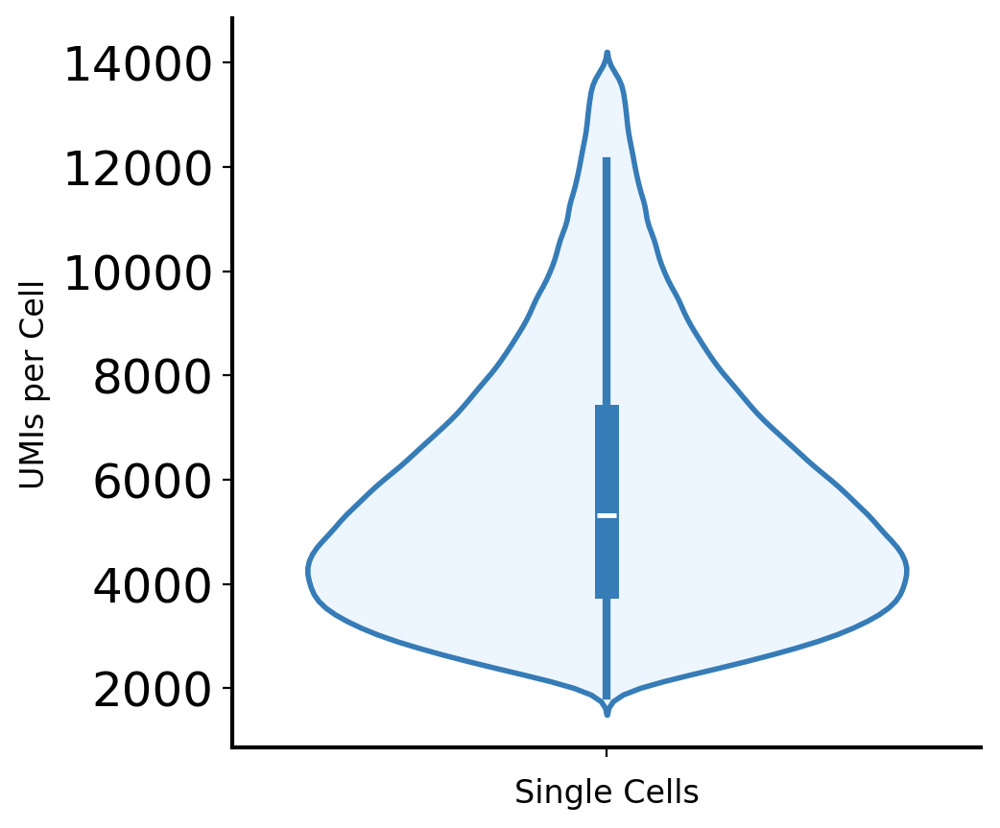

In [9]:
fig = psp.pl.plot_umis_per_cell(adata)

In [10]:
adata = psp.pp.knockdown_qc(adata, batch_aware=False)

normalizing counts per cell
    finished (0:00:02)


In [11]:
adata

AnnData object with n_obs × n_vars = 411536 × 20043
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'batch', 'perturbation', 'gene_target_ensembl_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

Plot number of cells per sgRNA (there can be multiple sgRNA per gene target)

4608/4762 (96.77%) have > 25 cells


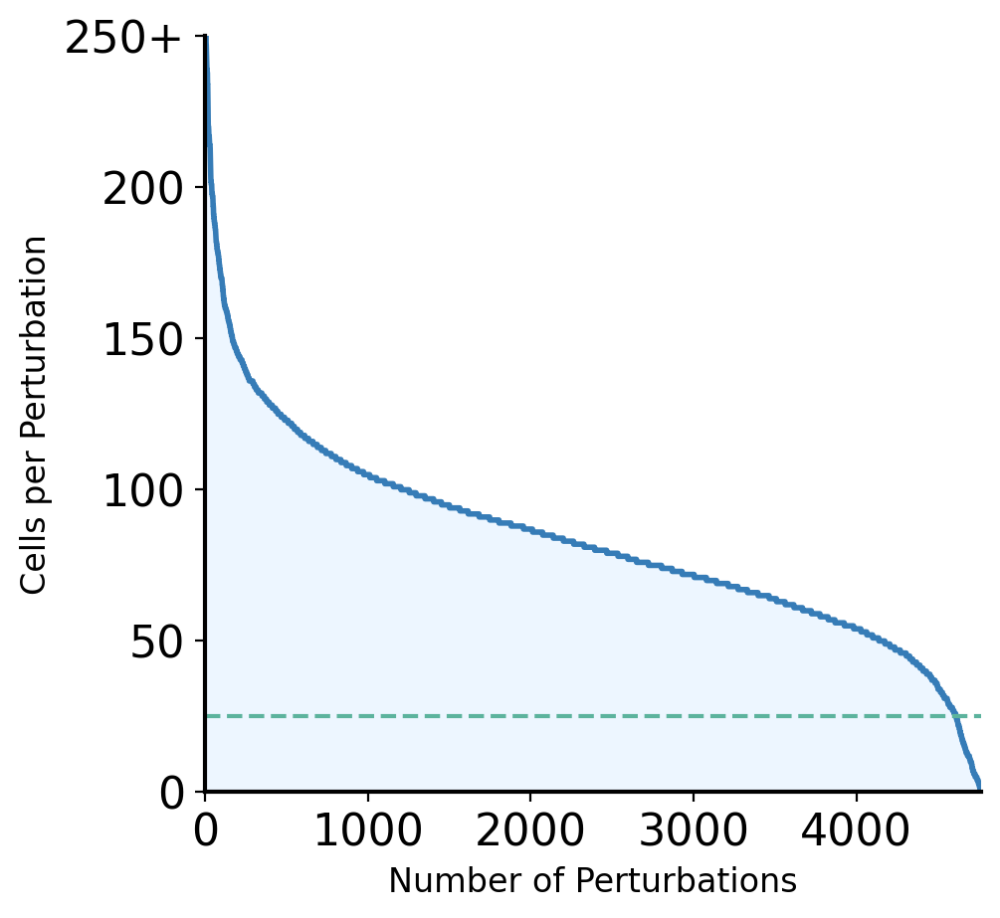

In [12]:
fig = psp.pl.plot_cells_per_perturbation(adata, perturbation_key = 'perturbation', xlabel='Number of Perturbations', ylabel='Cells per Perturbation', highlight_threshold=25, y_max=250, tick_spacing=50)

Plot number of cells per gene target

1562/1592 (98.12%) have > 100 cells


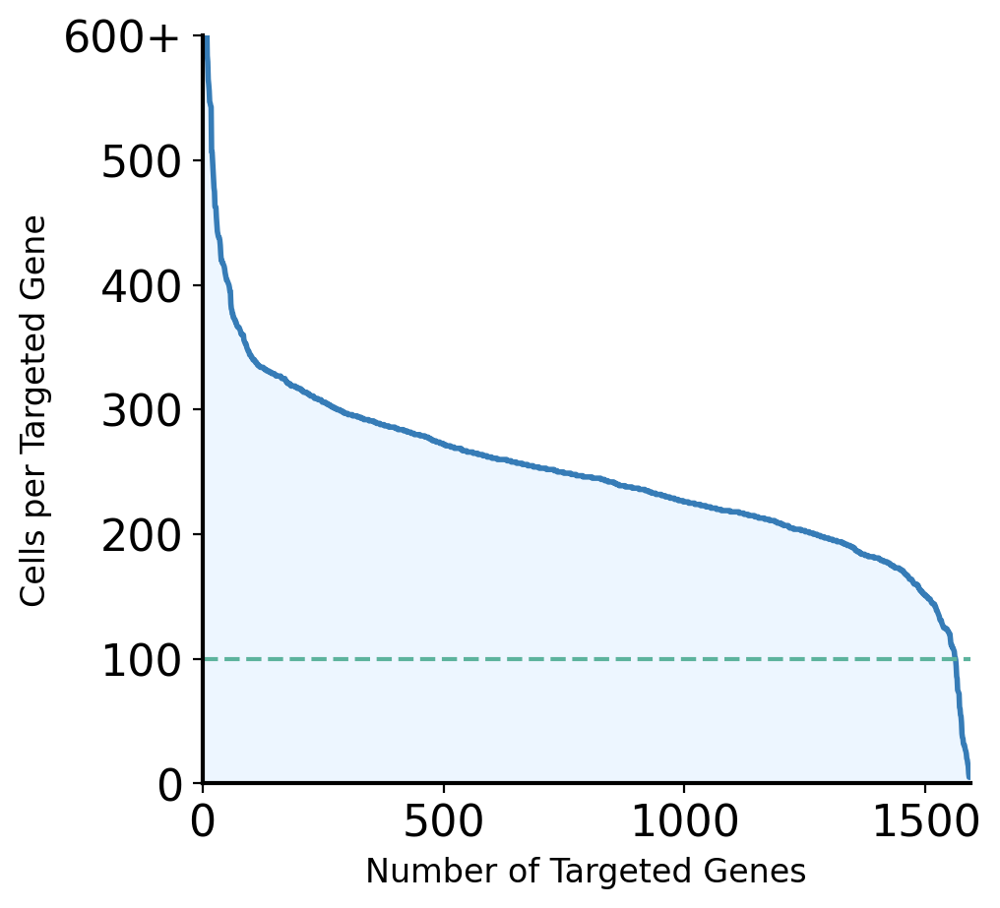

In [13]:
fig = psp.pl.plot_cells_per_perturbation(adata, perturbation_key = 'gene_target', xlabel='Number of Targeted Genes', ylabel='Cells per Targeted Gene')

Plot percentage repression per sgRNA

Percentage of perturbations achieving 30.0% repression: 72.64% (3459/4762)


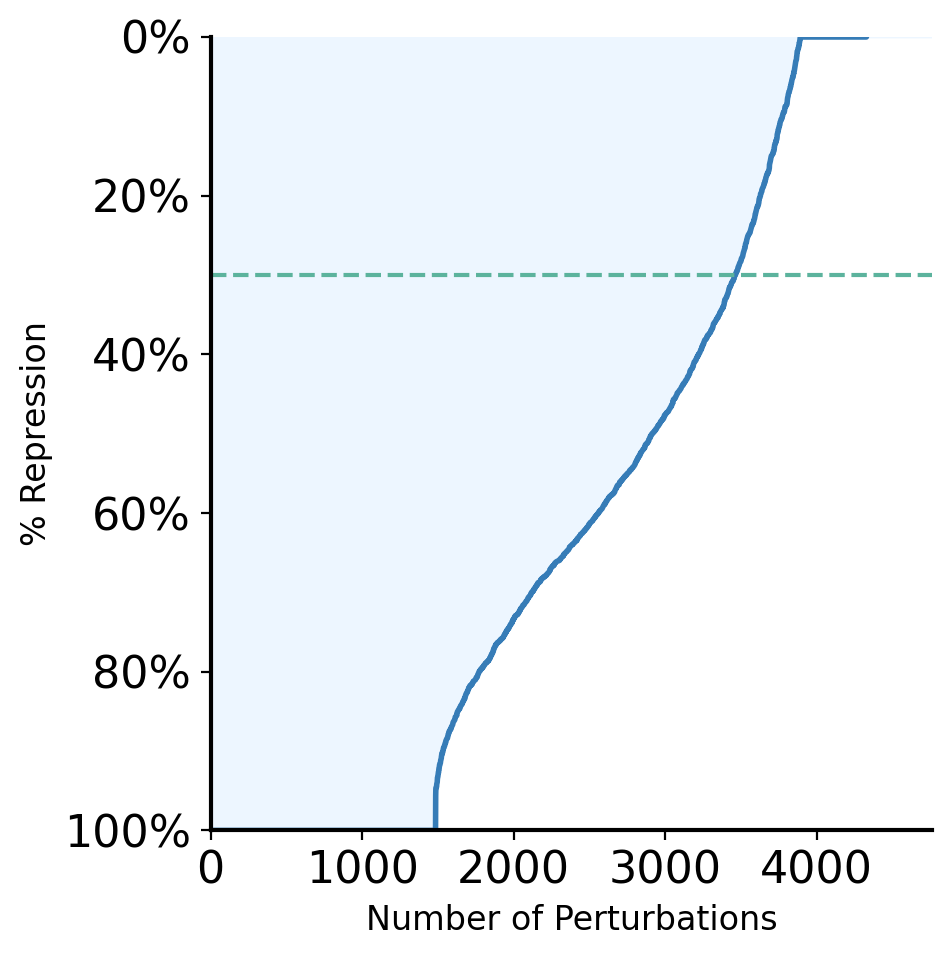

In [14]:
fig2 = psp.pl.plot_percentage_perturbations_by_repression(adata, perturbation_col='perturbation', xlabel='Number of Perturbations')

Plot percentage repression per gene target

Percentage of perturbations achieving 30.0% repression: 73.30% (1167/1592)


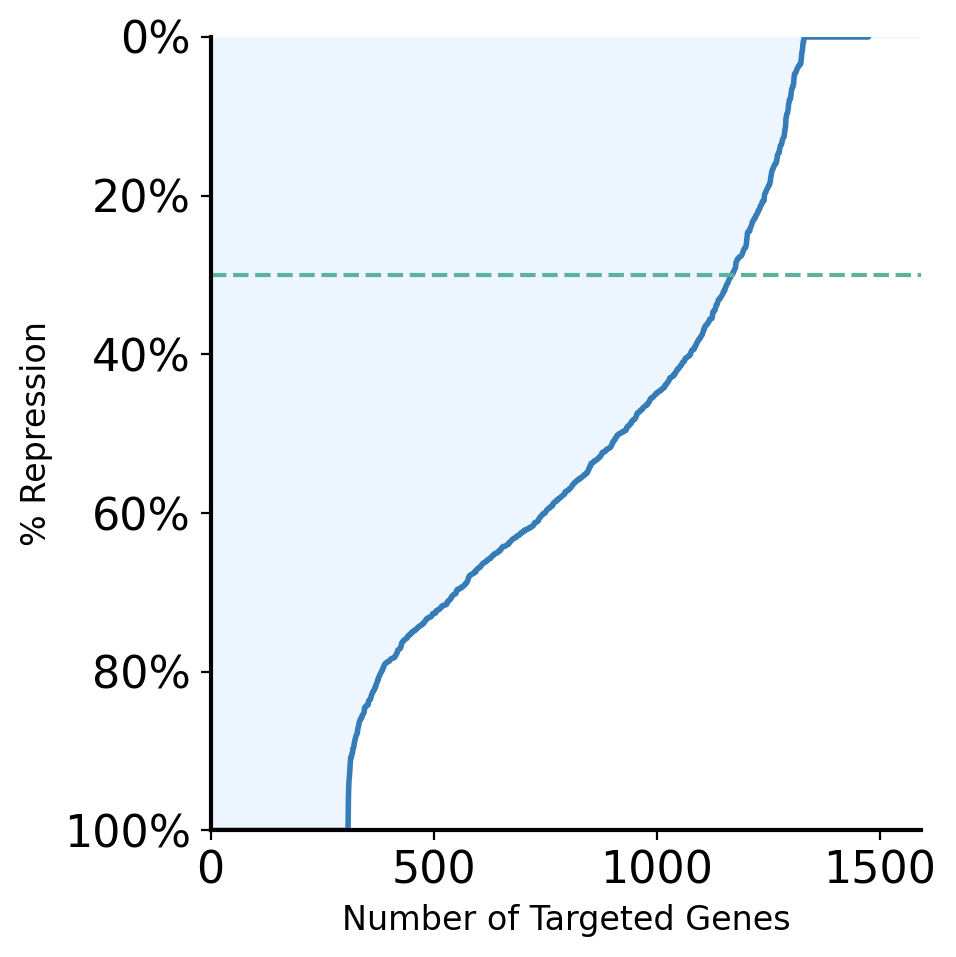

In [15]:
fig2 = psp.pl.plot_percentage_perturbations_by_repression(adata, perturbation_col='gene_target', xlabel='Number of Targeted Genes')

Remove cells that received sgRNA which do not result in 30+% on-target knockdown

Processing batch: ALPHA
Removing 1303 guides due to low repression (less than 30.0%)
Removing 11822 cells due to no repression (Target knockdown < 0)
Removing 117 guides due to low cell count per guide (less than 25 cells per guide)


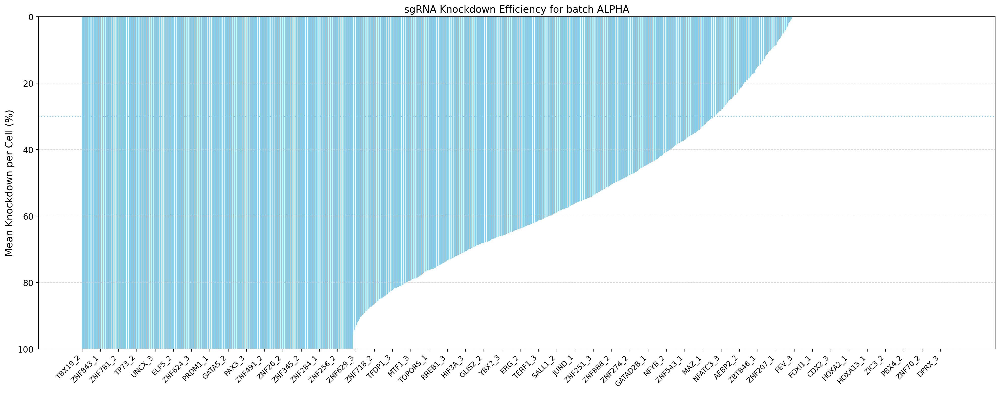

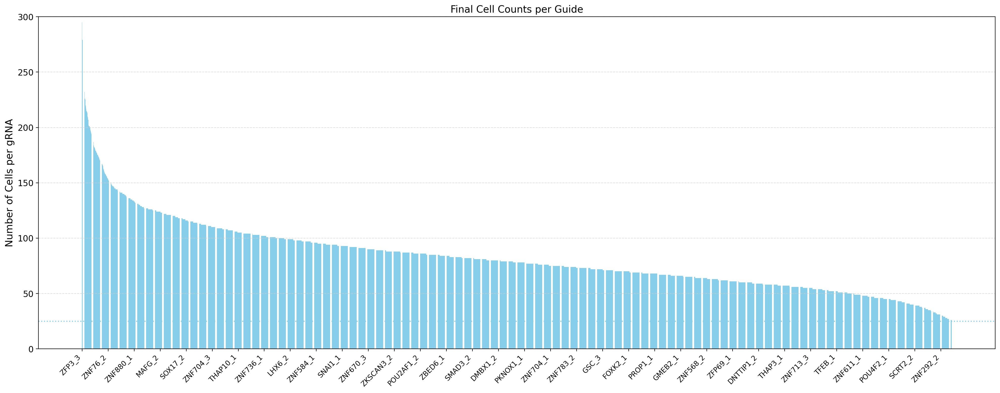

In [ ]:
adata = psp.pp.evaluate_per_sgRNA_knockdown(adata)

In [17]:
adata

AnnData object with n_obs × n_vars = 289519 × 20043
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'batch', 'perturbation', 'gene_target_ensembl_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

In [18]:
adata.write("/home/ranwyl/data_tf_project/KOLF_Pan_Genome_Alpha_CPMnorm_Knockdown_Filtered.h5ad")

Print statistics

In [19]:
# Final statistics
print(f"Total number of cells: {adata.n_obs}")
print(f"Total number of NTC sgRNAs: {psp.utils.get_ntc_view(adata).obs.gRNA.nunique()}")
print(f"Total number of NTC cells: {psp.utils.get_ntc_view(adata).n_obs}")
print(f"Total number of perturbations: {psp.utils.get_perturbed_view(adata).obs.gRNA.nunique()}")
print(f"Total number of genes targeted: {psp.utils.get_perturbed_view(adata).obs.gene_target.nunique()}")
print(f"Median number of cells per perturbation: {psp.utils.get_perturbed_view(adata).obs.perturbation.value_counts().median()}")
print(f"Median number of cells per gene_target: {psp.utils.get_perturbed_view(adata).obs.gene_target.value_counts().median()}")

Total number of cells: 289519
Total number of NTC sgRNAs: 234
Total number of NTC cells: 13674
Total number of perturbations: 3342
Total number of genes targeted: 1365
Median number of cells per perturbation: 78.0
Median number of cells per gene_target: 202.0


# Filtering sgRNAs by Energy Distance Testing

In [7]:
data_path = "/home/ranwyl/data_tf_project/KOLF_Pan_Genome_Alpha_CPMnorm_Knockdown_Filtered.h5ad"
adata = psp.utils.read_anndata(data_path)

In [8]:
import anndata as ad
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def plot_cells_per_kd_histogram(adata: ad.AnnData, 
                                obs_key: str="gRNA", 
                                title: str="",
                                fig_size: tuple=(4,3), 
                                bin_width: int=25, 
                                xtick_width: int=50):
    if obs_key not in {"gRNA", "gene_target"}:
        raise ValueError("obs_key must be 'gRNA' or 'gene_target'")
    plt.figure(figsize=fig_size)
    adata_xmax = max(adata.obs[obs_key].value_counts().values)
    xmax = ((adata_xmax // bin_width) + 1) * bin_width
    sns.histplot(adata.obs[obs_key].value_counts().values, binwidth=bin_width,
        binrange=(0,xmax), edgecolor="black")
    plt.xlim(0, xmax)
    plt.xticks(np.arange(0, xmax, xtick_width), fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlabel("# cells")
    if obs_key == "gRNA":
        plt.ylabel("# gRNAs", fontsize=13)
    else:
        plt.ylabel("# KDs", fontsize=13)
    plt.grid(False)
    plt.title(title)

In [13]:
adata[adata.obs.perturbed == "True"].obs.gRNA.nunique()

3342

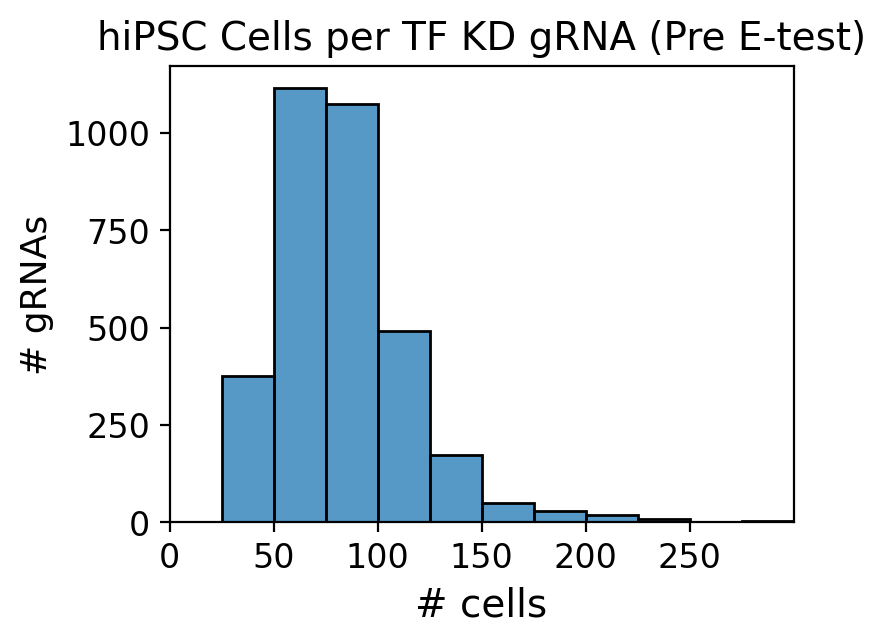

In [10]:
plot_cells_per_kd_histogram(adata[adata.obs.perturbed == "True"], 
                            "gRNA", "hiPSC Cells per TF KD gRNA (Pre E-test)")

In [3]:
# Delete "batch" from adata.obs so that data is processed as a single batch
del adata.obs["batch"]
adata

AnnData object with n_obs × n_vars = 289519 × 20043
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'perturbation', 'gene_target_ensembl_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

In [4]:
estats = psp.da.compute_etest(adata, n_jobs=25, seed=123)

Processing entire dataset as a single batch - 289519 cells
filtered out 59 genes that are detected in less than 3 cells
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:01)


/usr/lib64/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.


computing PCA
    with n_comps=50
    finished (0:00:39)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PCs', the loadings (adata.varm)
    'pca_variance', the variance / eigenvalues (adata.uns['pca'])
    'pca_variance_ratio', the variance ratio (adata.uns['pca'])
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:01:00)
    computed connectivities (0:00:03)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:03)
  Processing perturbations 1-500 of 3342


  0%|          | 0/10000 [00:00<?, ?it/s]

  Processing perturbations 501-1000 of 3342


  0%|          | 0/10000 [00:00<?, ?it/s]

  Processing perturbations 1001-1500 of 3342


  0%|          | 0/10000 [00:00<?, ?it/s]

  Processing perturbations 1501-2000 of 3342


  0%|          | 0/10000 [00:00<?, ?it/s]

  Processing perturbations 2001-2500 of 3342


  0%|          | 0/10000 [00:00<?, ?it/s]

  Processing perturbations 2501-3000 of 3342


  0%|          | 0/10000 [00:00<?, ?it/s]

  Processing perturbations 3001-3342 of 3342


  0%|          | 0/10000 [00:00<?, ?it/s]

E-test results stored in AnnData:
  • adata.uns['etest_results'] - Complete results DataFrame
  • adata.obs['perturbation_edist'] - Energy distance for each cell's perturbation
  • adata.obs['perturbation_pvalue'] - P-value for each cell's perturbation (batch-specific)
  • adata.obs['perturbation_significant'] - Whether cell's perturbation is significant (batch-specific)


In [5]:
adata

AnnData object with n_obs × n_vars = 289519 × 20043
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'perturbation', 'gene_target_ensembl_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'perturbation_edist', 'perturbation_pvalue', 'perturbation_significant'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'etest_results', 'etest_results_params'
    layers: 'counts'

In [6]:
estats.head()

,edist,pvalue,significant,pvalue_adj,significant_adj,neglog10_pvalue_adj,batch
DMRT2_1,-0.054357,0.3990,False,0.468148,False,0.329617,all
ARHGAP35_2,0.684763,0.1591,False,0.232388,False,0.633786,all
ESR2_2,2.983441,0.0060,True,0.028562,True,1.544216,all
CENPB_2,1.681764,0.0893,False,0.151146,False,0.820603,all
DUXA_3,6.251532,0.0047,True,0.024275,True,1.614836,all


In [7]:
estats.to_csv("/home/ranwyl/data_tf_project/etest_results_alpha_CPMnorm.csv")
adata.write("/home/ranwyl/data_tf_project/KOLF_Pan_Genome_Alpha_CPMnorm_Knockdown_Energy_Test_Computed.h5ad")    

In [8]:
print(f"{len(adata[adata.obs.perturbation_significant == True].obs.gRNA.unique().tolist())}"
    f" gRNAs pass significance threshold")

986 gRNAs pass significance threshold


Restart kernel

In [2]:
import pandas as pd
adata_filepath = "/home/ranwyl/data_tf_project/KOLF_Pan_Genome_Alpha_CPMnorm_Knockdown_Energy_Test_Computed.h5ad"
adata = psp.utils.read_anndata(adata_filepath)
estats_filepath = "/home/ranwyl/data_tf_project/etest_results_alpha_CPMnorm.csv"
estats = pd.read_csv(estats_filepath, index_col=0)

In [3]:
estats.head()

,edist,pvalue,significant,pvalue_adj,significant_adj,neglog10_pvalue_adj,batch
DMRT2_1,-0.054357,0.3990,False,0.468148,False,0.329617,all
ARHGAP35_2,0.684763,0.1591,False,0.232388,False,0.633786,all
ESR2_2,2.983441,0.0060,True,0.028562,True,1.544216,all
CENPB_2,1.681764,0.0893,False,0.151146,False,0.820603,all
DUXA_3,6.251532,0.0047,True,0.024275,True,1.614836,all


/home/ranwyl/psp_env/lib64/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
/home/ranwyl/psp_env/lib64/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10


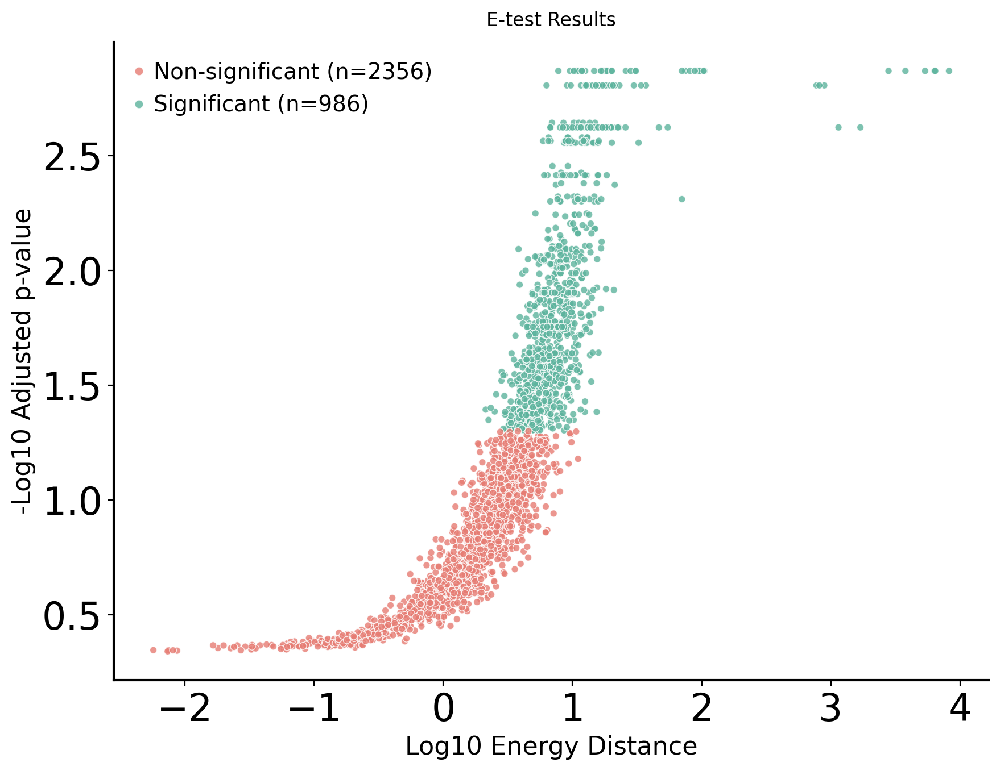

In [3]:
estats['gene'] = estats.index.to_series().str.rsplit('_', n=1).str[0]
fig = psp.pl.plot_etest_results(estats, significance_column="significant_adj",
                                pvalue_column="pvalue_adj",
                                palette={'True': '#5CB39D', 
                                         'False': '#E67C73', 
                                         'NTC': '#367CB7'})


Concordance between max repression and max energy distance:
  • 452/1197 genes (37.8%) have the same sgRNA showing maximum repression and maximum energy distance
  • Average Pearson correlation between repression and energy distance: -0.044
  • Median Pearson correlation: -0.083
  • Found valid correlations for 70/1197 genes


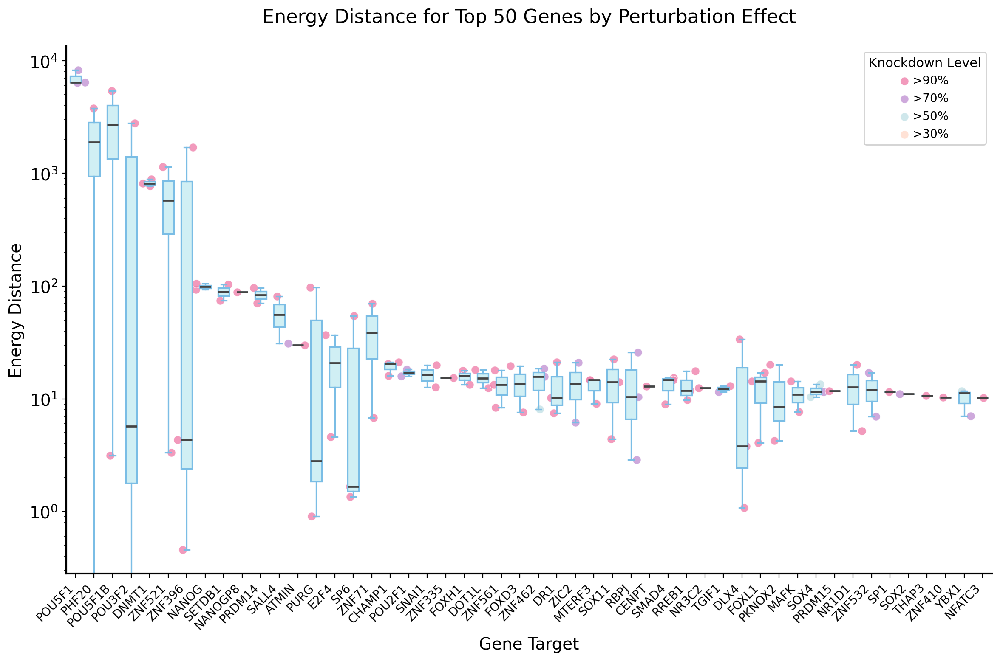

In [4]:
import warnings
# Catch this warning:
# /home/ranwyl/KOLF2.1J_Perturbation_Cell_Atlas/psp/pl/plotting.py:1085: 
#   ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    fig = psp.pl.plot_energy_distance_vs_knockdown(adata, log_scale=True, n_genes=50)

In [5]:
adata

AnnData object with n_obs × n_vars = 289519 × 20043
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'perturbation', 'gene_target_ensembl_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'perturbation_edist', 'perturbation_pvalue', 'perturbation_significant'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'etest_results', 'etest_results_params'
    layers: 'counts'

In [6]:
print(adata[adata.obs.perturbation_significant == True].shape[0])
print(adata[adata.obs.perturbed == "False"].shape[0])

88249
13674


In [7]:
adata_filtered = adata[(adata.obs.perturbation_significant == True) | 
                (adata.obs.perturbed == "False")].copy()
adata_filtered

AnnData object with n_obs × n_vars = 101923 × 20043
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'perturbation', 'gene_target_ensembl_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'perturbation_edist', 'perturbation_pvalue', 'perturbation_significant'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'etest_results', 'etest_results_params'
    layers: 'counts'

In [8]:
adata_filtered.write("/home/ranwyl/data_tf_project/KOLF_Pan_Genome_Alpha_CPMnorm_Knockdown_Energy_Test_Filtered.h5ad")

In [13]:
adata_filtered

AnnData object with n_obs × n_vars = 101923 × 20043
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'perturbation', 'gene_target_ensembl_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'perturbation_edist', 'perturbation_pvalue', 'perturbation_significant'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'etest_results', 'etest_results_params'
    layers: 'counts'

# Post E-Test Sanity Checks

In [2]:
adata_filepath = "/home/ranwyl/data_tf_project/KOLF_Pan_Genome_Alpha_CPMnorm_Knockdown_Energy_Test_Filtered.h5ad"
adata_filtered = psp.utils.read_anndata(adata_filepath)

In [3]:
adata_filtered

AnnData object with n_obs × n_vars = 101923 × 20043
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'perturbation', 'gene_target_ensembl_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'perturbation_edist', 'perturbation_pvalue', 'perturbation_significant'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'etest_results', 'etest_results_params'
    layers: 'counts'

In [3]:
adata_kds = adata_filtered[adata_filtered.obs.perturbed == "True"]
print(adata_kds.shape)

(88249, 20043)


In [4]:
adata_ntc = adata_filtered[adata_filtered.obs.perturbed == "False"]
print(adata_ntc.shape)

(13674, 20043)


In [6]:
print(f"Number of perturbing gRNAs: {adata_kds.obs.gRNA.nunique()}")
print(f"Number of unique TF KDs: {adata_kds.obs.gene_target.nunique()}")
print(f"Number of NTC gRNAs: {adata_ntc.obs.gRNA.nunique()}")

Number of perturbing gRNAs: 986
Number of unique TF KDs: 726
Number of NTC gRNAs: 234


In [18]:
import anndata as ad
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def plot_cells_per_kd_histogram(adata: ad.AnnData, 
                                obs_key: str="gRNA", 
                                title: str="",
                                fig_size: tuple=(4,3), 
                                bin_width: int=25, 
                                xtick_width: int=50,
                                color: str | None = None):
    if obs_key not in {"gRNA", "gene_target"}:
        raise ValueError("obs_key must be 'gRNA' or 'gene_target'")
    plt.figure(figsize=fig_size)
    adata_xmax = max(adata.obs[obs_key].value_counts().values)
    xmax = ((adata_xmax // bin_width) + 1) * bin_width
    if color:
        sns.histplot(adata.obs[obs_key].value_counts().values, 
                     binwidth=bin_width, binrange=(0,xmax), 
                     edgecolor="black", color=color)
    else:
        sns.histplot(adata.obs[obs_key].value_counts().values, 
                     binwidth=bin_width, binrange=(0,xmax), 
                     edgecolor="black")
    plt.xlim(0, xmax)
    plt.xticks(np.arange(0, xmax, xtick_width), fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlabel("# cells")
    if obs_key == "gRNA":
        plt.ylabel("# gRNAs", fontsize=13)
    else:
        plt.ylabel("# KDs", fontsize=13)
    plt.grid(False)
    plt.title(title)

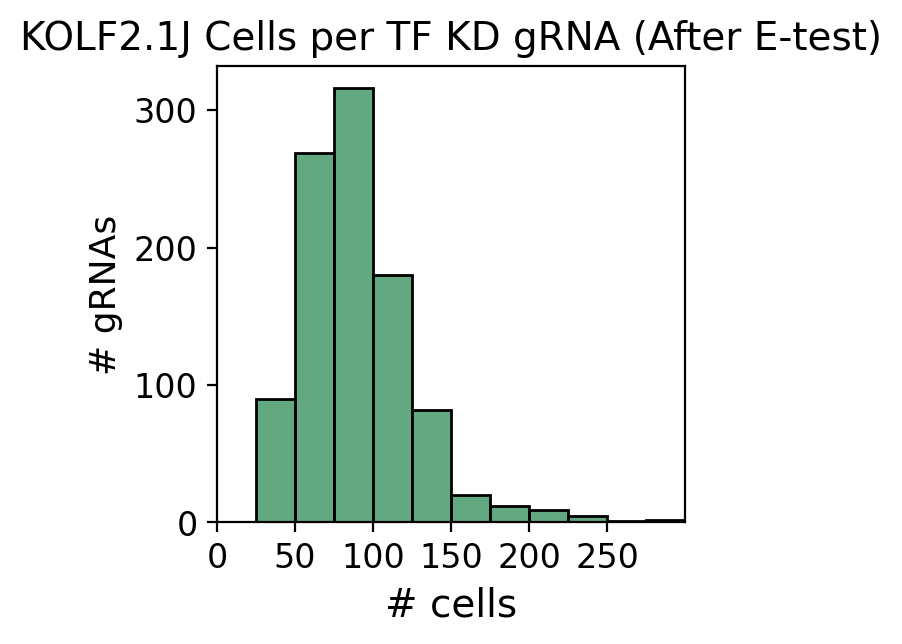

In [8]:
plot_cells_per_kd_histogram(adata_kds, obs_key="gRNA", 
                            title="KOLF2.1J Cells per TF KD gRNA (After E-test)", 
                            color="seagreen", fig_size=(3,3))

In [6]:
print(f"Mean cells per TF KD gRNA: {adata_kds.obs.gRNA.value_counts().mean():.0f}")
print(f"Median cells per TF KD gRNA: {adata_kds.obs.gRNA.value_counts().median():.0f}")

Mean cells per TF KD gRNA: 90
Median cells per TF KD gRNA: 85


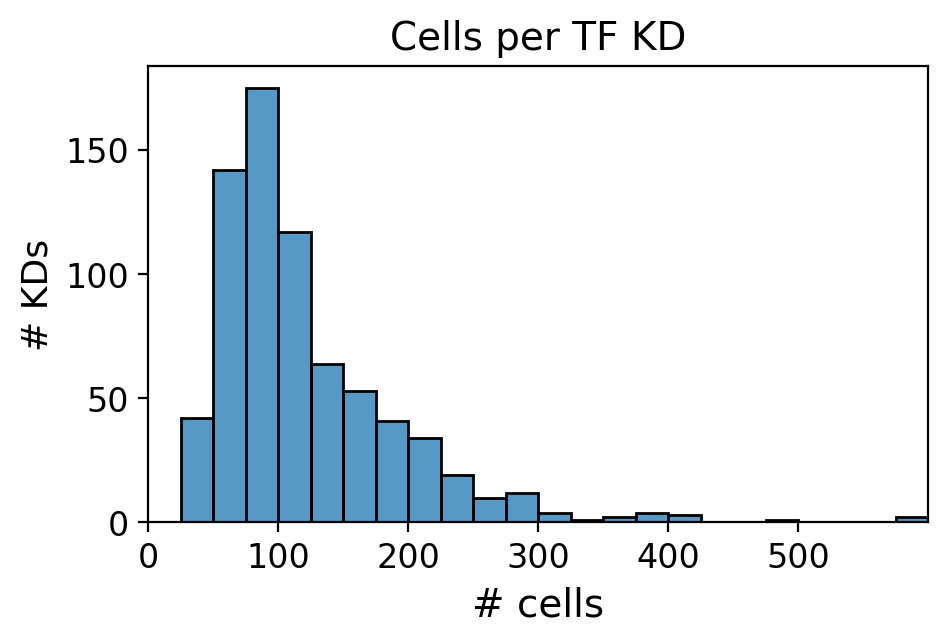

In [22]:
plot_cells_per_kd_histogram(adata_kds, "gene_target", "Cells per TF KD", 
               fig_size=(5,3), xtick_width=100)

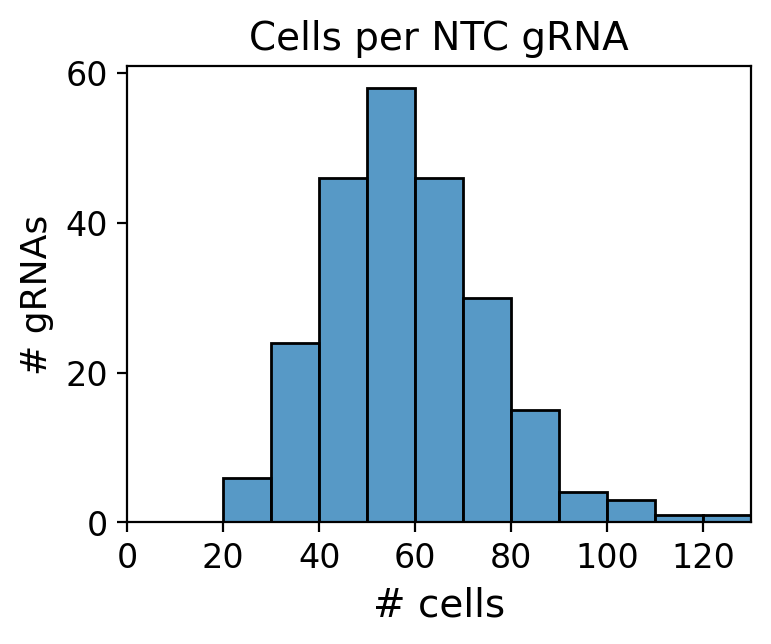

In [23]:
plot_cells_per_kd_histogram(adata_ntc, "gRNA", "Cells per NTC gRNA", 
    bin_width=10, xtick_width=20)

In [7]:
print(f"Mean cells per NTC gRNA: {adata_ntc.obs.gRNA.value_counts().mean():.0f}")
print(f"Median cells per NTC gRNA: {adata_ntc.obs.gRNA.value_counts().median():.0f}")

Mean cells per NTC gRNA: 58
Median cells per NTC gRNA: 56


How many gRNAs per gene target?

In [60]:
import pandas as pd

def count_gRNA_per_gene_target(adata, print_results=True):
    gene_target_list = adata.obs.gene_target.unique().tolist()
    gene_target_dict = {gene: 0 for gene in gene_target_list}
    gRNA_list = adata.obs.gRNA.unique().tolist()
    for gRNA in gRNA_list:
        gene_target = gRNA.split("_")[0]
        gene_target_dict[gene_target] += 1
    df = pd.DataFrame.from_dict(gene_target_dict, orient="index",
        columns=["n_gRNA"])
    df.index.name = "gene_target"
    if print_results == True:
        n_gRNA_list = [1, 2, 3]
        for n in n_gRNA_list:
            df_filt = df[df["n_gRNA"] == n]
            print(f"Number of gene targets with {n} gRNA: {df_filt.shape[0]}")
    return df

In [61]:
gRNA_count_df = count_gRNA_per_gene_target(adata_kds)

Number of gene targets with 1 gRNA: 503
Number of gene targets with 2 gRNA: 186
Number of gene targets with 3 gRNA: 37


In [62]:
gRNA_count_df.head()

,n_gRNA
gene_target,
ESR2,1
ZNF14,2
JRKL,1
TWIST1,1
GATA6,3


Check gene expression

In [9]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'
import seaborn as sns
import scanpy as sc

def filter_low_expressed_genes(adata, tf_set, percent_threshold=0, min_n_cells=0, silent=False):
    """
    Filter out bottom percentile of genes with lowest expression (counts) 
    and genes expressed in fewer than min_n_cells cells.
    Do not filter out genes that are TFs in tf_set.
    """
    n_genes_before = adata.shape[1]

    # Filter genes expressed in fewer than min_n_cells cells
    if silent == False:
        print(f"Removing non-TF genes expressed in <{min_n_cells} cells")
    # Create data matrix
    if silent == False:
        print("Copying data")
    data_matrix = adata.layers["counts"] if "counts" in adata.layers else adata.X
    data_matrix = data_matrix.copy()
    # Convert from sparse to dense if necessary
    if hasattr(data_matrix, 'toarray'):
        if silent == False:
            print("Converting data from sparse to dense")
        data_matrix = data_matrix.toarray()
    if silent == False:
        print("Filtering genes")
    # Create mask for TFs
    tf_mask = adata.var_names.isin(tf_set)
    # Calculate number of cells expressing each gene
    gene_detected_counts = (data_matrix > 0).sum(axis=0)
    # Set cell number threshold and filter genes
    genes_pass_cell_thr = gene_detected_counts >= min_n_cells
    genes_to_keep = genes_pass_cell_thr | tf_mask
    adata = adata[:, genes_to_keep]
    print(f"Removed {n_genes_before - adata.n_vars} "
        f"non-TF genes expressed in <{min_n_cells} cells")
    n_genes_after_cell_filt = adata.n_vars
    del data_matrix

    # Filter bottom percentile of genes by expression (counts)
    if silent == False:
        print(f"\nRemoving bottom {percent_threshold}% of genes by expression (CPM)")
    if silent == False:
        print("Copying data")
    adata_norm = adata.copy()
    sc.pp.normalize_total(adata_norm, target_sum=1e6)
    if silent == False:
        print("Copying normalized data")
    data_matrix = adata_norm.X.copy()
    # Convert from sparse to dense if necessary
    if hasattr(data_matrix, 'toarray'):
        if silent == False:
            print("Converting data from sparse to dense")
        data_matrix = data_matrix.toarray()
    if silent == False:
        print("Filtering genes")
    # Create mask for TFs
    tf_mask = adata.var_names.isin(tf_set)
    # Calculate mean expression of each gene
    mean_expr_per_gene = data_matrix.mean(axis=0)
    # Set percent threshold and filter genes
    threshold = np.percentile(mean_expr_per_gene, percent_threshold)
    genes_pass_pct_thr = mean_expr_per_gene > threshold
    genes_to_keep = genes_pass_pct_thr | tf_mask
    adata = adata[:,genes_to_keep]
    print(f"Removed {n_genes_after_cell_filt - adata.n_vars} non-TF genes "
            f"with lowest {percent_threshold}% expression (CPM)")
    print(f"\nRemoved: {n_genes_before - adata.shape[1]} genes total")
    print(f"Remaining: {adata.n_vars} genes")
    del data_matrix
    del adata_norm
    gc.collect()
    return adata.copy()

def histogram_mean_expression(adata, title="Histogram of Mean Gene Expression", 
                              n_bins=75, ymax=None, show_labels=False):
    plt.rcParams["font.size"] = 14
    # Create data matrix
    adata = adata.copy()
    if "counts" in adata.layers:
        adata.X = adata.layers["counts"].copy()
    # Normalize and log1p
    sc.pp.normalize_total(adata, target_sum=1e6)
    sc.pp.log1p(adata)
    # Copy
    data_matrix = adata.X.copy()
    # Convert from sparse to dense if necessary
    if hasattr(data_matrix, 'toarray'):
        data_matrix = data_matrix.toarray()

    # Plot mean expression
    mean_expr = data_matrix.mean(axis=0)
    plt.figure(figsize=(8,4)) if show_labels else plt.figure(figsize=(6,4))
    ax = sns.histplot(mean_expr, bins=n_bins, kde=False)
    plt.xlabel("Mean expression per gene (CPM, log1p)")
    plt.ylabel("Number of genes")
    plt.title(title, fontsize=15)
    if ymax:
        ax.set_ylim(0, ymax)
    if show_labels:
        ax.bar_label(ax.containers[0], rotation=90, padding=3, fontsize=10)
    plt.tight_layout()
    plt.show()
    del data_matrix
    gc.collect()

def histogram_cells_expressing_gene(adata, title="Histogram of # Cells Expressing a Gene", 
                                    n_bins=75, ymax=None, show_labels=False):
    plt.rcParams["font.size"] = 14
    # Use raw counts
    count_matrix = adata.X if "counts" not in adata.layers else adata.layers["counts"]
    count_matrix = count_matrix.copy()
    # Convert from sparse to dense if necessary
    if hasattr(count_matrix, 'toarray'):
        count_matrix = count_matrix.toarray()
    # Plot number of cells expressing each gene
    gene_detected_counts = (count_matrix > 0).sum(axis=0)
    plt.figure(figsize=(8,4)) if show_labels else plt.figure(figsize=(6,4))
    ax = sns.histplot(gene_detected_counts, bins=n_bins, kde=False)
    plt.xlabel("Number of cells in which gene is expressed")
    plt.ylabel("Number of genes")
    plt.title(title, fontsize=15)
    if ymax:
        ax.set_ylim(0, ymax)
    if show_labels:
        ax.bar_label(ax.containers[0], rotation=90, padding=3, fontsize=10)
    plt.tight_layout()
    plt.show()
    del count_matrix
    gc.collect()

normalizing counts per cell
    finished (0:00:00)


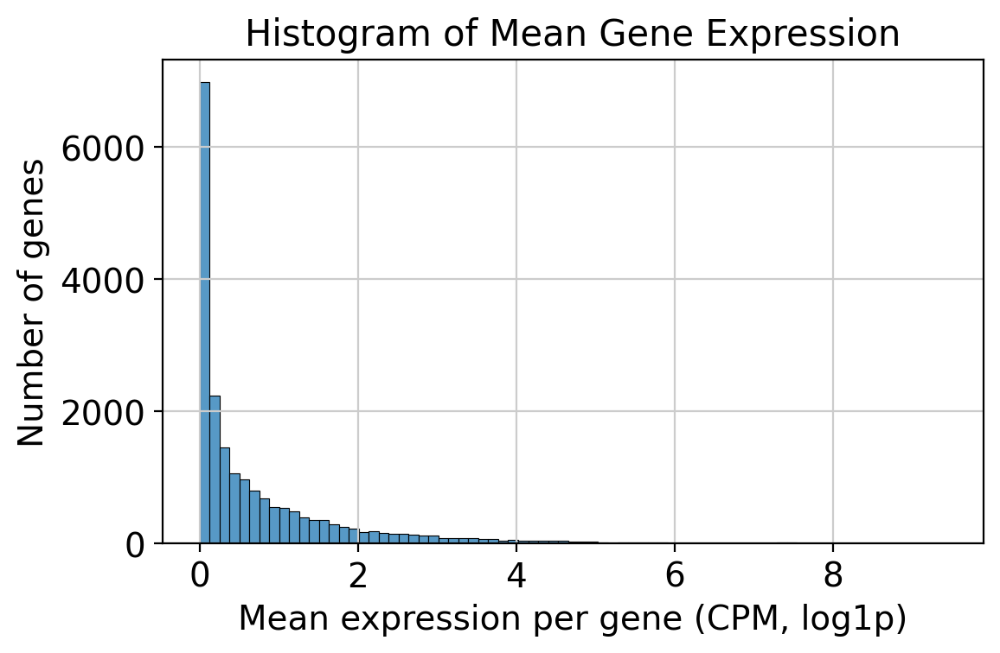

In [ ]:
histogram_mean_expression(adata_filtered)

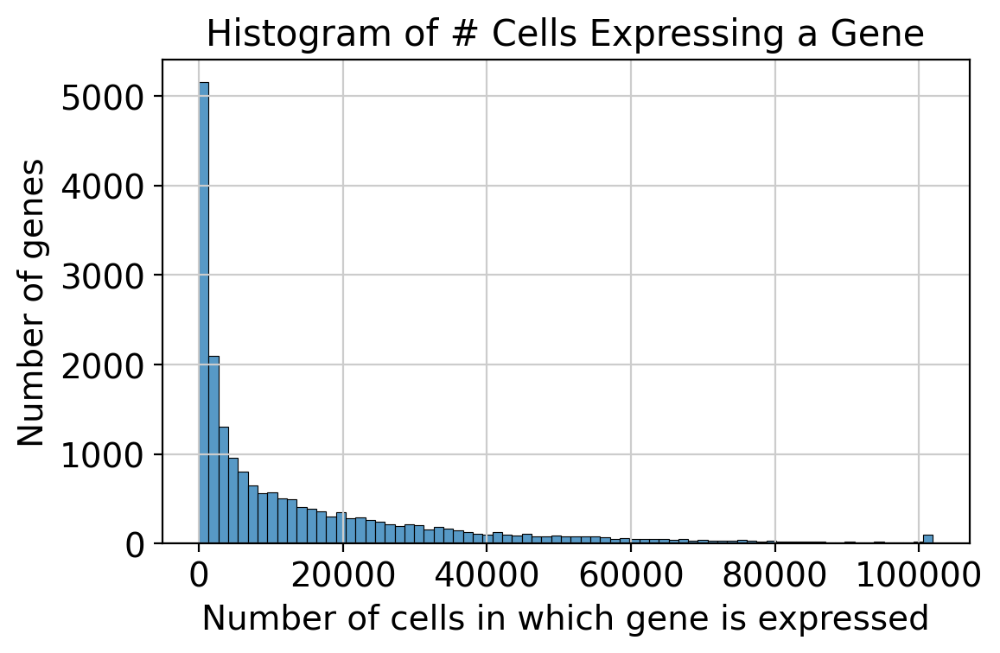

In [12]:
histogram_cells_expressing_gene(adata_filtered)

Knockdown efficiency

In [23]:
def plot_KD_efficiency(adata, figsize=(4,3), group_by="gRNA",
                            title="Mean knockdown efficiency"):
    adata_kd = adata[adata.obs.perturbed == "True"]
    if (group_by == "gRNA") or (group_by == "gene_target"):
        kd_efficiency = 100 * adata_kd.obs.groupby(group_by)["target_knockdown"].mean()
    else:
        kd_efficiency = 100 * adata_kd.obs["target_knockdown"]
    plt.figure(figsize=figsize)
    sns.histplot(kd_efficiency, binwidth=10, binrange=(0,100))
    plt.xlim(0, 100)
    plt.xticks(np.arange(0, 100, 10), fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(False)
    plt.title(title)

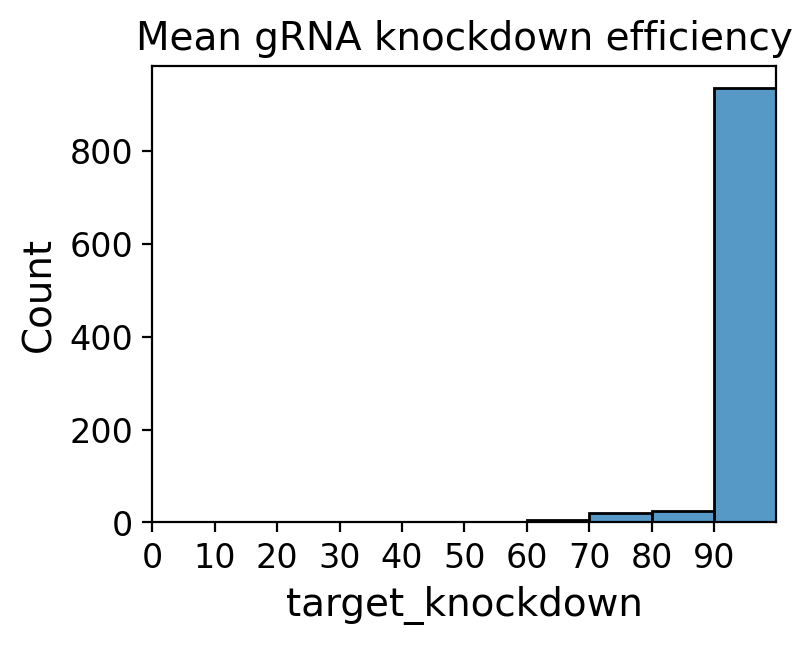

In [19]:
plot_KD_efficiency(adata_filtered, group_by="gRNA", title="Mean gRNA knockdown efficiency")

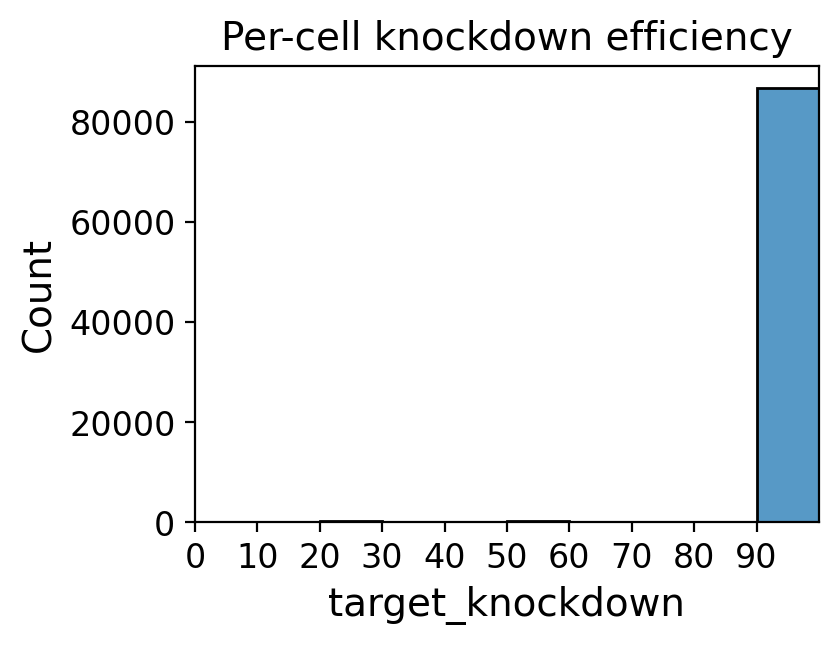

In [24]:
plot_KD_efficiency(adata_filtered, group_by="cell", title="Per-cell knockdown efficiency")

In [41]:
import pandas as pd
import numpy as np

def find_cells_low_knockdown_efficiency(adata, kd_efficiency_pct_threshold=50):
    adata_kd = adata[adata.obs.perturbed == "True"]
    kd_efficiency = 100 * adata_kd.obs["target_knockdown"].values
    kd_efficiency_df = pd.DataFrame(kd_efficiency, columns=["Cell KD efficiency"], 
                                    index=adata_kd.obs.gRNA.values)
    kd_low_efficiency_df = kd_efficiency_df[kd_efficiency_df['Cell KD efficiency'] < kd_efficiency_pct_threshold]
    print(f"{len(kd_low_efficiency_df)} out of {adata.shape[0]} cells "
          f"have <{kd_efficiency_pct_threshold}% KD efficiency")
    print(f"Number of gRNAs with low KD efficiency cells: {kd_low_efficiency_df.index.nunique()}")
    return kd_efficiency_df

In [43]:
kd_cell_efficiency_df = find_cells_low_knockdown_efficiency(adata_filtered, 60)

1082 out of 101923 cells have <60% KD efficiency
Number of gRNAs with low KD efficiency cells: 94


UMI counts

In [11]:
import numpy as np
import pandas as pd

In [12]:
mean_kd_umi = round(adata_filtered[adata_filtered.obs.perturbed == "True"].obs.n_UMI_counts.mean())
mean_ntc_umi = round(adata_filtered[adata_filtered.obs.perturbed == "False"].obs.n_UMI_counts.mean())
mean_umi = round(adata_filtered.obs.n_UMI_counts.mean())

median_kd_umi = round(adata_filtered[adata_filtered.obs.perturbed == "True"].obs.n_UMI_counts.median())
median_ntc_umi = round(adata_filtered[adata_filtered.obs.perturbed == "False"].obs.n_UMI_counts.median())
median_umi = round(adata_filtered.obs.n_UMI_counts.median())

In [13]:
umi_dict = {"Mean":[mean_umi, mean_kd_umi, mean_ntc_umi], "Median": [median_umi, median_kd_umi, median_ntc_umi]}
umi_df = pd.DataFrame(umi_dict, index=["All cells UMI", "KD cell UMI", "NTC cell UMI"])
umi_df

,Mean,Median
All cells UMI,5828,5323
KD cell UMI,5919,5415
NTC cell UMI,5242,4788


In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_umis(adata, subset="all", title="UMI counts (all cells)", 
              figsize=(4,3), bin_width=500, xtick_width=1000, xmax=None,
              ymax=None):
    if subset.lower() == "kd":
        adata = adata[adata.obs.perturbed == "True"]
    elif subset.lower() == "ntc":
        adata = adata[adata.obs.perturbed == "False"]
    umi_counts = adata.obs.n_UMI_counts
    if xmax is None:
        xmax = ((max(umi_counts) // bin_width) + 1) * bin_width
    plt.figure(figsize=figsize)
    sns.histplot(umi_counts, binwidth=bin_width, binrange=(0, xmax))
    plt.xlim(0, xmax)
    if ymax:
        plt.ylim(0, ymax)
    plt.xticks(np.arange(0, xmax, xtick_width), fontsize=10, rotation=60)
    plt.yticks(fontsize=10)
    plt.grid(False)
    plt.title(title)
    plt.show()

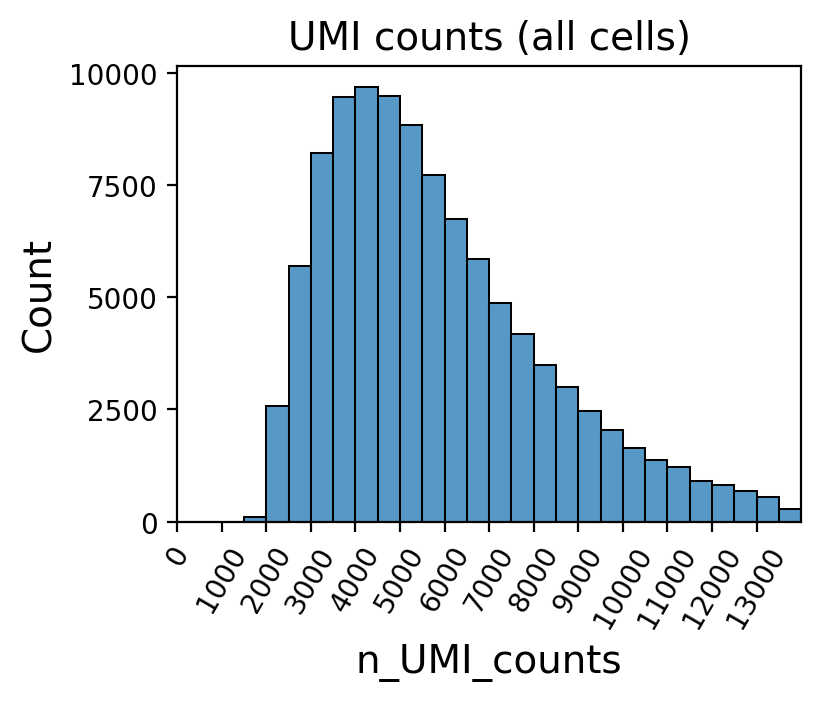

In [15]:
plot_umis(adata_filtered)

# Check for ~75% genome coverage and filter genes

In [2]:
data_path = "/home/ranwyl/data_tf_project/KOLF_Pan_Genome_Alpha_CPMnorm_Knockdown_Energy_Test_Filtered.h5ad"
adata = psp.utils.read_anndata(data_path)
adata

AnnData object with n_obs × n_vars = 101923 × 20043
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'perturbation', 'gene_target_ensembl_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'perturbation_edist', 'perturbation_pvalue', 'perturbation_significant'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'etest_results', 'etest_results_params'
    layers: 'counts'

In [3]:
# Genome coverage testing
import numpy as np
import anndata as ad
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
plt.rcParams.update({'font.size': 12})

def compute_genome_coverage_for_gRNA_pseudoreps(adata: ad.AnnData, 
                                                gRNA: str, 
                                                rng: np.random.Generator,
                                                include_total: bool=True) -> dict:
    """
    Generate differential expression analysis pseudoreplicates for the given gRNA
    and compute genome coverage (number of genes expressed in rep divided by
    number of genes in dataset).
    """
    data_matrix = adata.X
    total_n_genes = adata.shape[1]
    genome_coverage = list() # n genes expressed in rep/n genes in adata
    # Create gRNA pseudoreplicates
    gRNA_indices = np.where(adata.obs['gRNA'] == gRNA)[0]
    n_cells = len(gRNA_indices)
    n_reps = 2 if n_cells < 75 else 3
    rep_size = len(gRNA_indices) // n_reps
    sample_size = rep_size * n_reps
    sampled_gRNA_indices = rng.choice(gRNA_indices, sample_size, replace=False)
    # Number of expressed genes for all cells that received this gRNA
    gRNA_profile = data_matrix[sampled_gRNA_indices].sum(axis=0)
    gRNA_n_expr_genes = np.count_nonzero(gRNA_profile)
    # Compute genome coverage for each rep
    for rep in range(n_reps):
        # Number of expressed genes in rep
        start, stop = rep*rep_size, (rep+1)*rep_size
        rep_indices = sampled_gRNA_indices[start:stop]
        rep_profile = data_matrix[rep_indices].sum(axis=0)
        rep_n_expr_genes = np.count_nonzero(rep_profile)
        # Genome coverage
        rep_genome_coverage = np.round(rep_n_expr_genes / total_n_genes, 2)
        genome_coverage.append(rep_genome_coverage)
    # If no 3rd rep, add NaN value
    if len(genome_coverage) == 2:
        genome_coverage.append(np.nan)
    # Add total
    if include_total == True:
        total_genome_coverage = np.round(gRNA_n_expr_genes / total_n_genes, 2)
        genome_coverage.append(total_genome_coverage)
    # Return results
    return genome_coverage

def build_DE_gRNA_rep_genome_coverage_df(
        adata: ad.AnnData, 
        n_cells_per_gRNA: list[int] | None = None, 
        n_gRNA_per_size: int = 0, 
        gRNA_list: list[str] | None = None,
        random_state: int=42, 
        include_total: bool=True,
        n_reps: int=3):
    """
    For each of the given numbers of cells per gRNA, sample a given number of gRNA,
    generate differential expression analysis pseudoreplicates for each gRNA,
    and compute genome coverage (number of genes expressed in rep divided by
    number of genes in dataset).
    """
    # Check that necessary inputs are provided
    if n_cells_per_gRNA is None:
        n_cells_per_gRNA = []
    if gRNA_list is None:
        gRNA_list = []
    if n_cells_per_gRNA != [] and n_gRNA_per_size == 0:
        raise ValueError("Must provide number of gRNA to sample per size (cell number)")
    if n_cells_per_gRNA == [] and n_gRNA_per_size != 0:
        raise ValueError("Must provide list of gRNA cell numbers")
    if n_cells_per_gRNA == [] and gRNA_list == []:
        raise ValueError("Must provide list of gRNA or gRNA cell numbers")

    # Subset only KD cells and reset adata.X to counts
    adata = adata[adata.obs.perturbed == "True"].copy()
    adata.X = adata.layers["counts"].copy()

    # Build DF of number of cells per gRNA
    cells_per_gRNA = adata.obs.gRNA.value_counts()
    cells_per_gRNA = cells_per_gRNA.rename_axis("gRNA").reset_index(name="n_cells")

    # Generate RNG objects
    rng = np.random.default_rng(random_state)
    rngs = rng.spawn(2)
    gRNA_rng, reps_rng = rngs[0], rngs[1]
    
    # Initialize dict for genome coverage
    genome_coverage_dict = dict()

    # If a gRNA list is not provided, randomly sample gRNA
    if gRNA_list == []:
        # Loop through desired sizes of cells, e.g. [25, 30)
        for i in range(len(n_cells_per_gRNA)-1):
            # Filter to only gRNA with desired number of cells
            min_n_cells, max_n_cells = n_cells_per_gRNA[i], n_cells_per_gRNA[i+1]
            print(f"Sampling gRNA with {min_n_cells}-{max_n_cells-1} cells")
            filt_cells_per_gRNA = \
                cells_per_gRNA[(cells_per_gRNA["n_cells"] >= min_n_cells) & 
                (cells_per_gRNA["n_cells"] < max_n_cells)].copy()
            # If DF is empty, skip this cell number
            if filt_cells_per_gRNA.empty:
                continue
            # If number of gRNA > desired number, sample randomly
            if filt_cells_per_gRNA.shape[0] > n_gRNA_per_size:
                all_gRNA_indices = filt_cells_per_gRNA.index.tolist()
                chosen_gRNA_indices = gRNA_rng.choice(all_gRNA_indices, n_gRNA_per_size,
                                        replace=False)
                filt_cells_per_gRNA = \
                    filt_cells_per_gRNA[filt_cells_per_gRNA.index.isin(chosen_gRNA_indices)].copy()
            # Build gRNA list
            filt_cells_per_gRNA.sort_values(by="n_cells", inplace=True)
            gRNA_list += filt_cells_per_gRNA["gRNA"].tolist()
    else: # Sort gRNA list by number of cells per gRNA
        filt_cells_per_gRNA = cells_per_gRNA[cells_per_gRNA["gRNA"].isin(gRNA_list)].copy()
        filt_cells_per_gRNA.sort_values(by="n_cells", inplace=True)
        gRNA_list = filt_cells_per_gRNA["gRNA"].tolist()

    # For all gRNA, generate pseudoreps and calculate genome coverage
    for i in tqdm(range(len(gRNA_list)), desc="Computing genome coverage for gRNA"):
        gRNA = gRNA_list[i]
        # Get number of cells for gRNA
        gRNA_idx = cells_per_gRNA[cells_per_gRNA["gRNA"] == gRNA].index[0]
        gRNA_n_cells = cells_per_gRNA.at[gRNA_idx, "n_cells"]
        gRNA_entry = f"{gRNA} ({gRNA_n_cells} cells)"
        # Compute genome and gRNA gene coverage for pseudoreps
        genome_coverage_list = \
            compute_genome_coverage_for_gRNA_pseudoreps(adata, gRNA, reps_rng, include_total)
        genome_entry = {f"rep{i+1}": genome_coverage_list[i] for i in range(n_reps)}
        if include_total == True:
            genome_entry["total"] = genome_coverage_list[-1]
        genome_coverage_dict[gRNA_entry] = genome_entry
    
    # Build DFs
    genome_coverage_df = pd.DataFrame.from_dict(genome_coverage_dict, orient="index")
    return genome_coverage_df

def plot_gene_coverage_heatmap(genome_coverage_df: pd.DataFrame, title: str,
                               cmap: str="viridis", annot: bool=True,
                               figsize: tuple=(3,8)):
    plt.figure(figsize=figsize)
    nan_mask = genome_coverage_df.isna()
    ax = sns.heatmap(genome_coverage_df, cmap=cmap, annot=annot, annot_kws={"size": 8},
        mask=nan_mask, vmin=0, vmax=1, linewidths=0.5, xticklabels=True)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=10)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=10)
    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=10)
    plt.grid(False)
    plt.title(title, pad=10, fontsize=12)
    plt.show()

Sample 5 gRNA of each size 25-100 cells. See if each pseudoreplicate achieves 75% genome coverage.

In [4]:
gRNA_genome_coverage_df = build_DE_gRNA_rep_genome_coverage_df(adata, 
    n_cells_per_gRNA = [25, 30, 35, 40, 45, 50], n_gRNA_per_size=5,
    include_total=False, random_state=12345)

Sampling gRNA with 25-29 cells
Sampling gRNA with 30-34 cells
Sampling gRNA with 35-39 cells
Sampling gRNA with 40-44 cells
Sampling gRNA with 45-49 cells


Computing genome coverage for gRNA: 100%|██████████| 25/25 [00:35<00:00,  1.42s/it]


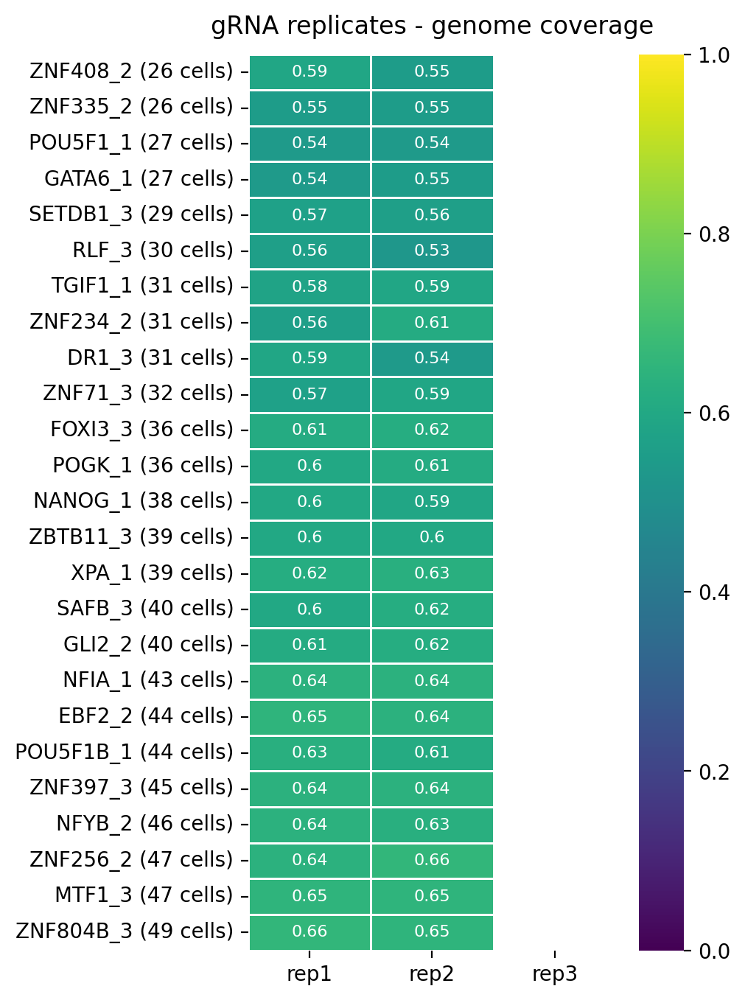

In [5]:
plot_gene_coverage_heatmap(gRNA_genome_coverage_df, figsize=(4,8),
    title="gRNA replicates - genome coverage")

In [6]:
gRNA_genome_coverage_df2 = build_DE_gRNA_rep_genome_coverage_df(adata, 
    n_cells_per_gRNA=[75, 80, 85, 90, 95, 100], n_gRNA_per_size=5,
    include_total=False, random_state=12345)

Sampling gRNA with 75-79 cells
Sampling gRNA with 80-84 cells
Sampling gRNA with 85-89 cells
Sampling gRNA with 90-94 cells
Sampling gRNA with 95-99 cells


Computing genome coverage for gRNA: 100%|██████████| 25/25 [00:48<00:00,  1.92s/it]


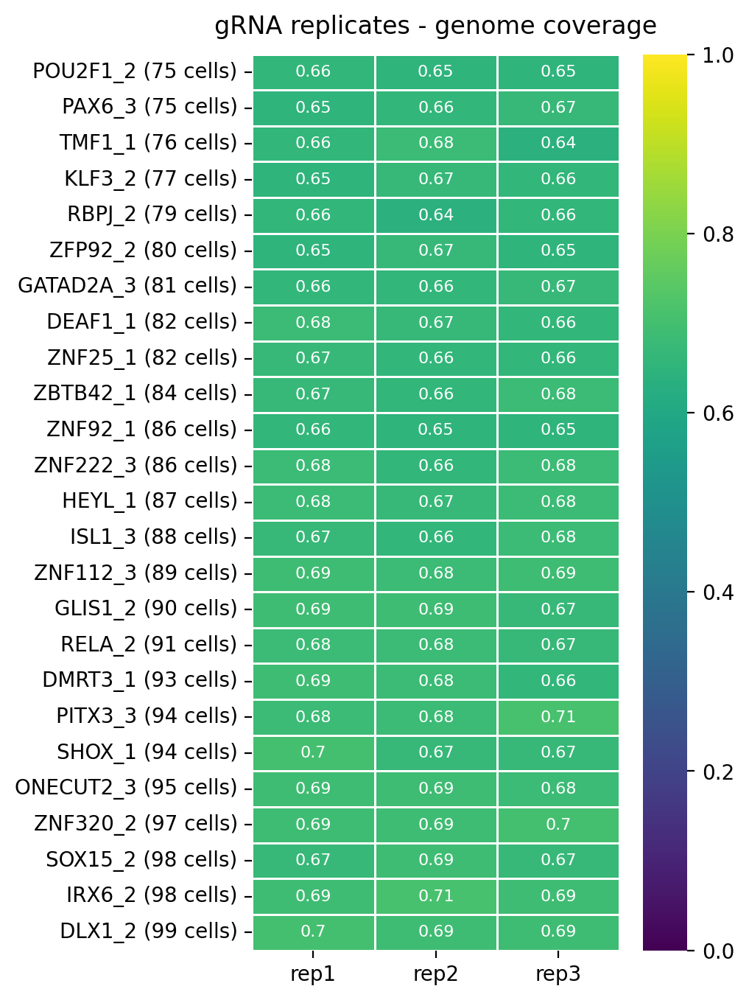

In [7]:
plot_gene_coverage_heatmap(gRNA_genome_coverage_df2, figsize=(4,8),
    title="gRNA replicates - genome coverage")

Pseudoreplicates of size 12-24 cells (~100 gRNAs with <50 cells) only have 55-60% genome coverage, while pseudoreplicates of size 25-33 cells (~600 gRNAs with 50-100 cells) have 65-70% genome coverage.

In [8]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'
import seaborn as sns
import scanpy as sc

def filter_low_expressed_genes(adata, percent_threshold=0, min_n_cells=0, silent=False):
    """
    Filter out bottom percentile of genes with lowest expression (counts) 
    and genes expressed in fewer than min_n_cells cells.
    Do not filter out genes that are gene_targets in adata.
    """
    n_genes_before = adata.shape[1]

    # Filter genes expressed in fewer than min_n_cells cells
    if silent == False:
        print(f"Removing non-TF genes expressed in <{min_n_cells} cells")
    # Create data matrix
    if silent == False:
        print("Copying data")
    data_matrix = adata.layers["counts"] if "counts" in adata.layers else adata.X
    data_matrix = data_matrix.copy()
    # Convert from sparse to dense if necessary
    if hasattr(data_matrix, 'toarray'):
        if silent == False:
            print("Converting data from sparse to dense")
        data_matrix = data_matrix.toarray()
    if silent == False:
        print("Filtering genes")
    # Create mask for TFs
    tf_mask = adata.var_names.isin(adata.obs.gene_target.unique().tolist())
    # Calculate number of cells expressing each gene
    gene_detected_counts = (data_matrix > 0).sum(axis=0)
    # Set cell number threshold and filter genes
    genes_pass_cell_thr = gene_detected_counts >= min_n_cells
    genes_to_keep = genes_pass_cell_thr | tf_mask
    adata = adata[:, genes_to_keep]
    print(f"Removed {n_genes_before - adata.n_vars} "
        f"non-TF genes expressed in <{min_n_cells} cells")
    n_genes_after_cell_filt = adata.n_vars
    del data_matrix

    # Filter bottom percentile of genes by expression (counts)
    if silent == False:
        print(f"\nRemoving bottom {percent_threshold}% of genes by expression (CPM)")
    if silent == False:
        print("Copying data")
    adata_norm = adata.copy()
    sc.pp.normalize_total(adata_norm, target_sum=1e6)
    if silent == False:
        print("Copying normalized data")
    data_matrix = adata_norm.X.copy()
    # Convert from sparse to dense if necessary
    if hasattr(data_matrix, 'toarray'):
        if silent == False:
            print("Converting data from sparse to dense")
        data_matrix = data_matrix.toarray()
    if silent == False:
        print("Filtering genes")
    # Create mask for TFs
    tf_mask = adata.var_names.isin(adata.obs.gene_target.unique().tolist())
    # Calculate mean expression of each gene
    mean_expr_per_gene = data_matrix.mean(axis=0)
    # Set percent threshold and filter genes
    threshold = np.percentile(mean_expr_per_gene, percent_threshold)
    genes_pass_pct_thr = mean_expr_per_gene > threshold
    genes_to_keep = genes_pass_pct_thr | tf_mask
    adata = adata[:,genes_to_keep]
    print(f"Removed {n_genes_after_cell_filt - adata.n_vars} non-TF genes "
            f"with lowest {percent_threshold}% expression (CPM)")
    print(f"\nRemoved: {n_genes_before - adata.shape[1]} genes total")
    print(f"Remaining: {adata.n_vars} genes")
    del data_matrix
    del adata_norm
    gc.collect()
    return adata.copy()

In [9]:
adata_filt = filter_low_expressed_genes(adata, min_n_cells=100, percent_threshold=20)

Removing non-TF genes expressed in <100 cells
Copying data


Converting data from sparse to dense
Filtering genes
Removed 188 non-TF genes expressed in <100 cells

Removing bottom 20% of genes by expression (CPM)
Copying data
normalizing counts per cell
    finished (0:00:00)
Copying normalized data
Converting data from sparse to dense
Filtering genes
Removed 3740 non-TF genes with lowest 20% expression (CPM)

Removed: 3928 genes total
Remaining: 16115 genes


In [10]:
gRNA_genome_coverage_df_filt = build_DE_gRNA_rep_genome_coverage_df(adata_filt, 
    n_cells_per_gRNA = [25, 30, 35, 40, 45, 50], n_gRNA_per_size=5, 
    include_total=False, random_state=12345)

Sampling gRNA with 25-29 cells
Sampling gRNA with 30-34 cells
Sampling gRNA with 35-39 cells
Sampling gRNA with 40-44 cells
Sampling gRNA with 45-49 cells


Computing genome coverage for gRNA: 100%|██████████| 25/25 [00:35<00:00,  1.41s/it]


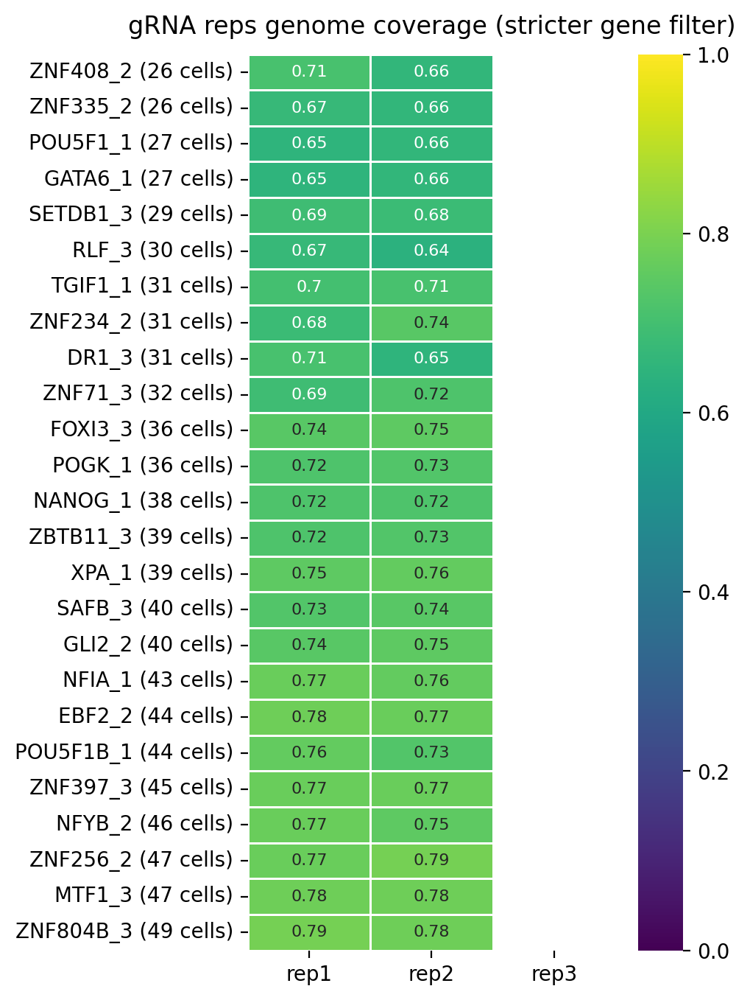

In [11]:
plot_gene_coverage_heatmap(gRNA_genome_coverage_df_filt, figsize=(4,8),
    title="gRNA reps genome coverage (stricter gene filter)")

In [12]:
gRNA_genome_coverage_df_filt2 = build_DE_gRNA_rep_genome_coverage_df(adata_filt, 
    n_cells_per_gRNA=[75, 80, 85, 90, 95, 100], n_gRNA_per_size=5,
    include_total=False, random_state=12345)

Sampling gRNA with 75-79 cells
Sampling gRNA with 80-84 cells
Sampling gRNA with 85-89 cells
Sampling gRNA with 90-94 cells
Sampling gRNA with 95-99 cells


Computing genome coverage for gRNA: 100%|██████████| 25/25 [00:47<00:00,  1.90s/it]


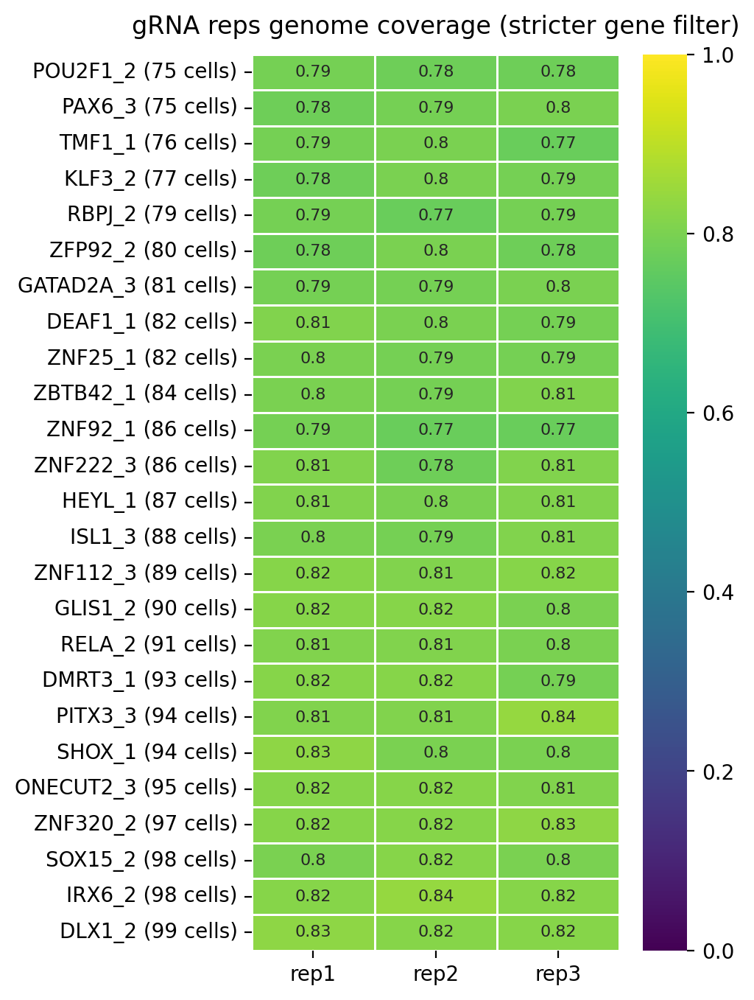

In [13]:
plot_gene_coverage_heatmap(gRNA_genome_coverage_df_filt2, figsize=(4,8),
    title="gRNA reps genome coverage (stricter gene filter)")

Reps of size 12-24 cells have ~65-75% genome coverage and reps of size 25-33 have ~75-80% genome coverage. This gene filter is adequate and now DE analysis can be performed.

In [ ]:
adata_filt.write("/home/ranwyl/data_tf_project/KOLF_Pan_Genome_Alpha_CPMnorm_KD_ETest_Gene_Filtered.h5ad")

Restart kernel

# DGE analysis functions

In [2]:
import anndata as ad
import numpy as np
import pandas as pd
from scipy import sparse
from tqdm_joblib import tqdm_joblib
from joblib import Parallel, delayed
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats
from pydeseq2.default_inference import DefaultInference
import warnings
from contextlib import contextmanager
import gc
import seaborn as sns

# Handle warnings
@contextmanager
def handle_warnings(suppress):
    if suppress:
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            yield
    else:
        yield

def generate_matched_pseudoreplicates_for_DE(adata: ad.AnnData, 
                                            target_value: str, 
                                            ntc_cell_indices: pd.Index, 
                                            rng: np.random.Generator, 
                                            target_column: str = "perturbation", 
                                            min_cells_per_rep: int = 25,
                                            layer: str = "counts"
                                            ) -> tuple[pd.DataFrame, pd.DataFrame]:
    """
    Generate independent pseudoreplicates for a given target (gRNA or gene target) 
    and matched NTC cells. Manually set NTC as reference for DE analysis.
    """
    # Create views for target and NTC cells
    if target_column not in adata.obs:
        print(f"Error: {target_column} not in adata.obs")
        return
    target_mask = adata.obs[target_column] == target_value
    target_view = adata[target_mask]
    ntc_view = adata[ntc_cell_indices]

    # Get data matrices from counts layer
    if layer in adata.layers:
        target_data = target_view.layers[layer]
        ntc_data = ntc_view.layers[layer]
    else:
        target_data = target_view.X
        ntc_data = ntc_view.X        
    
    # Convert to dense if sparse
    if sparse.issparse(target_data):
        target_data = target_data.toarray()
    if sparse.issparse(ntc_data):
        ntc_data = ntc_data.toarray()

    # Calculate number of cells to sample
    n_target_cells = target_data.shape[0]
    n_ntc_cells = ntc_data.shape[0]
    if n_target_cells >= min_cells_per_rep * 2:
        n_reps = min(3, n_target_cells // min_cells_per_rep)
    else: # If too few cells for 2 reps x min_cells_per_rep cells
        n_reps = 2
    target_rep_size = n_target_cells // n_reps
    ntc_rep_size = min(target_rep_size, n_ntc_cells // n_reps)
    if ntc_rep_size < target_rep_size:
        print("Warning: Unmatched number of target and NTC cells")

    # Pre-allocate arrays for results
    target_bulk = np.zeros((n_reps, target_data.shape[1]), dtype=np.int64)
    ntc_bulk = np.zeros((n_reps, ntc_data.shape[1]), dtype=np.int64)

    # Sample cells for all replicates
    target_sample_size = target_rep_size * n_reps
    ntc_sample_size = ntc_rep_size * n_reps
    sampled_target_indices = \
        rng.choice(n_target_cells, target_sample_size, replace=False)
    sampled_ntc_indices = \
        rng.choice(n_ntc_cells, ntc_sample_size, replace=False)
    # Generate replicates using vectorized operations
    for i in range(n_reps):
        # Sample indices
        target_start, target_stop = i*target_rep_size, (i+1)*target_rep_size
        target_rep_indices = sampled_target_indices[target_start:target_stop]
        ntc_start, ntc_stop = i*ntc_rep_size, (i+1)*ntc_rep_size
        ntc_rep_indices = sampled_ntc_indices[ntc_start:ntc_stop]

        # Calculate sums using vectorized operations
        target_bulk[i] = np.sum(target_data[target_rep_indices], axis=0).astype(np.int64)
        ntc_bulk[i] = np.sum(ntc_data[ntc_rep_indices], axis=0).astype(np.int64)  

    # Create sample names
    if "_" in target_value:
        target_value = target_value.replace("_", "-")
    sample_names = [f"{target_value}-rep{i+1}" for i in range(n_reps)]
    control_names = [f"NTC-rep{i+1}" for i in range(n_reps)]
    
    # Combine data
    combined_data = np.vstack([target_bulk, ntc_bulk])
    combined_names = sample_names + control_names
    
    # Create metadata DF
    metadata_df = pd.DataFrame({
        'condition': [target_value] * n_reps + ['NTC'] * n_reps
    }, index=combined_names)
    # Set NTC as reference for DESeq2
    metadata_df["condition"] = pd.Categorical(
        metadata_df["condition"],
        categories=["NTC", target_value],
        ordered=True
        )
    
    # Create counts DF
    counts_df = pd.DataFrame(
        combined_data,
        index=combined_names,
        columns=adata.var_names
    )

    return counts_df, metadata_df

def matched_differential_expression(adata: ad.AnnData,
                                    layer: str = "counts",
                                    min_cells_per_rep: int = 12,
                                    random_state: int = 42,
                                    n_cpus_for_DE: int = 3,
                                    n_jobs_parallel: int = 25,
                                    alpha: float = 0.05,
                                    DE_fit_type: str = "parametric",
                                    target_column: str = "perturbation",
                                    ntc_target_delimiter: str = "NTC",
                                    lfc_shrink: bool = False,
                                    lfc_shrink_adapt: bool = False,
                                    suppress_warnings: bool = False,
                                    debug: bool = False
                                    ) -> dict[str, pd.DataFrame]:
    """
    Perform pseudobulk DE analysis with pseudoreplicates on each 
    gRNA or gene target against a matched number of NTC cells.
    Return dict {target: DE results DF for that target}.
    """
    # Identify KD and NTC cells
    perturbations = list(adata.obs[target_column].unique())
    perturbations.remove(ntc_target_delimiter) # Remove NTC group
    if debug == True: # Debug mode: run with 3 perturbations
        print(f"Running in debug mode with 3 perturbations")
        perturbations = perturbations[:3]
    ntc_cell_indices = np.where(adata.obs[target_column] == ntc_target_delimiter)[0]

    # Create RNG object
    de_rng = np.random.default_rng(random_state)
    
    # Helper function
    def process_perturbation(target: str, rng: np.random.Generator):
        # Generate pseudoreplicates
        pseudo_bulk_df, metadata_df = generate_matched_pseudoreplicates_for_DE(
            adata, target, ntc_cell_indices, rng=rng, 
            target_column=target_column, layer=layer, 
            min_cells_per_rep=min_cells_per_rep
        )

        # DE analysis
        inference = DefaultInference(n_cpus=n_cpus_for_DE)
        quiet = False if debug is True else True
        with handle_warnings(suppress_warnings):
            # Read counts modeling and fitting dispersions
            dds = DeseqDataSet(
                counts = pseudo_bulk_df, 
                metadata = metadata_df,
                ref_level = ["condition", ntc_target_delimiter],
                refit_cooks=True,
                fit_type=DE_fit_type,
                inference=inference,
                quiet=quiet
                )
            dds.deseq2()
            
            # Statistical testing
            target_hyphenated = target.replace('_', '-')
            contrast = ["condition", target_hyphenated, ntc_target_delimiter]
            stat_res = DeseqStats(
                dds, 
                contrast=contrast, 
                alpha=alpha,
                inference=inference,
                quiet=quiet)
            stat_res.summary()
            if lfc_shrink:
                lfc_shrink_coeff = f"condition_{target_hyphenated}_vs_{ntc_target_delimiter}"
                stat_res.lfc_shrink(coeff=lfc_shrink_coeff, adapt=lfc_shrink_adapt)
            de_results = stat_res.results_df

        # Clean up memory
        del pseudo_bulk_df, metadata_df, dds, stat_res
        gc.collect()

        return de_results

    # Run DE analysis on all targets in parallel
    with tqdm_joblib(desc="Running DE analysis", total=len(perturbations)):
        de_results = Parallel(n_jobs=n_jobs_parallel)(
            delayed(process_perturbation)(pert, de_rng) for pert in perturbations)
    results_dict = dict(zip(perturbations, de_results))
    return results_dict

def ntc_benchmarking_matched_DE(adata: ad.AnnData,
                                layer: str = "counts",
                                min_cells_per_rep: int = 25,
                                random_state: int = 42,
                                n_cpus_for_DE: int = 3,
                                n_jobs_parallel: int = 25, 
                                alpha: float = 0.05,
                                DE_fit_type: str = "parametric",
                                ntc_target_delimiter: str = "NTC",
                                gRNA_column: str = "gRNA",
                                suppress_warnings: bool = False,
                                debug: bool = False
                                ) -> pd.DataFrame:
    """
    Perform DE analysis on each NTC gRNA against a matched
    number of other NTC cells. 
    Return dict {NTC gRNA: DE results DF for that NTC gRNA}.
    """
    ntc_adata = adata[adata.obs.gene_target == ntc_target_delimiter].copy()
    # Get unique NTC sgRNAs
    ntc_gRNAs = list(ntc_adata.obs[gRNA_column].unique())
    if debug == True:
        print("Running in debug mode with 5 NTC sgRNA")
        ntc_gRNAs = ntc_gRNAs[:5]
    # Create RNG object to handle case where one is not provided
    de_rng = np.random.default_rng(random_state)
    
    # Helper function
    def process_ntc_gRNA(target_ntc_gRNA: str,
                         rng: np.random.Generator):
        # Check if there are enough target cells
        target_cells = ntc_adata[ntc_adata.obs[gRNA_column] == target_ntc_gRNA].obs.index
        if len(target_cells) < 10:
            print(f"Skipping {target_ntc_gRNA}: too few cells ({len(target_cells)})")
            return
        
        # Get other NTC cells (excluding the target gRNA)
        other_ntc_cells = ntc_adata[ntc_adata.obs[gRNA_column] != target_ntc_gRNA].obs.index
        if len(other_ntc_cells) < 10:
            print(f"Skipping {target_ntc_gRNA}: too few other NTC cells ({len(other_ntc_cells)})")
            return
        
        # Temporarily create "perturbation" column to use with generate_pseudoreplicates_for_DE
        # This labels target gRNA cells as the "perturbation" and other NTC cells as "NTC"
        ntc_adata_temp = ntc_adata.copy()
        ntc_adata_temp.obs["temp_pert"] = "NTC"
        ntc_adata_temp.obs.loc[ntc_adata_temp.obs[gRNA_column] == target_ntc_gRNA, 'temp_pert'] = target_ntc_gRNA
        
        # Generate pseudoreplicates
        pseudo_bulk_df, metadata_df = generate_matched_pseudoreplicates_for_DE(
            ntc_adata_temp, target_ntc_gRNA, other_ntc_cells, rng, 
            target_column="temp_pert", layer=layer, 
            min_cells_per_rep=min_cells_per_rep
        )

        # DE analysis
        inference = DefaultInference(n_cpus=n_cpus_for_DE)
        with handle_warnings(suppress_warnings):
            # Read counts modeling and fitting dispersions
            dds = DeseqDataSet(
                counts = pseudo_bulk_df, 
                metadata = metadata_df,
                refit_cooks=True,
                ref_level=["condition", ntc_target_delimiter],
                fit_type=DE_fit_type,
                inference=inference,
                quiet=True
                )
            dds.deseq2()
            
            # Statistical testing
            target_hyphenated = target_ntc_gRNA.replace('_', '-')
            contrast = ["condition", target_hyphenated, ntc_target_delimiter]
            stat_res = DeseqStats(
                dds, 
                contrast=contrast, 
                alpha=alpha,
                inference=inference,
                quiet=True)
            stat_res.summary()
            de_results = stat_res.results_df

        # Clean up memory
        del pseudo_bulk_df, metadata_df, dds, stat_res, ntc_adata_temp
        gc.collect()

        return de_results

    # Run DE analysis on all NTC sgRNA in parallel
    with tqdm_joblib(desc="Running DE analysis", total=len(ntc_gRNAs)):
        de_results = Parallel(n_jobs=n_jobs_parallel)(
            delayed(process_ntc_gRNA)(ntc_gRNA, de_rng) for ntc_gRNA in ntc_gRNAs)
    results_dict = dict(zip(ntc_gRNAs, de_results))
    return results_dict

def report_ntc_benchmarking_results(results_dict: dict, 
                                    alpha: float = 0.05,
                                    threshold_type: str = "padj", 
                                    percentile: int = 95,
                                    title: str = "Distribution of DEGs in NTC comparisons"):
    """
    Determine the threshold (number of DEGs) at which 95% of NTC gRNA have 
    fewer DEGs. Plot the distribution of DEGs for NTC gRNA and print
    a summary of results.
    """
    if (threshold_type != "padj") & (threshold_type != "pvalue"):
        raise ValueError("threshold_type must be 'padj' or 'pvalue'")
    # Counts DEGs per gRNA
    deg_counts = {}
    for ntc_gRNA, result_df in results_dict.items():
        if result_df is None:
            continue
        deg_count = sum((result_df[threshold_type] < alpha) & pd.notna(result_df[threshold_type]))
        deg_counts[ntc_gRNA] = deg_count

    # Create results DataFrame
    benchmark_results = pd.DataFrame.from_dict(deg_counts, orient='index', columns=['n_DEGs'])
    benchmark_results = benchmark_results.sort_values('n_DEGs', ascending=False)
    
    # Calculate percentile threshold
    if len(benchmark_results) > 0:
        deg_threshold = np.percentile(benchmark_results['n_DEGs'].values, percentile)
    else:
        print("No results to calculate percentile.")
        return
    
    # Plot results with improved styling - code from psp.de.benchmark_NTC_FDR()
    # Set style parameters
    plt.rcParams['axes.spines.top'] = False
    plt.rcParams['axes.spines.right'] = False
    # Create figure
    fig, ax = plt.subplots(figsize=(6, 4), dpi=100)
    fig.patch.set_facecolor('white')
    # Prepare bar plot data: discrete DEG counts
    deg_counts = benchmark_results['n_DEGs'].value_counts().sort_index()
    # Create bar plot
    ax.bar(
        deg_counts.index,
        deg_counts.values,
        alpha=0.8,
        color='#4682B4',   # Steel blue
        edgecolor='white',
        linewidth=1.5
    )
    # Add threshold line with improved styling
    ax.axvline(
        deg_threshold,
        color='#B22222',  # Firebrick
        linestyle='-',
        linewidth=2,
        alpha=0.8
    )
    # Labels and title with improved styling
    ax.set_xlabel('Number of DEGs', fontsize=12, labelpad=10)
    ax.set_ylabel('Number of NTC sgRNA comparisons', fontsize=12, labelpad=10)
    ax.set_title(title, fontsize=14, pad=20)
    # Turn off grid
    ax.grid(False)
    # Adjust tick parameters
    ax.tick_params(axis='both', which='major', labelsize=10, pad=5)
    # Add some padding to the axes
    ax.margins(x=0.02)
    # Add custom legend-like text at bottom
    threshold_text = f"{threshold_type} {alpha} threshold: {int(deg_threshold)} DEGs"
    fig.text(0.5, 0.01, threshold_text, ha='center', fontsize=11, color='#B22222', weight='bold')
    # Adjust layout
    plt.tight_layout(rect=[0, 0.02, 1, 0.98])
    plt.show()
    
    # Print statistics
    print(f"NTC Benchmark Statistics:")
    print(f"  • {threshold_type} {alpha} threshold: {int(deg_threshold)} DEGs")
    print(f"  • NTC comparisons analyzed: {len(benchmark_results)}")
    print(f"  • Mean DEGs per comparison: {benchmark_results['n_DEGs'].mean():.1f}")
    print(f"  • Median DEGs per comparison: {benchmark_results['n_DEGs'].median():.1f}")
    print(f"  • {percentile}% of comparisons have < {int(deg_threshold)} DEGs")

    return int(deg_threshold), benchmark_results

In [47]:
def build_DE_df(results_dict: dict) -> pd.DataFrame:
    """
    Build DGE results DataFrame where index = all genes and each KD
    has a set of columns for base mean, LFC, LFC standard error,
    Wald test statistic, pval, and padj.
    """
    df_list = list()
    for target, df in results_dict.items():
        df = df.sort_index() # Sort genes alphabetically
        # Prepend perturbation name to each column label
        new_col_names = {col: f"{target}_{col}" for col in df}
        df = df.rename(columns=new_col_names)
        df_list.append(df)
    # Concatenate all DE result DataFrames (using intersection of genes)
    de_df = pd.concat(df_list, axis=1)
    de_df = de_df.sort_index() # Sort genes alphabetically
    return de_df

def build_n_DEGs_df(DE_results_df: pd.DataFrame, 
                    alpha: float, 
                    threshold_type: str="pvalue", 
                    target_type: str="gRNA"):
    """
    Build a DF of the number of DEGs that pass significance threshold
    per gRNA or gene target.
    """
    if (target_type != "gRNA") & (target_type != "gene_target"):
        raise ValueError("target_type must be 'gRNA' or 'gene_target")
    if (threshold_type != "pvalue") & (threshold_type != "padj"):
        raise ValueError("threshold_type must be 'pvalue' or 'padj'")
    if target_type == "gRNA":
        targets = {"_".join(col.split("_")[:2]) for col in DE_results_df.columns}
    else:
        targets = {col.split("_")[0] for col in DE_results_df.columns}
    targets = list(sorted(list(targets)))
    DEGs_arr = np.zeros(len(targets), dtype=int)
    for i, target in enumerate(targets):
        target_p_col = f"{target}_{threshold_type}"
        n_DEGs = len(DE_results_df.loc[DE_results_df[target_p_col] < alpha])
        DEGs_arr[i] = n_DEGs
    n_DEGs_df = pd.DataFrame(DEGs_arr, index=targets, columns=["n_DEGs"])
    return n_DEGs_df

def test_pvals(DE_results_df: pd.DataFrame, 
               pval_list: list[float], 
               target_type: str="gRNA", 
               pval_delimiter: str="pvalue", 
               ntc_deg_threshold: float=1):
    """
    Given a DF of DGE results and a list of p-values, compute the
    number of genes with pval < each pval in the list for each gRNA
    or gene target. Return the mean and median number of DE genes across
    all gRNAs/gene targets.
    """
    if (target_type != "gRNA") & (target_type != "gene_target"):
        raise ValueError("target_type must be 'gRNA' or 'gene_target")
    if target_type == "gRNA":
        targets = {"_".join(col.split("_")[:2]) for col in DE_results_df.columns}
    else:
        targets = {col.split("_")[0] for col in DE_results_df.columns}
    DEGs_df_dict = {f"pval < {pval}":[] for pval in pval_list}
    for pval in pval_list:
        DEGs_arr = np.zeros(len(targets))
        for i, target in enumerate(targets):
            target_pval_col = f"{target}_{pval_delimiter}"
            n_DEGs = len(DE_results_df.loc[DE_results_df[target_pval_col] < pval])
            DEGs_arr[i] = n_DEGs
        DEGs_df_dict[f"pval < {pval}"].append(int(np.mean(DEGs_arr)))
        DEGs_df_dict[f"pval < {pval}"].append(int(np.median(DEGs_arr)))
        DEGs_df_dict[f"pval < {pval}"].append(int(len(DEGs_arr[DEGs_arr > ntc_deg_threshold])))
    DEGs_df = pd.DataFrame.from_dict(DEGs_df_dict, orient="index", 
                                     columns=[f"mean DEGs per KD {target_type}", 
                                              f"median DEGs per KD {target_type}",
                                              f"KD {target_type}s with >{ntc_deg_threshold} DEGs"])
    return DEGs_df

def filter_DEGs(DE_results_df: pd.DataFrame, 
                p_threshold: float=0.05, p_threshold_type: str="pvalue", 
                lfc_threshold: float=0.25, 
                target_type: str="gene_target") -> set[str]:
    """
    From a DGE results DataFrame, get genes where |L2FC| > lfc_threshold 
    and p_threshold_type < p_threshold.
    """
    if not target_type in {"gRNA", "gene_target"}:
        raise ValueError("target_type must be 'gRNA' or 'gene_target")
    if not p_threshold_type in {"pvalue", "padj"}:
        raise ValueError("p_threshold_type must be 'pvalue' or 'padj'")
    
    if target_type == "gRNA":
        targets = {"_".join(col.split("_")[:2]) for col in DE_results_df.columns}
    else:
        targets = {col.split("_")[0] for col in DE_results_df.columns}

    DEGs = set()
    for target in targets:
        l2fc_col = f"{target}_log2FoldChange"
        p_col = f"{target}_{p_threshold_type}"
        DEGs.update(DE_results_df.loc[(abs(DE_results_df[l2fc_col]) > lfc_threshold) 
                                   & (DE_results_df[p_col] < p_threshold)].index)
    return DEGs

def plot_DEGs_per_KD_histogram(n_DEGs_df: pd.DataFrame, 
                               n_degs_str: str="n_DEGs",
                               title: str="", 
                               fig_size: tuple=(4,3), 
                               bin_width: int=50, 
                               xtick_width: int=100,
                               xlabel: str="", 
                               ylabel: str="Counts",
                               xmax: int | None = None, 
                               ymax: int | None = None,
                               color: str | None = None,
                               show_bar_labels: bool=False,
                               bar_label_fontsize: int=7):
    """
    Given a DataFrame of each gRNA/gene target and its number of DEGs,
    plot a histogram of DEGs per perturbation.
    """
    fig, ax = plt.subplots(figsize=fig_size)
    if not xmax:
        degs_xmax = max(n_DEGs_df[n_degs_str].values)
        xmax = ((degs_xmax // bin_width) + 1) * bin_width
    if color:
        sns.histplot(data=n_DEGs_df, x="n_DEGs", binwidth=bin_width, 
                     binrange=(0,xmax), color=color, ax=ax, edgecolor="black")
    else:
        sns.histplot(data=n_DEGs_df, x="n_DEGs", binwidth=bin_width, 
                     binrange=(0,xmax), ax=ax, edgecolor="black")
    sns.despine(fig=None, ax=ax, top=False, right=False, left=False, bottom=False, 
                offset=None, trim=False)
    plt.xlabel(xlabel, fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    plt.xlim(0, xmax)
    if ymax:
        plt.ylim(0, ymax)
    plt.xticks(np.arange(0, xmax, xtick_width), fontsize=10)
    plt.yticks(fontsize=10)
    if show_bar_labels:
        for container in ax.containers:
            ax.bar_label(container, fmt=lambda x: int(x) if x > 0 else '', 
                        padding=2, fontsize=bar_label_fontsize, rotation=90)
    plt.grid(False)
    plt.title(title, fontsize=13)

def plot_cells_per_kd_histogram(adata: ad.AnnData, 
                                target_type: str="gRNA",
                                gRNA_key: str="gRNA",
                                gene_target_key: str="gene_target",
                                ntc_label: str="NTC",
                                perturbed_only: bool=True,
                                title: str="",
                                fig_size: tuple=(4,3), 
                                bin_width: int=25, 
                                xtick_width: int=50,
                                ymax: int | None = None):
    # Error handling
    if target_type not in {"gRNA", "gene_target"}:
        raise ValueError("target_type must be 'gRNA' or 'gene_target'")
    # Subset to perturbed cells only
    if perturbed_only:
        adata = adata[~(adata.obs[gene_target_key] == ntc_label)]
    # Get perturbation obs column
    obs_key = gRNA_key if target_type == "gRNA" else gene_target_key
    # Compute xmax for plot
    adata_xmax = max(adata.obs[obs_key].value_counts().values)
    xmax = ((adata_xmax // bin_width) + 1) * bin_width
    # Plot histogram
    plt.figure(figsize=fig_size)
    sns.histplot(adata.obs[obs_key].value_counts().values, binwidth=bin_width,
        binrange=(0,xmax), edgecolor="black")
    plt.xlim(0, xmax)
    if ymax:
        plt.ylim(0, ymax)
    plt.xticks(np.arange(0, xmax, xtick_width), fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlabel("# cells")
    if target_type == "gRNA":
        plt.ylabel("# gRNAs", fontsize=13)
    else:
        plt.ylabel("# KDs", fontsize=13)
    plt.grid(False)
    if title:
        plt.title(title)

In [4]:
def report_gRNA_DGE_results(n_DEGs_df: pd.DataFrame,
                            ntc_deg_threshold: int,
                            adata: ad.AnnData | None = None,
                            n_degs_col: str = "n_DEGs",
                            gRNA_col: str = "perturbation",
                            report_target_detected: bool = True,
                            target_detected_col: str = "target_detected"):
    print(f"Performed gRNA-level DGE analysis on {len(n_DEGs_df)} KD gRNAs")
    print(f"Mean DEGs per gRNA: {round(np.mean(n_DEGs_df[n_degs_col]))}")
    print(f"Median DEGs per gRNA: {round(np.median(n_DEGs_df[n_degs_col]))}")
    gRNAs_pass_ntc_deg_threshold = set(n_DEGs_df[n_DEGs_df[n_degs_col] > 
                                            ntc_deg_threshold].index)
    kds_pass_deg_threshold = {g.split("_")[0] for g in gRNAs_pass_ntc_deg_threshold}
    print(f"{len(gRNAs_pass_ntc_deg_threshold)} gRNAs ({len(kds_pass_deg_threshold)} "
          f"unique KDs) have >{ntc_deg_threshold} DEGs")
    if report_target_detected:
        gRNAs_target_detected = set(adata[adata.obs[target_detected_col] == "True"].obs[gRNA_col])
        gRNAs_target_undetected = set(adata[adata.obs[target_detected_col] == "False"].obs[gRNA_col])
        gRNAs_target_detected_passed_dge = gRNAs_pass_ntc_deg_threshold & gRNAs_target_detected
        gRNAs_target_undetected_passed_dge = gRNAs_pass_ntc_deg_threshold & gRNAs_target_undetected
        print()
        print(f"{len(gRNAs_target_detected_passed_dge)} out of {len(gRNAs_target_detected)} gRNAs "
                f"with detectable gene target pass NTC DEG threshold")
        print(f"{len(gRNAs_target_undetected_passed_dge)} out of {len(gRNAs_target_undetected)} gRNAs "
                f"with undetectable gene target pass NTC DEG threshold")
    return gRNAs_pass_ntc_deg_threshold

def report_3_run_gRNA_DGE_results(n_DEGs_df_1: pd.DataFrame,
                                  n_DEGs_df_2: pd.DataFrame,
                                  n_DEGs_df_3: pd.DataFrame,
                                  ntc_deg_threshold: int,
                                  adata: ad.AnnData | None = None,
                                  n_degs_col: str = "n_DEGs",
                                  gRNA_col: str = "perturbation",
                                  report_target_detected: bool = True,
                                  target_detected_col: str = "target_detected"):
    # Check that all results DFs have same index
    n_DEGs_df_1 = n_DEGs_df_1.sort_index()
    n_DEGs_df_2 = n_DEGs_df_2.sort_index()
    n_DEGs_df_3 = n_DEGs_df_3.sort_index()
    if not (n_DEGs_df_1.index.equals(n_DEGs_df_2.index) and 
            n_DEGs_df_2.index.equals(n_DEGs_df_3.index)):
        raise ValueError("DataFrames must have same index")
    
    # Get all gRNAs and KDs
    all_gRNAs = set(n_DEGs_df_1.index)
    all_kds = {g.split("_")[0] for g in all_gRNAs}

    # gRNAs that pass NTC DEG threshold in each run
    gRNAs_pass_run1 = set(n_DEGs_df_1[n_DEGs_df_1[n_degs_col] > ntc_deg_threshold].index)
    gRNAs_pass_run2 = set(n_DEGs_df_2[n_DEGs_df_2[n_degs_col] > ntc_deg_threshold].index)
    gRNAs_pass_run3 = set(n_DEGs_df_3[n_DEGs_df_3[n_degs_col] > ntc_deg_threshold].index)

    # gRNAs that pass NTC DEG threshold in at least 2 runs
    gRNAs_pass_at_least_2 = ((gRNAs_pass_run1 & gRNAs_pass_run2) | 
                             (gRNAs_pass_run2 & gRNAs_pass_run3) |
                             (gRNAs_pass_run1 & gRNAs_pass_run3))
    kds_strong_at_least_2 = {g.split("_")[0] for g in gRNAs_pass_at_least_2}

    # gRNAs that pass NTC DEG threshold in 1, 2, or 3 runs exactly
    gRNAs_pass_exactly_3 = gRNAs_pass_run1 & gRNAs_pass_run2 & gRNAs_pass_run3
    gRNAs_pass_exactly_2 = gRNAs_pass_at_least_2 - gRNAs_pass_exactly_3
    gRNAs_pass_exactly_1 = ((gRNAs_pass_run1 ^ gRNAs_pass_run2 ^ gRNAs_pass_run3) -
                            gRNAs_pass_exactly_3)
    gRNAs_pass_exactly_0 = all_gRNAs - (gRNAs_pass_run1 | gRNAs_pass_run2 | gRNAs_pass_run3)

    print(f"Performed DGE analysis on {len(all_gRNAs)} gRNAs (corresponding to "
          f"{len(all_kds)} unique KDs)")
    print(f"{len(gRNAs_pass_at_least_2)} KD gRNAs ({len(kds_strong_at_least_2)} unique KDs) "
          f"have >{ntc_deg_threshold} DEGs (pass NTC DEG threshold) in at least 2 of 3 DGE runs")
    
    print()
    print(f"Out of {len(all_gRNAs)} total gRNAs:")
    print(f"{len(gRNAs_pass_exactly_3)} gRNAs pass in exactly 3 runs")
    print(f"{len(gRNAs_pass_exactly_2)} gRNAs pass in exactly 2 runs")
    print(f"{len(gRNAs_pass_exactly_1)} gRNAs pass in exactly 1 run")
    print(f"{len(gRNAs_pass_exactly_0)} gRNAs do not pass in any of 3 runs")

    if report_target_detected:
        gRNAs_target_detected = set(adata[adata.obs[target_detected_col] == "True"].obs[gRNA_col])
        gRNAs_target_undetected = set(adata[adata.obs[target_detected_col] == "False"].obs[gRNA_col])
        gRNAs_target_detected_passed_dge = gRNAs_pass_at_least_2 & gRNAs_target_detected
        kds_target_detected_passed_dge = {g.split("_")[0] for g in 
                                          gRNAs_target_detected_passed_dge}
        gRNAs_target_undetected_passed_dge = gRNAs_pass_at_least_2 & gRNAs_target_undetected
        kds_target_undetected_passed_dge = {g.split("_")[0] for g in 
                                            gRNAs_target_undetected_passed_dge}
        print()
        print(f"Out of {len(gRNAs_pass_at_least_2)} gRNAs that pass in at least 2 runs:")
        print(f"{len(gRNAs_target_detected_passed_dge)} gRNAs "
              f"({len(kds_target_detected_passed_dge)} KDs) have a detectable gene target")
        print(f"{len(gRNAs_target_undetected_passed_dge)} gRNAs "
              f"({len(kds_target_undetected_passed_dge)} KDs) have an undetectable gene target")

    return gRNAs_pass_at_least_2

def report_KD_DGE_results(n_DEGs_df: pd.DataFrame,
                          ntc_deg_threshold: int,
                          strong_kd_threshold: int = 10,
                          adata: ad.AnnData | None = None,
                          n_degs_col: str = "n_DEGs",
                          gene_target_col: str = "gene",
                          report_target_detected: bool = True,
                          target_detected_col: str = "target_detected"):
    # Report results
    print(f"Performed KD-level DGE analysis on {len(n_DEGs_df)} KDs")
    print(f"Mean DEGs per KD: {round(np.mean(n_DEGs_df[n_degs_col]))}")
    print(f"Median DEGs per KD: {round(np.median(n_DEGs_df[n_degs_col]))}")
    kds_pass_ntc_deg_threshold = set(n_DEGs_df[n_DEGs_df[n_degs_col] > ntc_deg_threshold].index)
    print(f"{len(kds_pass_ntc_deg_threshold)} KDs have >{ntc_deg_threshold} DEGs")
    strong_kds = set(n_DEGs_df[n_DEGs_df[n_degs_col] >= strong_kd_threshold].index)
    print(f"{len(strong_kds)} KDs have ≥{strong_kd_threshold} DEGs")
    
    # Report results for KDs with detected vs. undetected gene targets
    if report_target_detected:
        kds_target_detected = set(adata[adata.obs[target_detected_col] == "True"].obs[gene_target_col])
        kds_target_undetected = set(adata[adata.obs[target_detected_col] == "False"].obs[gene_target_col])
        kds_target_detected_pass_ntc = kds_pass_ntc_deg_threshold & kds_target_detected
        strong_kds_target_detected = strong_kds & kds_target_detected
        kds_target_undetected_pass_ntc = kds_pass_ntc_deg_threshold & kds_target_undetected
        strong_kds_target_undetected = strong_kds & kds_target_undetected
        print()
        print(f"{len(kds_target_detected_pass_ntc)} out of {len(kds_target_detected)} KDs "
                f"with detectable gene target have >{ntc_deg_threshold} DEGs")
        print(f"{len(strong_kds_target_detected)} out of {len(kds_target_detected)} KDs "
                f"with detectable gene target have ≥{strong_kd_threshold} DEGs")
        print(f"{len(kds_target_undetected_pass_ntc)} out of {len(kds_target_undetected)} KDs "
                f"with undetectable gene target have >{ntc_deg_threshold} DEGs")
        print(f"{len(strong_kds_target_undetected)} out of {len(kds_target_undetected)} KDs "
                f"with undetectable gene target have ≥{strong_kd_threshold} DEGs")
    return strong_kds

def report_3_run_KD_DGE_results(n_DEGs_df_1: pd.DataFrame,
                                n_DEGs_df_2: pd.DataFrame,
                                n_DEGs_df_3: pd.DataFrame,
                                ntc_threshold: int,
                                strong_kd_threshold: int = 10,
                                adata: ad.AnnData | None = None,
                                n_degs_col: str = "n_DEGs",
                                gene_target_col: str = "gene",
                                report_target_detected: bool = True,
                                target_detected_col: str = "target_detected"):
    # Check that all results DFs have same index
    n_DEGs_df_1 = n_DEGs_df_1.sort_index()
    n_DEGs_df_2 = n_DEGs_df_2.sort_index()
    n_DEGs_df_3 = n_DEGs_df_3.sort_index()
    if not (n_DEGs_df_1.index.equals(n_DEGs_df_2.index) and 
            n_DEGs_df_2.index.equals(n_DEGs_df_3.index)):
        raise ValueError("DataFrames must have same index")
    
    # Get all KDs
    all_kds = set(n_DEGs_df_1.index)

    # KDs with more DEGs than NTC DEG threshold in each run
    kds_pass_run1 = set(n_DEGs_df_1[n_DEGs_df_1[n_degs_col] > ntc_threshold].index)
    kds_pass_run2 = set(n_DEGs_df_2[n_DEGs_df_2[n_degs_col] > ntc_threshold].index)
    kds_pass_run3 = set(n_DEGs_df_3[n_DEGs_df_3[n_degs_col] > ntc_threshold].index)
    # KDs that pass NTC DEG threshold in each run
    kds_pass_at_least_2 = ((kds_pass_run1 & kds_pass_run2) | 
                           (kds_pass_run2 & kds_pass_run3) |
                           (kds_pass_run1 & kds_pass_run3))

    # Strong KDs in each run
    kds_strong_run1 = set(n_DEGs_df_1[n_DEGs_df_1[n_degs_col] >= strong_kd_threshold].index)
    kds_strong_run2 = set(n_DEGs_df_2[n_DEGs_df_2[n_degs_col] >= strong_kd_threshold].index)
    kds_strong_run3 = set(n_DEGs_df_3[n_DEGs_df_3[n_degs_col] >= strong_kd_threshold].index)
    # KDs that are strong in at least 2 runs
    kds_strong_at_least_2 = ((kds_strong_run1 & kds_strong_run2) | 
                             (kds_strong_run2 & kds_strong_run3) |
                             (kds_strong_run1 & kds_strong_run3))

    # KDs that are strong in 1, 2, or 3 runs exactly
    kds_strong_exactly_3 = kds_strong_run1 & kds_strong_run2 & kds_strong_run3
    kds_strong_exactly_2 = kds_strong_at_least_2 - kds_strong_exactly_3
    kds_strong_exactly_1 = ((kds_strong_run1 ^ kds_strong_run2 ^ kds_strong_run3) -
                            kds_strong_exactly_3)
    kds_strong_exactly_0 = all_kds - (kds_strong_run1 | kds_strong_run2 | kds_strong_run3)

    # Report results
    print(f"{len(kds_pass_at_least_2)} out of {len(all_kds)} KDs pass NTC DEG threshold "
          f"(have >{ntc_threshold} DEGs) in at least 2 of 3 DGE runs")
    print(f"{len(kds_strong_at_least_2)} out of {len(all_kds)} KDs are strong "
          f"(have ≥{strong_kd_threshold} DEGs) in at least 2 of 3 DGE runs")
    
    print()
    print(f"Out of {len(all_kds)} total KDs:")
    print(f"{len(kds_strong_exactly_3)} KDs are strong in exactly 3 runs")
    print(f"{len(kds_strong_exactly_2)} KDs are strong in exactly 2 runs")
    print(f"{len(kds_strong_exactly_1)} KDs are strong in exactly 1 run")
    print(f"{len(kds_strong_exactly_0)} KDs are weak in all 3 runs")

    if report_target_detected:
        kds_target_detected = set(adata[adata.obs[target_detected_col] == "True"].obs[gene_target_col])
        kds_target_undetected = set(adata[adata.obs[target_detected_col] == "False"].obs[gene_target_col])
        kds_pass_target_detected = kds_pass_at_least_2 & kds_target_detected
        kds_pass_target_undetected = kds_pass_at_least_2 & kds_target_undetected
        print()
        print(f"Out of {len(kds_pass_at_least_2)} KDs that pass NTC DEG threshold in at least 2 runs:")
        print(f"{len(kds_pass_target_detected)} KDs have a detectable gene target")
        print(f"{len(kds_pass_target_undetected)} KDs have an undetectable gene target")
        
        strong_kds_target_detected = kds_strong_at_least_2 & kds_target_detected
        strong_kds_target_undetected = kds_strong_at_least_2 & kds_target_undetected
        print()
        print(f"Out of {len(kds_strong_at_least_2)} KDs that are strong in at least 2 runs:")
        print(f"{len(strong_kds_target_detected)} KDs have a detectable gene target")
        print(f"{len(strong_kds_target_undetected)} KDs have an undetectable gene target")

    return kds_pass_at_least_2, kds_strong_at_least_2

def build_mean_n_DEGs_df(n_DEGs_df_1: pd.DataFrame, 
                         n_DEGs_df_2: pd.DataFrame, 
                         n_DEGs_df_3: pd.DataFrame,
                         n_DEGs_col: str="n_DEGs"):
    n_DEGs_df_1 = n_DEGs_df_1.sort_index()
    n_DEGs_df_2 = n_DEGs_df_2.sort_index()
    n_DEGs_df_3 = n_DEGs_df_3.sort_index()
    if not (n_DEGs_df_1.index.equals(n_DEGs_df_2.index) and 
            n_DEGs_df_2.index.equals(n_DEGs_df_3.index)):
        raise ValueError("DataFrames must have same index")
    mean_n_DEGs_df = pd.DataFrame({"n_DEGs_1": n_DEGs_df_1[n_DEGs_col],
                                    "n_DEGs_2": n_DEGs_df_2[n_DEGs_col],
                                    "n_DEGs_3": n_DEGs_df_3[n_DEGs_col]},
                                    index=n_DEGs_df_1.index)
    mean_n_DEGs_df[n_DEGs_col] = mean_n_DEGs_df.mean(axis=1).astype(int)
    return mean_n_DEGs_df.drop(columns=["n_DEGs_1", "n_DEGs_2", "n_DEGs_3"])

In [71]:
def validate_3_DGE_results_dfs(DGE_results_dfs: list[pd.DataFrame]
                               ) -> list[pd.DataFrame]:
    """
    Check that 3 DGE analysis results DFs have same rows and cols.
    """
    if not len(DGE_results_dfs) == 3:
        raise ValueError("Input must be list of 3 DataFrames")
    DGE_results_1 = DGE_results_dfs[0].sort_index()
    DGE_results_2 = DGE_results_dfs[1].sort_index()
    DGE_results_3 = DGE_results_dfs[2].sort_index()
    if not (DGE_results_1.index.equals(DGE_results_2.index) and 
            DGE_results_2.index.equals(DGE_results_3.index)):
        raise ValueError("DGE results DataFrames must have same index (genes)")
    if not ((set(DGE_results_1.columns) == set(DGE_results_2.columns)) &
            (set(DGE_results_2.columns) == set(DGE_results_3.columns))):
        raise ValueError("DGE results DataFrames must have same columns (KDs)")
    # Return DFs with sorted index
    return [DGE_results_1, DGE_results_2, DGE_results_3]

def build_3_run_DEGs_dict(
        DGE_results_dfs: list[pd.DataFrame],
        p_threshold: float,
        p_threshold_type: str="pvalue",
        report_direction: bool=False,
        remove_self_DEGs: bool=False,
        target_type: str="gRNA",
        lfc_threshold: float = 0,
        lfc_col: str = "log2FoldChange",
        validate: bool=True
        ) -> dict[str, set[str]] | dict[str, dict[str, set[str]]]:
    """
    For each KD, find genes that are DEGs of that KD (pass significance and 
    LFC thresholds) with the same LFC sign in at least 2 DGE analysis runs.
    If direction = True, return dict {'KD': {'UP': up_DEGs, 'DOWN': down_DEGs}}.
    If direction = False, return dict {'KD': all_DEGs}
    """
    # Check for valid significance threshold
    if p_threshold_type not in ("pvalue", "padj"):
        raise ValueError("p_threshold_type must be 'pvalue' or 'padj'")
    # Check for valid target type
    if target_type not in ("gRNA", "gene_target"):
        raise ValueError("target_type must be 'gRNA' or 'gene_target'")
    # Check that 3 DGE analysis results DFs have same rows and cols
    if validate:
        DGE_results_dfs = validate_3_DGE_results_dfs(DGE_results_dfs)
    
    # Find genes that are DEGs of the same KD in at least 2 DGE runs
    DGE_results_1, DGE_results_2, DGE_results_3 = \
        DGE_results_dfs[0], DGE_results_dfs[1], DGE_results_dfs[2]
    if target_type == "gRNA":
        targets = {"_".join(col.split("_")[:2]) for col in DGE_results_1.columns}
    else:
        targets = {col.split("_")[0] for col in DGE_results_1.columns}
    targets = sorted(list(targets))
    DEGs_dict = dict()
    for target in targets:
        target_p_col = f"{target}_{p_threshold_type}"
        target_lfc_col = f"{target}_{lfc_col}"
        DEGs_run1_up = set(
            DGE_results_1.loc[(DGE_results_1[target_p_col] < p_threshold) & 
            (DGE_results_1[target_lfc_col] > lfc_threshold)].index)
        DEGs_run1_down = set(
            DGE_results_1.loc[(DGE_results_1[target_p_col] < p_threshold) & 
            (DGE_results_1[target_lfc_col] < (-1*lfc_threshold))].index)
        DEGs_run2_up = set(
            DGE_results_2.loc[(DGE_results_2[target_p_col] < p_threshold) & 
            (DGE_results_2[target_lfc_col] > lfc_threshold)].index)
        DEGs_run2_down = set(
            DGE_results_2.loc[(DGE_results_2[target_p_col] < p_threshold) & 
            (DGE_results_2[target_lfc_col] < (-1*lfc_threshold))].index)
        DEGs_run3_up = set(
            DGE_results_3.loc[(DGE_results_3[target_p_col] < p_threshold) & 
            (DGE_results_3[target_lfc_col] > lfc_threshold)].index)
        DEGs_run3_down = set(
            DGE_results_3.loc[(DGE_results_3[target_p_col] < p_threshold) & 
            (DGE_results_3[target_lfc_col] < (-1*lfc_threshold))].index)
        DEGs_up = ((DEGs_run1_up & DEGs_run2_up) | (DEGs_run2_up & DEGs_run3_up) |
                   (DEGs_run1_up & DEGs_run3_up))
        DEGs_down = ((DEGs_run1_down & DEGs_run2_down) | 
                     (DEGs_run2_down & DEGs_run3_down) |
                     (DEGs_run1_down & DEGs_run3_down))
        # Remove gene target from DEG list
        if remove_self_DEGs:
            self_gene = target if target_type == "gene_target" else target.split("_")[0]
            DEGs_up = DEGs_up - {self_gene}
            DEGs_down = DEGs_down - {self_gene}
        DEGs_dict[target] = {"UP": DEGs_up, "DOWN": DEGs_down} if report_direction \
            else (DEGs_up | DEGs_down)
    return DEGs_dict

def build_3_run_n_DEGs_df(
        DEGs_dict: dict[str, set[str]] | dict[str, dict[str, set[str]]]
        ) -> pd.DataFrame:
    """
    From a dict of DEGs for each KD, build a DataFrame reporting
    the number of DEGs per KD.
    """
    kds = list(DEGs_dict.keys())
    if isinstance(next(iter(DEGs_dict.values())), dict):
        n_DEGs = [len(degs["UP"] | degs["DOWN"]) for degs in DEGs_dict.values()]
    else:
        n_DEGs = [len(DEGs_dict[kd]) for kd in kds]
    n_DEGs_df = pd.DataFrame(n_DEGs, index=kds, columns=["n_DEGs"])
    n_DEGs_df = n_DEGs_df.sort_values(by="n_DEGs", ascending=False)
    return n_DEGs_df

def build_3_run_DEGs_df(
        DEGs_dict: dict[str, set[str]] | dict[str, dict[str, set[str]]],
        kd_col: str="KD") -> pd.DataFrame:
    """
    From a dict of DEGs for each KD, build a DataFrame of each KD,
    DEG count, and DEGs.
    """
    kds = list(DEGs_dict.keys())
    if isinstance(next(iter(DEGs_dict.values())), dict):
        up_DEGs = [", ".join(degs["UP"]) for degs in DEGs_dict.values()]
        n_up_DEGs = np.array([len(degs["UP"]) for degs in DEGs_dict.values()])
        down_DEGs = [", ".join(degs["DOWN"]) for degs in DEGs_dict.values()]
        n_down_DEGs = np.array([len(degs["DOWN"]) for degs in DEGs_dict.values()])
        n_total_DEGs = n_up_DEGs + n_down_DEGs
        DEGs_df = pd.DataFrame({kd_col: kds,
                                "n_total_DEGs": n_total_DEGs,
                                "n_up_DEGs": n_up_DEGs,
                                "n_down_DEGs": n_down_DEGs,
                                "up_DEGs": up_DEGs,
                                "down_DEGs": down_DEGs})
        DEGs_df = DEGs_df.sort_values(by="n_total_DEGs", ascending=False)
    else:
        n_DEGs = [len(DEGs_dict[kd]) for kd in kds]
        DEGs = [", ".join(DEGs_dict[kd]) for kd in kds]
        DEGs_df = pd.DataFrame({kd_col: kds, "n_DEGs": n_DEGs, "DEGs": DEGs})
        DEGs_df = DEGs_df.sort_values(by="n_DEGs", ascending=False)
    DEGs_df = DEGs_df.reset_index(drop=True)
    return DEGs_df

In [72]:
def report_3_run_gRNA_DGE_results_consistent_DEGs(
        DGE_results_dfs: list[pd.DataFrame],
        ntc_DEG_threshold: int,
        adata: ad.AnnData | None = None,
        p_threshold: float = 0.05,
        p_threshold_type: str = "pvalue",
        gRNA_col: str = "perturbation",
        report_target_detected: bool = True,
        remove_self_DEGs: bool=False,
        target_detected_col: str = "target_detected"):
    # Build dict of each gRNA and its DEGs in 2+ DGE runs
    gRNA_DEG_dict = build_3_run_DEGs_dict(DGE_results_dfs, 
                                        p_threshold=p_threshold,
                                        p_threshold_type=p_threshold_type,
                                        target_type="gRNA",
                                        remove_self_DEGs=remove_self_DEGs)

    # Get gRNAs and KDs that pass NTC DEG threshold
    all_gRNAs = set(gRNA_DEG_dict.keys())
    all_kds = {gRNA.split("_")[0] for gRNA in all_gRNAs}
    gRNAs_pass = {gRNA for gRNA in gRNA_DEG_dict.keys() 
                  if len(gRNA_DEG_dict[gRNA]) > ntc_DEG_threshold}
    kds_pass = {gRNA.split("_")[0] for gRNA in gRNAs_pass}
    print(f"Performed DGE analysis on {len(all_gRNAs)} gRNAs (corresponding to "
          f"{len(all_kds)} unique KDs)")
    print(f"{len(gRNAs_pass)} KD gRNAs ({len(kds_pass)} unique KDs) "
          f"have >{ntc_DEG_threshold} DEGs (pass NTC DEG threshold) "
          f"consistent across at least 2 of 3 DGE runs")

    # Report if target detected
    if report_target_detected:
        gRNAs_target_detected = set(adata[adata.obs[target_detected_col] == "True"].obs[gRNA_col])
        gRNAs_target_undetected = set(adata[adata.obs[target_detected_col] == "False"].obs[gRNA_col])
        gRNAs_target_detected_passed_dge = gRNAs_pass & gRNAs_target_detected
        kds_target_detected_passed_dge = {g.split("_")[0] for g in 
                                          gRNAs_target_detected_passed_dge}
        gRNAs_target_undetected_passed_dge = gRNAs_pass & gRNAs_target_undetected
        kds_target_undetected_passed_dge = {g.split("_")[0] for g in 
                                            gRNAs_target_undetected_passed_dge}
        print()
        print(f"Out of {len(gRNAs_pass)} gRNAs that pass in at least 2 runs:")
        print(f"{len(gRNAs_target_detected_passed_dge)} gRNAs "
              f"({len(kds_target_detected_passed_dge)} KDs) have a detectable gene target")
        print(f"{len(gRNAs_target_undetected_passed_dge)} gRNAs "
              f"({len(kds_target_undetected_passed_dge)} KDs) have an undetectable gene target")

    return gRNAs_pass

def report_3_run_KD_DGE_results_consistent_DEGs(
        DGE_results_dfs: list[pd.DataFrame],
        ntc_threshold: int,
        strong_kd_threshold: int = 10,
        remove_self_DEGs: bool=False,
        adata: ad.AnnData | None = None,
        p_threshold: float = 0.05,
        p_threshold_type: str = "pvalue",
        gene_target_col: str = "gene",
        report_target_detected: bool = True,
        target_detected_col: str = "target_detected"):
    # Build dict of each gRNA and its DEGs in 2+ DGE runs
    kd_DEG_dict = build_3_run_DEGs_dict(DGE_results_dfs, 
                                        p_threshold=p_threshold,
                                        p_threshold_type=p_threshold_type,
                                        target_type="gene_target",
                                        remove_self_DEGs=remove_self_DEGs)
    kds_pass_ntc_threshold = {kd for kd in kd_DEG_dict.keys() 
                              if len(kd_DEG_dict[kd]) > ntc_threshold}
    kds_strong = {kd for kd in kd_DEG_dict.keys() 
                  if len(kd_DEG_dict[kd]) >= strong_kd_threshold}
    
    # Report results
    print(f"{len(kds_pass_ntc_threshold)} out of {len(kd_DEG_dict)} KDs have " 
          f">{ntc_threshold} consistent DEGs (pass NTC DEG threshold) in at least 2 of 3 DGE runs")
    print(f"{len(kds_strong)} out of {len(kd_DEG_dict)} KDs are consistent strong KDs "
          f"(have ≥{strong_kd_threshold} consistent DEGs) in at least 2 of 3 DGE runs")

    if report_target_detected:
        kds_target_detected = set(adata[adata.obs[target_detected_col] == "True"].obs[gene_target_col])
        kds_target_undetected = set(adata[adata.obs[target_detected_col] == "False"].obs[gene_target_col])
        kds_pass_target_detected = kds_pass_ntc_threshold & kds_target_detected
        kds_pass_target_undetected = kds_pass_ntc_threshold & kds_target_undetected
        print()
        print(f"Out of {len(kds_pass_ntc_threshold)} KDs that pass NTC DEG threshold in at least 2 runs:")
        print(f"{len(kds_pass_target_detected)} KDs have a detectable gene target")
        print(f"{len(kds_pass_target_undetected)} KDs have an undetectable gene target")
        
        strong_kds_target_detected = kds_strong & kds_target_detected
        strong_kds_target_undetected = kds_strong & kds_target_undetected
        print()
        print(f"Out of {len(kds_strong)} KDs that are strong in at least 2 runs:")
        print(f"{len(strong_kds_target_detected)} KDs have a detectable gene target")
        print(f"{len(strong_kds_target_undetected)} KDs have an undetectable gene target")

    return kds_pass_ntc_threshold, kds_strong

# gRNA-level DGE Analysis

In [2]:
filepath = "/home/ranwyl/data_tf_project/KOLF_Pan_Genome_Alpha_CPMnorm_KD_ETest_Gene_Filtered.h5ad"
adata = psp.utils.read_anndata(filepath)
adata

AnnData object with n_obs × n_vars = 101923 × 16115
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'perturbation', 'gene_target_ensembl_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'perturbation_edist', 'perturbation_pvalue', 'perturbation_significant'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'etest_results', 'etest_results_params'
    layers: 'counts'

In [12]:
adata.obs.n_UMI_counts.median()

5323.0

## NTC benchmarking

In [3]:
adata_ntc = adata[adata.obs.perturbed == "False"]
print(f"Number of NTC cells: {adata_ntc.shape[0]}")
print(f"Number of NTC gRNAs: {adata_ntc.obs.gRNA.nunique()}")
print(f"Mean NTC cells per gRNA: {adata_ntc.obs.gRNA.value_counts().mean():.0f}")
print(f"Median NTC cells per gRNA: {adata_ntc.obs.gRNA.value_counts().median():.0f}")

Number of NTC cells: 13674
Number of NTC gRNAs: 234
Mean NTC cells per gRNA: 58
Median NTC cells per gRNA: 56


In [16]:
print(f"NTC gRNAs with < 50 cells: {sum(adata_ntc.obs.gRNA.value_counts() < 50)}")
print(f"NTC gRNAs with < 75 cells: {sum(adata_ntc.obs.gRNA.value_counts() < 75)}")

NTC gRNAs with < 50 cells: 76
NTC gRNAs with < 75 cells: 196


In [4]:
print(f"NTC gRNAs with >= 75 cells: {sum(adata_ntc.obs.gRNA.value_counts() >= 75)}")
print(f"NTC gRNAs with >= 100 cells: {sum(adata_ntc.obs.gRNA.value_counts() >= 100)}")

NTC gRNAs with >= 75 cells: 38
NTC gRNAs with >= 100 cells: 5


Run NTC benchmarking 3x, ensure that NTC gRNA DEG threshold is the same for at least 2 runs

Run 1

In [11]:
ntc_bench_matched_results_dict = \
    ntc_benchmarking_matched_DE(adata, n_cpus_for_DE=4, n_jobs_parallel=25, 
                                DE_fit_type="mean", min_cells_per_rep=25, random_state=42,
                                suppress_warnings=True)

Running DE analysis:   0%|          | 0/234 [00:00<?, ?it/s]

In [30]:
import pickle
filepath_pkl = "/home/ranwyl/results_tf_project/KOLF_NTC_benchmarking_results_dict_4-16-26.pkl"
with open(filepath_pkl, 'wb') as file:
    pickle.dump(ntc_bench_matched_results_dict, file)

In [10]:
import pickle
filepath_pkl = "/home/ranwyl/results_tf_project/KOLF_NTC_benchmarking_results_dict_4-16-26.pkl"
with open(filepath_pkl, 'rb') as file:
    ntc_bench_matched_results_dict = pickle.load(file)

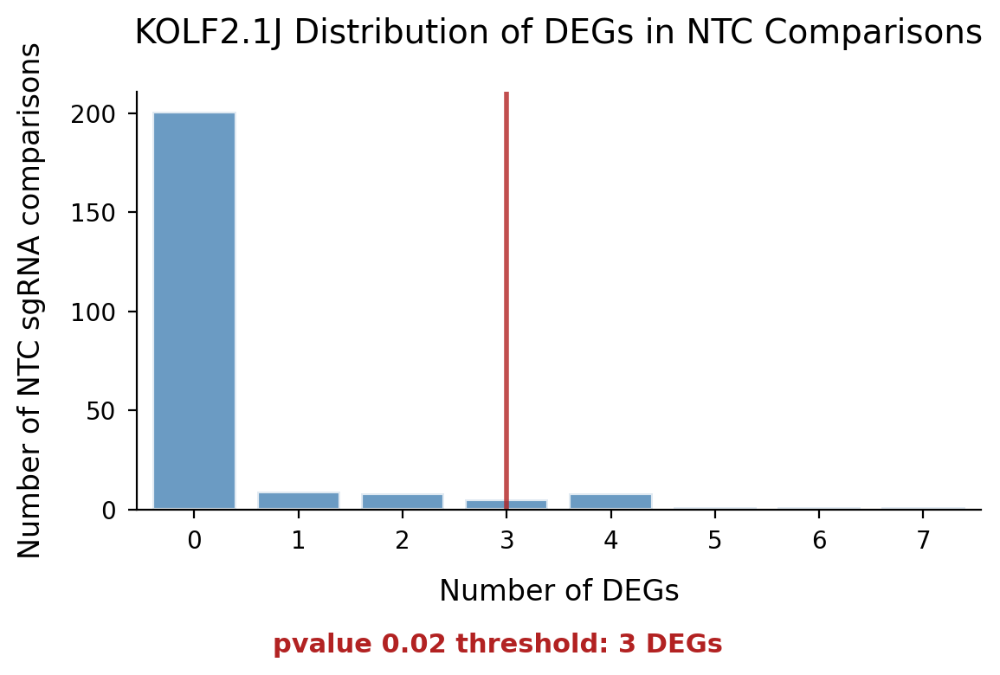

NTC Benchmark Statistics:
  • pvalue 0.02 threshold: 3 DEGs
  • NTC comparisons analyzed: 234
  • Mean DEGs per comparison: 0.4
  • Median DEGs per comparison: 0.0
  • 95% of comparisons have < 3 DEGs


In [11]:
deg_threshold, ntc_benchmark_res = \
    report_ntc_benchmarking_results(ntc_bench_matched_results_dict, alpha=0.02, 
                                    threshold_type="pvalue", percentile=95,
                                    title="KOLF2.1J Distribution of DEGs in NTC Comparisons")

In [29]:
ntc_benchmark_res.value_counts()

n_DEGs
0         201
1           9
2           8
4           8
3           5
5           1
6           1
7           1
Name: count, dtype: int64

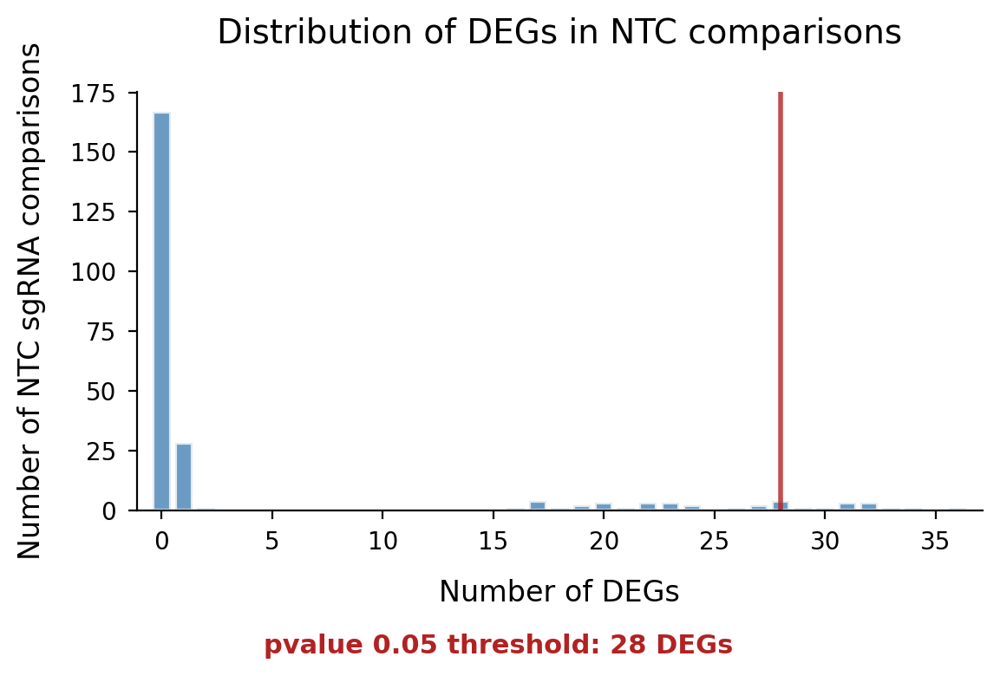

NTC Benchmark Statistics:
  • pvalue 0.05 threshold: 28 DEGs
  • NTC comparisons analyzed: 234
  • Mean DEGs per comparison: 4.2
  • Median DEGs per comparison: 0.0
  • 95% of comparisons have < 28 DEGs


In [37]:
deg_threshold, ntc_benchmark_res = \
    report_ntc_benchmarking_results(ntc_bench_matched_results_dict, alpha=0.05, 
                                    threshold_type="pvalue", percentile=95)

pval < 0.02 gives biologically reasonable number of DEGs for NTC gRNAs

Run 2

In [11]:
ntc_bench_matched_results_dict = \
    ntc_benchmarking_matched_DE(adata, n_cpus_for_DE=4, n_jobs_parallel=25, 
                                DE_fit_type="mean", min_cells_per_rep=25, random_state=12,
                                suppress_warnings=True)

Running DE analysis:   0%|          | 0/234 [00:00<?, ?it/s]

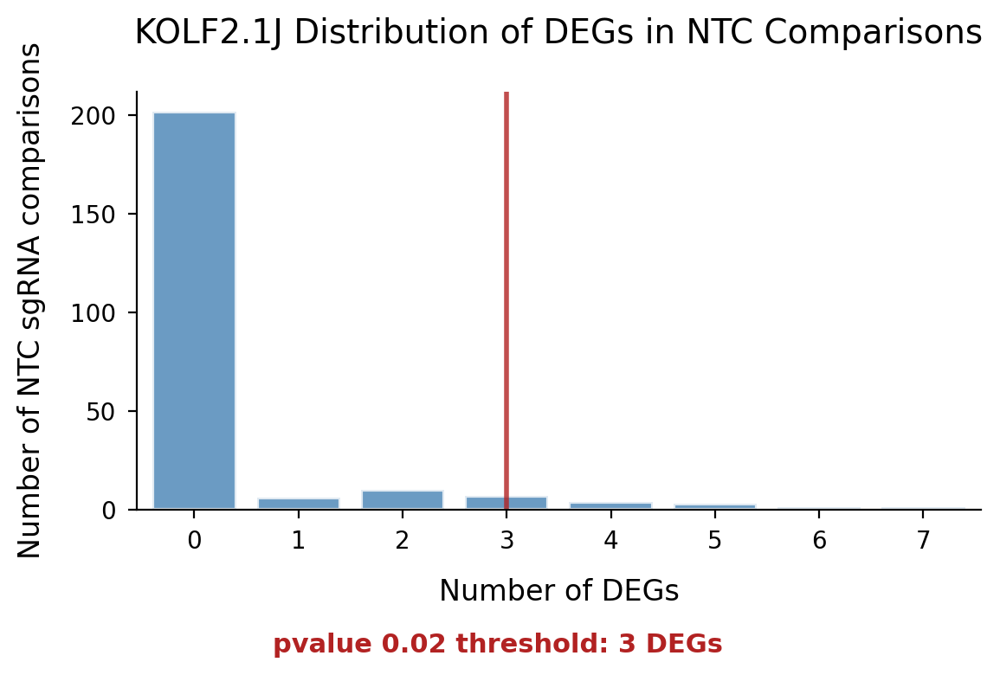

NTC Benchmark Statistics:
  • pvalue 0.02 threshold: 3 DEGs
  • NTC comparisons analyzed: 234
  • Mean DEGs per comparison: 0.4
  • Median DEGs per comparison: 0.0
  • 95% of comparisons have < 3 DEGs


In [12]:
deg_threshold, ntc_benchmark_res = \
    report_ntc_benchmarking_results(ntc_bench_matched_results_dict, alpha=0.02, 
                                    threshold_type="pvalue", percentile=95,
                                    title="KOLF2.1J Distribution of DEGs in NTC Comparisons")

NTC DEG threshold is 3 at pval < 0.02 for 2 different NTC benchmarking runs, so continue with this threshold

## DGE analysis on KD gRNAs

In [17]:
adata_kd = adata[adata.obs.perturbed == "True"]
print(f"{adata_kd.shape[0]} KD cells")
print(f"{adata_kd.obs.gRNA.nunique()} KD gRNAs")
print(f"{adata_kd.obs.gene_target.nunique()} KDs")
print()
print(f"Number of TF KD gRNAs: {adata_kd.obs.gRNA.nunique()}")
print(f"Mean KD cells per gRNA: {adata_kd.obs.gRNA.value_counts().mean():.0f}")
print(f"Median KD cells per gRNA: {adata_kd.obs.gRNA.value_counts().median():.0f}")

88249 KD cells
986 KD gRNAs
726 KDs

Number of TF KD gRNAs: 986
Mean KD cells per gRNA: 90
Median KD cells per gRNA: 85


In [18]:
print(f"KD gRNAs with < 50 cells: {sum(adata_kd.obs.gRNA.value_counts() < 50)}")
print(f"KD gRNAs with < 75 cells: {sum(adata_kd.obs.gRNA.value_counts() < 75)}")

KD gRNAs with < 50 cells: 90
KD gRNAs with < 75 cells: 359


In [ ]:
grna_de_results_dict = \
    matched_differential_expression(adata, DE_fit_type="mean", min_cells_per_rep=25,
                                    target_column="perturbation", random_state=42,
                                    suppress_warnings=True, n_cpus_for_DE=3, n_jobs_parallel=30)

Running DE analysis:   0%|          | 0/986 [00:00<?, ?it/s]

In [32]:
grna_de_results_df = build_DE_df(grna_de_results_dict)
grna_de_results_df.head()

,ESR2_2_baseMean,ESR2_2_log2FoldChange,ESR2_2_lfcSE,ESR2_2_stat,ESR2_2_pvalue,ESR2_2_padj,ZNF14_1_baseMean,ZNF14_1_log2FoldChange,ZNF14_1_lfcSE,ZNF14_1_stat,...,TBPL1_3_lfcSE,TBPL1_3_stat,TBPL1_3_pvalue,TBPL1_3_padj,NANOGP8_1_baseMean,NANOGP8_1_log2FoldChange,NANOGP8_1_lfcSE,NANOGP8_1_stat,NANOGP8_1_pvalue,NANOGP8_1_padj
A1BG,6.810465,0.656336,0.619966,1.058666,0.289752,0.999873,1.864257,0.735923,1.183907,0.621605,...,1.612909,0.135783,0.891993,0.999971,0.973660,-1.482654,2.306890,-0.642707,0.520414,0.999317
A1BG-AS1,1.007299,-1.206388,1.503619,-0.802323,0.422366,0.999873,0.373367,-2.185059,2.632794,-0.829939,...,3.155443,0.687875,0.491531,0.999971,0.747674,3.120077,4.493518,0.694351,0.487462,0.999317
A2M,1.445779,0.802093,1.204797,0.665750,0.505571,0.999873,0.512672,-1.215384,2.016206,-0.602808,...,2.114442,0.979440,0.327363,0.999971,0.216506,-1.276501,4.342349,-0.293965,0.768784,0.999317
A2ML1,3.125279,-0.356705,0.855024,-0.417188,0.676541,0.999873,0.891141,-0.921585,1.899375,-0.485204,...,2.299095,0.320029,0.748946,0.999971,0.786937,1.124863,2.939091,0.382725,0.701924,0.999317
A2ML1-AS1,12.835356,-0.274601,0.487399,-0.563401,0.573162,0.999873,2.926793,0.183335,1.204626,0.152192,...,1.604100,0.379544,0.704284,0.999971,2.687320,0.402065,1.489796,0.269879,0.787253,0.999317


In [ ]:
filepath_pkl = "/home/ranwyl/results_tf_project/KOLF_DE_results_gRNA_4-16-26.pkl"
grna_de_results_df.to_pickle(filepath_pkl)

Rename to "/home/ranwyl/results_tf_project/KOLF_DE_results_gRNA_seed42_4-16-26.pkl"

In [14]:
filepath_pkl = "/home/ranwyl/results_tf_project/KOLF_DE_results_gRNA_seed42_4-16-26.pkl"
grna_de_results_df_42 = pd.read_pickle(filepath_pkl)

In [38]:
grna_n_degs_df_42 = build_n_DEGs_df(grna_de_results_df_42, alpha=0.02, threshold_type="pvalue", 
                                    target_type="gRNA")
grna_n_degs_df_42.sort_values(by="n_DEGs", ascending=False).head(10)

,n_DEGs
ZNF521_1,81
POU5F1_1,49
POU5F1_2,49
NANOG_2,47
PHF20_1,33
POU5F1B_1,27
SETDB1_1,25
POU5F1_3,24
THAP12_2,17
REST_1,17


In [39]:
grna_n_degs_df_42[grna_n_degs_df_42.index == "SOX2_2"]

,n_DEGs
SOX2_2,0


In [12]:
grnas_pass_deg_threshold_42 = report_gRNA_DGE_results(grna_n_degs_df_42, ntc_deg_threshold=3, 
                                                      adata=adata, report_target_detected=False)

Performed gRNA-level DGE analysis on 986 KD gRNAs
Mean DEGs per gRNA: 3
Median DEGs per gRNA: 2
394 gRNAs (334 unique KDs) have >3 DEGs


Run 2: random seed 12

In [9]:
grna_de_results_dict12 = \
    matched_differential_expression(adata, DE_fit_type="mean", min_cells_per_rep=25,
                                    target_column="perturbation", random_state=12,
                                    suppress_warnings=True, n_cpus_for_DE=3, n_jobs_parallel=25)

Running DE analysis:   0%|          | 0/986 [00:00<?, ?it/s]

In [11]:
grna_de_results_df12 = build_DE_df(grna_de_results_dict12)
grna_de_results_df12.head()

,ESR2_2_baseMean,ESR2_2_log2FoldChange,ESR2_2_lfcSE,ESR2_2_stat,ESR2_2_pvalue,ESR2_2_padj,ZNF14_1_baseMean,ZNF14_1_log2FoldChange,ZNF14_1_lfcSE,ZNF14_1_stat,...,TBPL1_3_lfcSE,TBPL1_3_stat,TBPL1_3_pvalue,TBPL1_3_padj,NANOGP8_1_baseMean,NANOGP8_1_log2FoldChange,NANOGP8_1_lfcSE,NANOGP8_1_stat,NANOGP8_1_pvalue,NANOGP8_1_padj
A1BG,8.827933,-0.223843,0.584075,-0.383244,0.701539,0.999908,2.327471,0.305856,1.080366,0.283104,...,1.574648,-0.750419,0.453002,0.999948,0.793028,-1.021010,2.916328,-0.350101,0.726263,0.999671
A1BG-AS1,1.577599,-2.068533,1.473676,-1.403655,0.160421,0.999908,0.000000,NaN,NaN,NaN,...,2.351900,0.307446,0.758504,0.999948,0.995126,1.567385,2.394169,0.654668,0.512682,0.999671
A2M,1.490762,0.782110,1.412158,0.553840,0.579688,0.999908,0.136355,0.718657,3.356295,0.214122,...,1.871859,0.561043,0.574768,0.999948,0.000000,NaN,NaN,NaN,NaN,NaN
A2ML1,2.054211,0.968068,1.123733,0.861475,0.388976,0.999908,0.671771,-0.250015,1.884473,-0.132671,...,2.198688,-0.130553,0.896129,0.999948,0.942133,0.110660,2.318448,0.047730,0.961931,0.999671
A2ML1-AS1,11.055255,0.119223,0.507973,0.234703,0.814439,0.999908,3.389719,-0.113790,0.845931,-0.134515,...,1.532225,0.773411,0.439279,0.999948,2.570247,0.621378,1.905124,0.326161,0.744302,0.999671


In [12]:
filepath_pkl = "/home/ranwyl/results_tf_project/KOLF_DE_results_gRNA_seed12_5-12-26.pkl"
grna_de_results_df12.to_pickle(filepath_pkl)

In [9]:
filepath_pkl = "/home/ranwyl/results_tf_project/KOLF_DE_results_gRNA_seed12_5-12-26.pkl"
grna_de_results_df_12 = pd.read_pickle(filepath_pkl)

In [14]:
grna_n_degs_df_12 = build_n_DEGs_df(grna_de_results_df_12, alpha=0.02, threshold_type="pvalue", 
                                    target_type="gRNA")
grna_n_degs_df_12.sort_values(by="n_DEGs", ascending=False).head(10)

,n_DEGs
ZNF521_1,99
POU5F1_1,63
NANOG_2,50
POU5F1_3,36
SETDB1_1,29
PHF20_1,29
POU5F1B_1,27
THAP12_3,25
POU3F2_2,21
HNF1A_1,19


In [15]:
grnas_pass_deg_threshold_12 = report_gRNA_DGE_results(grna_n_degs_df_12, ntc_deg_threshold=3, 
                                                      adata=adata, report_target_detected=False)

Performed gRNA-level DGE analysis on 986 KD gRNAs
Mean DEGs per gRNA: 4
Median DEGs per gRNA: 3
427 gRNAs (363 unique KDs) have >3 DEGs


Run 3

In [25]:
grna_de_results_dict123 = \
    matched_differential_expression(adata, DE_fit_type="mean", min_cells_per_rep=25,
                                    target_column="perturbation", random_state=123,
                                    suppress_warnings=True, n_cpus_for_DE=3, n_jobs_parallel=25)

Running DE analysis:   0%|          | 0/986 [00:00<?, ?it/s]

In [26]:
grna_de_results_df123 = build_DE_df(grna_de_results_dict123)
grna_de_results_df123.head()

,ESR2_2_baseMean,ESR2_2_log2FoldChange,ESR2_2_lfcSE,ESR2_2_stat,ESR2_2_pvalue,ESR2_2_padj,ZNF14_1_baseMean,ZNF14_1_log2FoldChange,ZNF14_1_lfcSE,ZNF14_1_stat,...,TBPL1_3_lfcSE,TBPL1_3_stat,TBPL1_3_pvalue,TBPL1_3_padj,NANOGP8_1_baseMean,NANOGP8_1_log2FoldChange,NANOGP8_1_lfcSE,NANOGP8_1_stat,NANOGP8_1_pvalue,NANOGP8_1_padj
A1BG,8.379580,-0.075234,0.565071,-0.133141,0.894082,0.999879,2.797311,-0.006543,0.915994,-0.007143,...,1.356675,0.223885,0.822847,0.99988,0.827438,-3.210897,3.534864,-0.908351,0.363693,0.999899
A1BG-AS1,0.472580,0.649252,1.888388,0.343813,0.730987,0.999879,0.157732,-1.136023,3.322592,-0.341909,...,2.563435,0.328274,0.742704,0.99988,0.953131,1.663246,2.758970,0.602850,0.546608,0.999899
A2M,1.110916,2.260785,1.843482,1.226367,0.220061,0.999879,0.178306,-1.136023,3.322592,-0.341909,...,2.911160,1.225184,0.220506,0.99988,0.287753,-1.510045,3.647259,-0.414022,0.678858,0.999899
A2ML1,2.416677,0.334455,1.075690,0.310921,0.755860,0.999879,1.202816,-1.510907,1.576008,-0.958693,...,1.781300,-0.443830,0.657166,0.99988,0.500000,2.476933,3.550393,0.697650,0.485396,0.999899
A2ML1-AS1,9.336364,0.695321,0.608209,1.143228,0.252944,0.999879,3.442540,-0.315215,0.869415,-0.362560,...,1.400206,0.676375,0.498803,0.99988,1.990884,1.614212,2.007723,0.804002,0.421396,0.999899


In [27]:
filepath_pkl = "/home/ranwyl/results_tf_project/KOLF_DE_results_gRNA_seed123_5-12-26.pkl"
grna_de_results_df123.to_pickle(filepath_pkl)

In [10]:
filepath_pkl = "/home/ranwyl/results_tf_project/KOLF_DE_results_gRNA_seed123_5-12-26.pkl"
grna_de_results_df_123 = pd.read_pickle(filepath_pkl)

In [17]:
grna_n_degs_df_123 = build_n_DEGs_df(grna_de_results_df_123, alpha=0.02, threshold_type="pvalue", 
                                     target_type="gRNA")
grna_n_degs_df_123.sort_values(by="n_DEGs", ascending=False).head(10)

,n_DEGs
ZNF521_1,101
POU5F1_2,54
NANOG_2,50
POU5F1_3,47
PHF20_1,32
SETDB1_1,29
POU5F1B_1,24
POU5F1_1,23
ADNP2_1,22
REST_1,21


In [18]:
grnas_pass_deg_threshold_123 = report_gRNA_DGE_results(grna_n_degs_df_123, ntc_deg_threshold=3, 
                                                       adata=adata, report_target_detected=False)

Performed gRNA-level DGE analysis on 986 KD gRNAs
Mean DEGs per gRNA: 3
Median DEGs per gRNA: 3
379 gRNAs (321 unique KDs) have >3 DEGs


In [19]:
grnas_pass_dge = report_3_run_gRNA_DGE_results(grna_n_degs_df_42, grna_n_degs_df_12, 
                                               grna_n_degs_df_123, 
                                               ntc_deg_threshold=3, adata=adata, 
                                               report_target_detected=False)

Performed DGE analysis on 986 gRNAs (corresponding to 726 unique KDs)
414 KD gRNAs (349 unique KDs) have >3 DEGs (pass NTC DEG threshold) in at least 2 of 3 DGE runs

Out of 986 total gRNAs:
215 gRNAs pass in exactly 3 runs
199 gRNAs pass in exactly 2 runs
157 gRNAs pass in exactly 1 run
415 gRNAs do not pass in any of 3 runs


In [15]:
de_results_dfs = [grna_de_results_df_42, grna_de_results_df_12, grna_de_results_df_123]

In [18]:
grnas_pass_dge_consistent = \
    report_3_run_gRNA_DGE_results_consistent_DEGs(de_results_dfs,
                                                  ntc_DEG_threshold=3,
                                                  p_threshold=0.02,
                                                  p_threshold_type="pvalue",
                                                  report_target_detected=False)

Performed DGE analysis on 986 gRNAs (corresponding to 726 unique KDs)
46 KD gRNAs (36 unique KDs) have >3 DEGs (pass NTC DEG threshold) consistent across at least 2 of 3 DGE runs


In [20]:
grna_mean_n_degs_df = build_mean_n_DEGs_df(grna_n_degs_df_42, grna_n_degs_df_12, grna_n_degs_df_123)
grna_mean_n_degs_df.sort_values(by="n_DEGs", ascending=False).head(20)

,n_DEGs
ZNF521_1,93
NANOG_2,49
POU5F1_1,45
POU5F1_2,40
POU5F1_3,35
PHF20_1,31
SETDB1_1,27
POU5F1B_1,26
POU3F2_2,17
THAP12_3,17


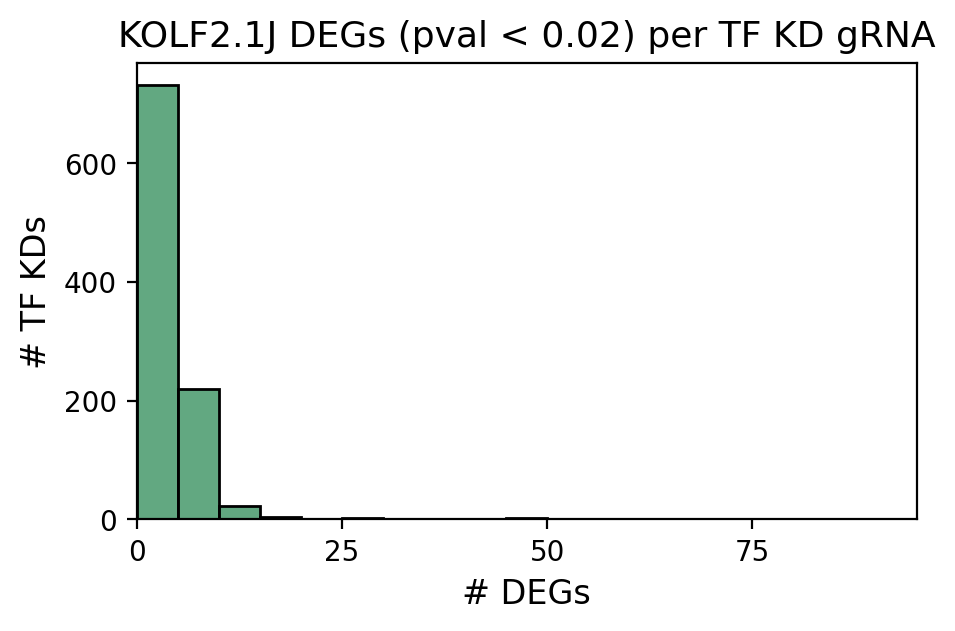

In [21]:
_ = plot_DEGs_per_KD_histogram(grna_mean_n_degs_df, title="KOLF2.1J DEGs (pval < 0.02) per TF KD gRNA", 
                               bin_width=5, xtick_width=25, fig_size=(5,3),
                               xlabel="# DEGs", ylabel="# TF KDs", color="seagreen")

Filter gRNAs

In [22]:
adata_gRNA_filtered = adata[(adata.obs.gRNA.isin(grnas_pass_dge)) |
                            (adata.obs.perturbed == "False")].copy()
adata_gRNA_filtered

AnnData object with n_obs × n_vars = 60132 × 16115
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'perturbation', 'gene_target_ensembl_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'perturbation_edist', 'perturbation_pvalue', 'perturbation_significant'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'etest_results', 'etest_results_params'
    layers: 'counts'

In [23]:
filepath = "/home/ranwyl/data_tf_project/KOLF_Pan_Genome_Alpha_CPMnorm_KD_ETest_Gene_gRNA_Filtered.h5ad"
adata_gRNA_filtered.write_h5ad(filepath)

# Examine final dataset

In [6]:
import anndata as ad
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def plot_cells_per_kd_histogram(adata: ad.AnnData, 
                                obs_key: str="gRNA", 
                                title: str="",
                                fig_size: tuple=(4,3), 
                                bin_width: int=25, 
                                xtick_width: int=50,
                                ymax: int | None = None,
                                color: str | None = None):
    if obs_key not in {"gRNA", "gene_target"}:
        raise ValueError("obs_key must be 'gRNA' or 'gene_target'")
    plt.figure(figsize=fig_size)
    adata_xmax = max(adata.obs[obs_key].value_counts().values)
    xmax = ((adata_xmax // bin_width) + 1) * bin_width
    if color:
        sns.histplot(adata.obs[obs_key].value_counts().values, 
                     binwidth=bin_width, binrange=(0,xmax), 
                     edgecolor="black", color=color)
    else:
        sns.histplot(adata.obs[obs_key].value_counts().values, 
                     binwidth=bin_width, binrange=(0,xmax), 
                     edgecolor="black")
    plt.xlim(0, xmax)
    if ymax:
        plt.ylim(0, ymax)
    plt.xticks(np.arange(0, xmax, xtick_width), fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlabel("# cells")
    if obs_key == "gRNA":
        plt.ylabel("# gRNAs", fontsize=13)
    else:
        plt.ylabel("# KDs", fontsize=13)
    plt.grid(False)
    plt.title(title)

In [7]:
filepath = "/home/ranwyl/data_tf_project/KOLF_Pan_Genome_Alpha_CPMnorm_KD_ETest_Gene_gRNA_Filtered.h5ad"
adata = psp.utils.read_anndata(filepath)
adata

AnnData object with n_obs × n_vars = 60132 × 16115
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'perturbation', 'gene_target_ensembl_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'perturbation_edist', 'perturbation_pvalue', 'perturbation_significant'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'etest_results', 'etest_results_params'
    layers: 'counts'

In [8]:
adata_kd = adata[adata.obs.perturbed == "True"]
print(f"{adata[adata.obs.perturbed == 'False'].shape[0]} NTC cells")
print(f"{adata_kd.shape[0]} TF KD cells")
print(f"{adata_kd.obs.gRNA.nunique()} TF KD gRNAs")
print(f"{adata_kd.obs.gene_target.nunique()} TF KDs")
print(f"Mean cells per TF KD: {adata_kd.obs.gene_target.value_counts().mean():.0f}")
print(f"Median cells per TF KD: {adata_kd.obs.gene_target.value_counts().median():.0f}")

13674 NTC cells
46458 TF KD cells
414 TF KD gRNAs
349 TF KDs
Mean cells per TF KD: 133
Median cells per TF KD: 109


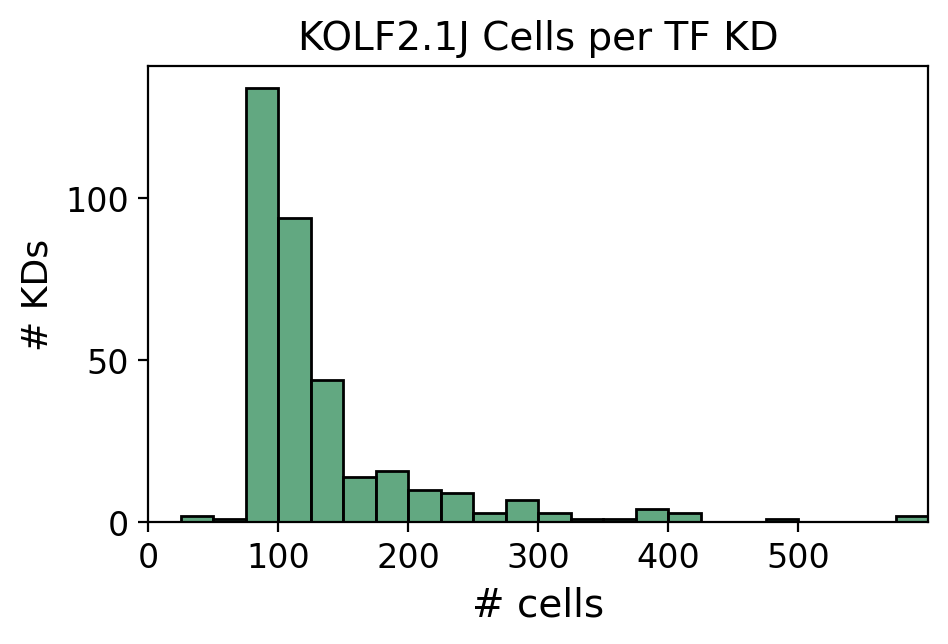

In [6]:
plot_cells_per_kd_histogram(adata[adata.obs.perturbed == "True"], 
                            "gene_target", "KOLF2.1J Cells per TF KD", 
                            xtick_width=100, color="seagreen", fig_size=(5,3))

In [8]:
adata.obs.n_UMI_counts.median()

5252.0

# Gene target-level DGE analysis

In [6]:
filepath = "/home/ranwyl/data_tf_project/KOLF_Pan_Genome_Alpha_CPMnorm_KD_ETest_Gene_gRNA_Filtered.h5ad"
adata = psp.utils.read_anndata(filepath)
adata

AnnData object with n_obs × n_vars = 60132 × 16115
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'perturbation', 'gene_target_ensembl_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'perturbation_edist', 'perturbation_pvalue', 'perturbation_significant'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'etest_results', 'etest_results_params'
    layers: 'counts'

Run 1: random seed 42

In [10]:
kd_de_results_dict_42 = \
    matched_differential_expression(adata, 
                                    DE_fit_type="mean", 
                                    target_column="gene_target", 
                                    lfc_shrink=True, 
                                    lfc_shrink_adapt=False, 
                                    min_cells_per_rep=25,
                                    suppress_warnings=False, 
                                    n_cpus_for_DE=3, 
                                    n_jobs_parallel=25,
                                    random_state=42)

Running DE analysis:   0%|          | 0/349 [00:00<?, ?it/s]

/home/ranwyl/psp_env/lib64/python3.11/site-packages/pydeseq2/dds.py:497: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
/home/ranwyl/psp_env/lib64/python3.11/site-packages/pydeseq2/dds.py:497: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
/home/ranwyl/psp_env/lib64/python3.11/site-packages/pydeseq2/dds.py:497: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()


In [11]:
kd_de_results_df_42 = build_DE_df(kd_de_results_dict_42)
kd_de_results_df_42.head()

,ESR2_baseMean,ESR2_log2FoldChange,ESR2_lfcSE,ESR2_stat,ESR2_pvalue,ESR2_padj,ZNF14_baseMean,ZNF14_log2FoldChange,ZNF14_lfcSE,ZNF14_stat,...,SMAD3_lfcSE,SMAD3_stat,SMAD3_pvalue,SMAD3_padj,ZNF382_baseMean,ZNF382_log2FoldChange,ZNF382_lfcSE,ZNF382_stat,ZNF382_pvalue,ZNF382_padj
A1BG,6.810465,0.494698,0.586164,1.058666,0.289752,0.999873,1.864257,0.326745,0.963938,0.621605,...,0.965429,0.529086,0.596745,0.998585,3.414072,0.340243,0.790988,0.654506,0.512786,0.99499
A1BG-AS1,1.007299,-0.410480,1.054954,-0.802323,0.422366,0.999873,0.373367,-0.507322,1.303229,-0.829939,...,1.300716,-0.804238,0.421259,0.998585,0.332644,-0.263955,1.150663,-0.562569,0.573728,0.99499
A2M,1.445779,0.351201,0.975310,0.665750,0.505571,0.999873,0.512672,-0.283313,1.178650,-0.602808,...,1.300716,-0.804238,0.421259,0.998585,0.319350,0.444568,1.667701,0.676933,0.498449,0.99499
A2ML1,3.125279,-0.210730,0.739053,-0.417188,0.676541,0.999873,0.891141,-0.208276,1.136526,-0.485204,...,1.040482,0.752123,0.451977,0.998585,1.279918,-0.287992,1.025095,-0.581470,0.560924,0.99499
A2ML1-AS1,12.835356,-0.223817,0.463001,-0.563401,0.573162,0.999873,2.926793,0.078209,0.935879,0.152192,...,0.853829,0.284118,0.776320,0.998585,2.756951,0.041142,0.791882,0.079071,0.936976,0.99499


In [68]:
filepath_pkl = "/home/ranwyl/results_tf_project/KOLF_DE_results_KD_shrunk_seed42_5-14-26.pkl"
kd_de_results_df_42.to_pickle(filepath_pkl)

In [13]:
kd_n_degs_df_42 = build_n_DEGs_df(kd_de_results_df_42, alpha=0.02, threshold_type="pvalue", 
                                    target_type="gene_target")
kd_n_degs_df_42.sort_values(by="n_DEGs", ascending=False).head(10)

,n_DEGs
POU5F1,429
DNMT1,127
ZNF521,81
ZNF396,64
THAP12,62
ADNP2,53
NANOG,47
CHAMP1,46
ZNF787,39
FOXH1,34


Run 2: random seed 12

In [10]:
kd_de_results_dict_12 = \
    matched_differential_expression(adata, 
                                    DE_fit_type="mean", 
                                    target_column="gene_target", 
                                    lfc_shrink=True, 
                                    lfc_shrink_adapt=False, 
                                    min_cells_per_rep=25,
                                    suppress_warnings=False, 
                                    n_cpus_for_DE=3, 
                                    n_jobs_parallel=25,
                                    random_state=12)

Running DE analysis:   0%|          | 0/349 [00:00<?, ?it/s]

/home/ranwyl/psp_env/lib64/python3.11/site-packages/pydeseq2/dds.py:497: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
/home/ranwyl/psp_env/lib64/python3.11/site-packages/pydeseq2/dds.py:497: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
/home/ranwyl/psp_env/lib64/python3.11/site-packages/pydeseq2/dds.py:497: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()


In [11]:
kd_de_results_df_12 = build_DE_df(kd_de_results_dict_12)
kd_de_results_df_12.head()

,ESR2_baseMean,ESR2_log2FoldChange,ESR2_lfcSE,ESR2_stat,ESR2_pvalue,ESR2_padj,ZNF14_baseMean,ZNF14_log2FoldChange,ZNF14_lfcSE,ZNF14_stat,...,SMAD3_lfcSE,SMAD3_stat,SMAD3_pvalue,SMAD3_padj,ZNF382_baseMean,ZNF382_log2FoldChange,ZNF382_lfcSE,ZNF382_stat,ZNF382_pvalue,ZNF382_padj
A1BG,8.827933,-0.168335,0.542640,-0.383244,0.701539,0.999908,2.327471,0.146430,0.881921,0.283104,...,0.839127,0.125305,0.900282,0.995395,2.874228,0.566975,1.009811,1.030593,0.302732,0.999327
A1BG-AS1,1.577599,-0.844286,1.160084,-1.403655,0.160421,0.999908,0.000000,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN
A2M,1.490762,0.275676,1.074630,0.553840,0.579688,0.999908,0.136355,0.183549,1.779654,0.214122,...,NaN,NaN,NaN,NaN,0.316139,0.414821,1.700314,0.647005,0.517629,0.999327
A2ML1,2.054211,0.468470,0.950316,0.861475,0.388976,0.999908,0.671771,-0.056901,1.153654,-0.132671,...,1.353390,0.902950,0.366552,0.995395,1.165318,-0.159703,1.038234,-0.336362,0.736598,0.999327
A2ML1-AS1,11.055255,0.096369,0.480852,0.234703,0.814439,0.999908,3.389719,-0.066607,0.732780,-0.134515,...,0.727741,0.046823,0.962654,0.995395,2.401238,0.192637,0.950069,0.376367,0.706644,0.999327


In [70]:
filepath_pkl = "/home/ranwyl/results_tf_project/KOLF_DE_results_KD_shrunk_seed12_5-14-26.pkl"
kd_de_results_df_12.to_pickle(filepath_pkl)

In [14]:
kd_n_degs_df_12 = build_n_DEGs_df(kd_de_results_df_12, alpha=0.02, threshold_type="pvalue", 
                                    target_type="gene_target")
kd_n_degs_df_12.sort_values(by="n_DEGs", ascending=False).head(10)

,n_DEGs
POU5F1,473
DNMT1,145
ZNF521,99
THAP12,73
ADNP2,55
NANOG,50
ZNF396,49
CHAMP1,45
ZFP41,40
ZFP37,39


Run 3

In [15]:
kd_de_results_dict_123 = \
    matched_differential_expression(adata, 
                                    DE_fit_type="mean", 
                                    target_column="gene_target", 
                                    lfc_shrink=True, 
                                    lfc_shrink_adapt=False, 
                                    min_cells_per_rep=25,
                                    suppress_warnings=False, 
                                    n_cpus_for_DE=3, 
                                    n_jobs_parallel=25,
                                    random_state=123)

Running DE analysis:   0%|          | 0/349 [00:00<?, ?it/s]

/home/ranwyl/psp_env/lib64/python3.11/site-packages/pydeseq2/dds.py:497: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
/home/ranwyl/psp_env/lib64/python3.11/site-packages/pydeseq2/dds.py:497: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
/home/ranwyl/psp_env/lib64/python3.11/site-packages/pydeseq2/dds.py:497: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()


In [16]:
kd_de_results_df_123 = build_DE_df(kd_de_results_dict_123)
kd_de_results_df_123.head()

,ESR2_baseMean,ESR2_log2FoldChange,ESR2_lfcSE,ESR2_stat,ESR2_pvalue,ESR2_padj,ZNF14_baseMean,ZNF14_log2FoldChange,ZNF14_lfcSE,ZNF14_stat,...,SMAD3_lfcSE,SMAD3_stat,SMAD3_pvalue,SMAD3_padj,ZNF382_baseMean,ZNF382_log2FoldChange,ZNF382_lfcSE,ZNF382_stat,ZNF382_pvalue,ZNF382_padj
A1BG,8.379580,-0.056736,0.527665,-0.133141,0.894082,0.999879,2.797311,-0.002700,0.778238,-0.007143,...,0.821035,-0.497113,0.619109,0.999808,3.060696,0.565221,0.840121,1.036579,0.299932,0.999947
A1BG-AS1,0.472580,0.171823,1.212871,0.343813,0.730987,0.999879,0.157732,-0.218693,1.209318,-0.341909,...,1.195150,-0.299664,0.764433,0.999808,0.000000,NaN,NaN,NaN,NaN,NaN
A2M,1.110916,0.698451,1.391408,1.226367,0.220061,0.999879,0.178306,-0.225093,1.213546,-0.341909,...,1.198691,-0.299664,0.764433,0.999808,0.846496,-0.215489,1.074994,-0.460405,0.645225,0.999947
A2ML1,2.416677,0.160455,0.882119,0.310921,0.755860,0.999879,1.202816,-0.492766,1.092286,-0.958693,...,1.007704,0.295401,0.767688,0.999808,0.782531,0.085895,1.169963,0.196736,0.844034,0.999947
A2ML1-AS1,9.336364,0.530849,0.577954,1.143228,0.252944,0.999879,3.442540,-0.182954,0.747263,-0.362560,...,0.720818,-0.083402,0.933532,0.999808,2.250243,0.317678,0.968079,0.609462,0.542218,0.999947


In [72]:
filepath_pkl = "/home/ranwyl/results_tf_project/KOLF_DE_results_KD_shrunk_seed123_5-14-26.pkl"
kd_de_results_df_123.to_pickle(filepath_pkl)

In [15]:
kd_n_degs_df_123 = build_n_DEGs_df(kd_de_results_df_123, alpha=0.02, threshold_type="pvalue", 
                                    target_type="gene_target")
kd_n_degs_df_123.sort_values(by="n_DEGs", ascending=False).head(10)

,n_DEGs
POU5F1,478
DNMT1,133
ZNF521,101
THAP12,70
ZNF396,52
NANOG,50
ADNP2,48
FOXH1,42
CHAMP1,40
ZNF787,35


All runs:

In [7]:
filepath_pkl = "/home/ranwyl/results_tf_project/KOLF_DE_results_KD_shrunk_seed42_5-14-26.pkl"
kd_de_results_df_42 = pd.read_pickle(filepath_pkl)
filepath_pkl = "/home/ranwyl/results_tf_project/KOLF_DE_results_KD_shrunk_seed12_5-14-26.pkl"
kd_de_results_df_12 = pd.read_pickle(filepath_pkl)
filepath_pkl = "/home/ranwyl/results_tf_project/KOLF_DE_results_KD_shrunk_seed123_5-14-26.pkl"
kd_de_results_df_123 = pd.read_pickle(filepath_pkl)
de_results_dfs = [kd_de_results_df_42, kd_de_results_df_12, kd_de_results_df_123]

In [74]:
kds_pass_ntc, kds_strong = \
    report_3_run_KD_DGE_results_consistent_DEGs(de_results_dfs,
                                                ntc_threshold=3,
                                                strong_kd_threshold=10,
                                                p_threshold=0.02,
                                                p_threshold_type="pvalue",
                                                report_target_detected=False,
                                                remove_self_DEGs=False)

45 out of 349 KDs have >3 consistent DEGs (pass NTC DEG threshold) in at least 2 of 3 DGE runs
17 out of 349 KDs are consistent strong KDs (have ≥10 consistent DEGs) in at least 2 of 3 DGE runs


In [70]:
print(', '.join(kds_strong))

PHF20, ADNP2, POU3F2, DNMT1, NANOG, POU5F1, ZNF521, FOXH1, ZNF787, ZNF396, POU5F1B, SETDB1, FOXD3, ZNF462, THAP12, CHAMP1


In [75]:
kd_deg_dict = build_3_run_DEGs_dict(de_results_dfs, p_threshold=0.02,
                                    target_type="gene_target", remove_self_DEGs=False)

In [76]:
kd_n_degs_df = build_3_run_n_DEGs_df(kd_deg_dict)
kd_n_degs_df.head(25)

,n_DEGs
POU5F1,418
DNMT1,122
ZNF521,81
THAP12,43
NANOG,41
ZNF396,41
ADNP2,31
PHF20,29
CHAMP1,24
POU5F1B,23


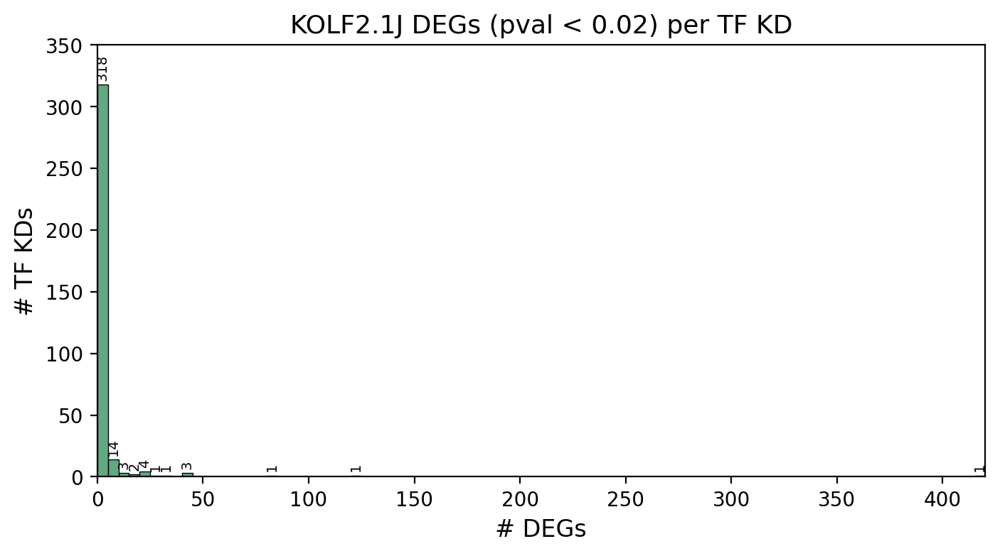

In [77]:
_ = plot_DEGs_per_KD_histogram(kd_n_degs_df, 
                               title="KOLF2.1J DEGs (pval < 0.02) per TF KD", 
                               bin_width=5, xtick_width=50, fig_size=(8,4), ymax=350,
                               xlabel="# DEGs", ylabel="# TF KDs", color="seagreen",
                               show_bar_labels=True, bar_label_fontsize=7)

In [78]:
print(f"Mean DEGs per KD: {round(kd_n_degs_df['n_DEGs'].mean())}")
print(f"Median DEGs per KD: {round(kd_n_degs_df['n_DEGs'].median())}")

Mean DEGs per KD: 4
Median DEGs per KD: 1


### Format gene names in DGE results

In [41]:
import pandas as pd
from biothings_client import get_client

Check that all TFs are official gene symbols

In [42]:
tf_kds = {col.split("_")[0] for col in kd_de_results_df_42.columns}
tf_kds = sorted(list(tf_kds))
mygene = get_client('gene')
test_mygene_results = mygene.querymany(tf_kds, scopes="symbol", field="symbol,entrezgene",
                                species="human", as_dataframe=True)
test_mygene_results.head()

Input sequence provided is already in string format. No operation performed


,_id,_score,entrezgene,symbol
query,,,,
ADNP2,22850,18.186907,22850,ADNP2
ARHGAP35,2909,18.298677,2909,ARHGAP35
ARID2,196528,17.550182,196528,ARID2
ARID3B,10620,17.996517,10620,ARID3B
ARNT2,9915,17.541527,9915,ARNT2


In [43]:
def check_tf_kd_gene_symbols(DE_results: pd.DataFrame) -> None | pd.DataFrame:
    """
    Check that all TF KDs in DGE results are listed by official gene symbol.
    Return DF of MyGene results for any TFs with no official gene symbol,
    no Entrez ID, or where name doesn't match official gene symbol.
    """
    # Get TF KDs
    tf_kds = {col.split("_")[0] for col in DE_results.columns}
    tf_kds = sorted(list(tf_kds))
    # MyGene search
    mygene = get_client('gene')
    mygene_df = mygene.querymany(tf_kds, scopes="symbol", field="symbol,entrezgene", 
                                 species="human", as_dataframe=True)
    # Filter for TFs with no official gene symbol, no Entrez ID, 
    #   or where name doesn't match official symbol
    mygene_df = mygene_df[(mygene_df["symbol"].isna()) | 
                          (mygene_df["entrezgene"].isna()) |
                          (mygene_df.index != mygene_df["symbol"])]
    if mygene_df.empty:
        print("All TF KDs are listed by official gene symbol and have Entrez ID")
        return
    else:
        return mygene_df

In [44]:
check_tf_kd_gene_symbols(kd_de_results_df_42)

Input sequence provided is already in string format. No operation performed


All TF KDs are listed by official gene symbol and have Entrez ID


Rename genes in DGE results from Ensembl ID to UPCASE gene name

In [ ]:
from biothings_client import get_client

def rename_ensembl_genes(DE_results_df: pd.DataFrame):
    """
    Rename genes in DGE results DataFrame.
    """
    ensembl_to_gene = dict()
    mg = get_client('gene')
    ensg_genes = [gene for gene in DE_results_df.index if gene.startswith("ENSG")]
    mygene_ensembl_results = mg.querymany(ensg_genes, fields='symbol', species='human')
    for gene in mygene_ensembl_results:
        if gene.get("symbol"):
            ensembl_to_gene[gene.get("query")] = gene.get("symbol")
    DE_results_df_renamed = DE_results_df.rename(index=ensembl_to_gene)
    print(f"Converted {len(ensembl_to_gene)} Ensembl IDs to gene symbols")
    return DE_results_df_renamed

Rename genes

In [74]:
kd_de_results_df_42_renamed = rename_ensembl_genes(kd_de_results_df_42)
filepath42 = "/home/ranwyl/results_tf_project/KOLF_DE_results_KD_shrunk_seed42_5-14-26_renamed.pkl"
kd_de_results_df_42_renamed.to_pickle(filepath42)

Input sequence provided is already in string format. No operation performed
5 input query terms found dup hits:	[('ENSG00000226506', 2), ('ENSG00000228566', 2), ('ENSG00000234162', 2), ('ENSG00000234352', 2), ('E
107 input query terms found no hit:	['ENSG00000214955', 'ENSG00000225489', 'ENSG00000226849', 'ENSG00000228434', 'ENSG00000228648', 'ENS


Converted 327 Ensembl IDs to gene symbols


In [75]:
kd_de_results_df_12_renamed = rename_ensembl_genes(kd_de_results_df_12)
filepath12 = "/home/ranwyl/results_tf_project/KOLF_DE_results_KD_shrunk_seed12_5-14-26_renamed.pkl"
kd_de_results_df_12_renamed.to_pickle(filepath12)

Input sequence provided is already in string format. No operation performed
5 input query terms found dup hits:	[('ENSG00000226506', 2), ('ENSG00000228566', 2), ('ENSG00000234162', 2), ('ENSG00000234352', 2), ('E
107 input query terms found no hit:	['ENSG00000214955', 'ENSG00000225489', 'ENSG00000226849', 'ENSG00000228434', 'ENSG00000228648', 'ENS


Converted 327 Ensembl IDs to gene symbols


In [76]:
kd_de_results_df_123_renamed = rename_ensembl_genes(kd_de_results_df_123)
filepath123 = "/home/ranwyl/results_tf_project/KOLF_DE_results_KD_shrunk_seed123_5-14-26_renamed.pkl"
kd_de_results_df_123_renamed.to_pickle(filepath123)

Input sequence provided is already in string format. No operation performed
5 input query terms found dup hits:	[('ENSG00000226506', 2), ('ENSG00000228566', 2), ('ENSG00000234162', 2), ('ENSG00000234352', 2), ('E
107 input query terms found no hit:	['ENSG00000214955', 'ENSG00000225489', 'ENSG00000226849', 'ENSG00000228434', 'ENSG00000228648', 'ENS


Converted 327 Ensembl IDs to gene symbols


In [58]:
filepath_pkl = "/home/ranwyl/results_tf_project/KOLF_DE_results_KD_shrunk_seed42_5-14-26_renamed.pkl"
kd_de_results_df_42 = pd.read_pickle(filepath_pkl)
filepath_pkl = "/home/ranwyl/results_tf_project/KOLF_DE_results_KD_shrunk_seed12_5-14-26_renamed.pkl"
kd_de_results_df_12 = pd.read_pickle(filepath_pkl)
filepath_pkl = "/home/ranwyl/results_tf_project/KOLF_DE_results_KD_shrunk_seed123_5-14-26_renamed.pkl"
kd_de_results_df_123 = pd.read_pickle(filepath_pkl)
de_results_dfs = [kd_de_results_df_42, kd_de_results_df_12, kd_de_results_df_123]

In [79]:
kd_deg_dict = build_3_run_DEGs_dict(de_results_dfs, p_threshold=0.02,
                                    target_type="gene_target", remove_self_DEGs=False)

In [80]:
kd_deg_df = build_3_run_DEGs_df(kd_deg_dict, kd_col="TF KD")
kd_deg_df.head()

,TF KD,n_DEGs,DEGs
0,POU5F1,418,"PALLD, RHOB, NAV3, DANCR, HS3ST5, SOX11, RPL22..."
1,DNMT1,122,"ENSG00000227681, MARCHF1, NCALD, ENSG000002547..."
2,ZNF521,81,"PALLD, MAP2, GPC3, DNMT3B, SIX3, GRID2, ADAMTS..."
3,THAP12,43,"MIR34AHG, FAM133B, GOT2, ANKRD46, CSNK2A2, MT-..."
4,NANOG,41,"MAP2, ENSG00000289308, GPC3, FOXO3, MT1X, GRID..."


In [81]:
filepath = "/home/ranwyl/output_files_tf_project/KOLF_TF_KD_DEGs_6-24-26.csv"
kd_deg_df.to_csv(filepath)

In [82]:
kd_deg_dict_direction = build_3_run_DEGs_dict(
    de_results_dfs, p_threshold=0.02, target_type="gene_target", report_direction=True,
    remove_self_DEGs=False)

In [83]:
kd_deg_df_direction = build_3_run_DEGs_df(kd_deg_dict_direction, kd_col="TF KD")
kd_deg_df_direction.head()

,TF KD,n_total_DEGs,n_up_DEGs,n_down_DEGs,up_DEGs,down_DEGs
0,POU5F1,418,299,119,"PALLD, RHOB, NAV3, SOX11, NEDD4L, RMST, TALAM1...","EBPL, DANCR, DNMT3B, HS3ST5, RPL22L1, FOXO1, C..."
1,DNMT1,122,119,3,"NCALD, ENSG00000226965, ARRB1, CHODL, ROBO2, E...","DNMT1, ADCY2, SMOC2"
2,ZNF521,81,70,11,"PALLD, MAP2, GPC3, SIX3, ADAMTS6, PKDCC, SVIL,...","GABRB3, DNMT3B, MGAT4C, PSMD6, CD24, POU5F1, M..."
3,THAP12,43,12,31,"MIR34AHG, ENSG00000205740, SUCLG2-DT, KIAA0825...","FAM133B, GOT2, ANKRD46, CSNK2A2, MT-CO1, NDUFA..."
4,NANOG,41,21,20,"LINC02335, MAP2, GPC3, ENSG00000233290, TBL1Y,...","ENSG00000289308, ENSG00000228714, IADEN, FOXO3..."


In [84]:
filepath = "/home/ranwyl/output_files_tf_project/KOLF_TF_KD_DEGs_direction_6-24-26.csv"
kd_deg_df_direction.to_csv(filepath)